# Overall visualization of our data 

Let's start by loading our data :

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from plot import *

og_df = pd.read_csv('./Data/overall_combined.csv')#pd.read_csv('/Volumes/LaCie/EPFL/Mastersem3/Semester Project Lsens/Data/Overall/overall_combined.csv')

### Now we want to filter out on whether the number of occurrences of the same region is smaller than 20, you can use the groupby and transform functions. 

In [63]:
df = og_df[og_df.groupby(['area_acronym', 'event'])['area_acronym'].transform('count') >= 20]
df = df[df['area_acronym']!= 'VL']

df.loc[df['area_acronym'] == 'AUDv', 'area_acronym'] = 'AUD'
df.loc[df['area_acronym'] == 'AUDp', 'area_acronym'] = 'AUD'
df.loc[df['area_acronym'] == 'AUDd', 'area_acronym'] = 'AUD'

df = df[df['has context'] == False]

In [64]:
areas_R = set(df[df['wh_reward']=='R+']['area_acronym'].unique())
areas_R_no = set(df[df['wh_reward']=='R-']['area_acronym'].unique())
common_elements = areas_R.intersection(areas_R_no)

df_filtered = df.loc[df['area_acronym'].isin(common_elements)]

In [53]:
df_filtered

,cluster_id,ccf_acronym,ccf_name,ccf_parent_id,ccf_parent_acronym,ccf_parent_name,spike_times,mouse_id,context,event,...,Transformed AUC,p-values positive,p-values negative,selective,direction,pre_time,post_time,area_acronym,has context,wh_reward
0,1,CA3,Field CA3,375.0,CA,Ammon's horn,[1.10997831e-02 3.79359254e-01 4.41958031e-01 ...,AB120_20240811_143102,active,whisker,...,0.114714,0.812,0.188,False,none,0.2,0.2,CA3,False,R-
1,5,CA3,Field CA3,375.0,CA,Ammon's horn,[8.50683378e-01 8.61316503e-01 8.73749594e-01 ...,AB120_20240811_143102,active,whisker,...,0.088271,0.892,0.108,False,none,0.2,0.2,CA3,False,R-
2,9,CA3,Field CA3,375.0,CA,Ammon's horn,[8.57983235e-02 1.90962935e-01 2.93227604e-01 ...,AB120_20240811_143102,active,whisker,...,0.060016,0.879,0.122,False,none,0.2,0.2,CA3,False,R-
3,12,CA3,Field CA3,375.0,CA,Ammon's horn,[8.19650651e-02 1.73179949e+00 2.62854864e+00 ...,AB120_20240811_143102,active,whisker,...,0.014756,0.771,0.247,False,none,0.2,0.2,CA3,False,R-
4,14,CA3,Field CA3,375.0,CA,Ammon's horn,[4.24688368e+00 5.92881749e+00 6.04198194e+00 ...,AB120_20240811_143102,active,whisker,...,0.081816,0.861,0.139,False,none,0.2,0.2,CA3,False,R-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122889,644,SSp-m6a,"Primary somatosensory area, mouth, layer 6a",345.0,SSp-m,"Primary somatosensory area, mouth",[4.82992796e-02 3.64093569e+00 4.10362446e+00 ...,AB107_20240318_121423,NaN,spontaneous_licks,...,0.032883,0.941,0.065,False,none,0.2,0.2,SSp-m,True,R+
122890,646,SSp-m6a,"Primary somatosensory area, mouth, layer 6a",345.0,SSp-m,"Primary somatosensory area, mouth",[ 4.45451922 5.01817748 5.58706533 ...,AB107_20240318_121423,NaN,spontaneous_licks,...,-0.014349,0.215,0.818,False,none,0.2,0.2,SSp-m,True,R+
122891,647,SSp-m6a,"Primary somatosensory area, mouth, layer 6a",345.0,SSp-m,"Primary somatosensory area, mouth",[3.12295342e-01 3.82394296e-01 5.38191972e-01 ...,AB107_20240318_121423,NaN,spontaneous_licks,...,0.137755,1.000,0.000,True,negative,0.2,0.2,SSp-m,True,R+
122892,650,SSp-m5,"Primary somatosensory area, mouth, layer 5",345.0,SSp-m,"Primary somatosensory area, mouth",[1.98969965e+00 2.33309120e+00 3.46880493e+00 ...,AB107_20240318_121423,NaN,spontaneous_licks,...,0.065957,0.974,0.026,True,negative,0.2,0.2,SSp-m,True,R+


In [65]:
common_elements_arr = list(common_elements)

In [66]:
areas = df_filtered['area_acronym'].unique()
areas = sorted(areas)

In [67]:
common_elements_arr

['STR',
 'SSp-m',
 'OLF',
 'SSp-bfd',
 'SSp-ul',
 'EPd',
 'MOs',
 'RSPd',
 'RT',
 'ACAd',
 'SCm',
 'ORBl',
 'SSp-un',
 'FRP',
 'SCs',
 'PIR',
 'CA3',
 'CP',
 'AUD',
 'LSr',
 'CEAl',
 'SSp-n',
 'SSs',
 'MRN',
 'ACAv']

## Visualization of specific regions

In [ ]:
""" 
df_SSp_bfd = df[df['area_acronym'] == 'SSp-bfd']


# Filter data for R-
df_filtered = df[(df['wh_reward'] == 'R-')]
# Drop NaN values in the 'selective' column
df_filtered = df_filtered.dropna(subset=['selective'])
# Calculate percentages
percentages = df_filtered.groupby(['event'])['selective'].mean().reset_index()
percentages['selective'] *= 100  # Convert to percentage
# Create the plot
plt.figure(figsize=(10, 6))
sns.barplot(x='event', y='selective', data=percentages, color='salmon')
# Annotate percentages on the bars
for i, row in percentages.iterrows():
    plt.text(i, row['selective'] + 1, f"{row['selective']:.1f}%", ha='center', va='bottom', fontsize=10)
# Add labels and title
plt.xlabel('Brain Region')
plt.ylabel('Percentage of Selective Neurons')
plt.title('Selectivity Percentage for Spontaneous Licks (R-)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Filter data for R-
df_filtered = df[(df['wh_reward'] == 'R+')]
# Drop NaN values in the 'selective' column
df_filtered = df_filtered.dropna(subset=['selective'])
# Calculate percentages
percentages = df_filtered.groupby(['event'])['selective'].mean().reset_index()
percentages['selective'] *= 100  # Convert to percentage
# Create the plot
plt.figure(figsize=(10, 6))
sns.barplot(x='event', y='selective', data=percentages, color='salmon')
# Annotate percentages on the bars
for i, row in percentages.iterrows():
    plt.text(i, row['selective'] + 1, f"{row['selective']:.1f}%", ha='center', va='bottom', fontsize=10)
# Add labels and title
plt.xlabel('Brain Region')
plt.ylabel('Percentage of Selective Neurons')
plt.title('Selectivity Percentage for Spontaneous Licks (R-)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

"""



import matplotlib.pyplot as plt
import seaborn as sns
for context in ['passive_pre', 'passive_post', 'active']:
    for region in ['SSp-bfd', 'SSs', 'MOs', 'AUD']:

        # Filter data for 'SSp-bfd'
        df_1_region = df[(df['area_acronym'] == region)&(df['context']==context)]

        # Drop NaN values in the 'selective' column
        df_filtered = df_1_region.dropna(subset=['selective'])
        df_filtered = df_filtered[df_filtered['event'] == 'wh_vs_aud']
        title_to_change = 'wh_vs_aud'#'whisker_&_auditory'#'wh_vs_aud'
        # Calculate percentages grouped by 'event' and 'wh_reward'
        percentages = df_filtered.groupby(['event', 'wh_reward'])['selective'].mean().reset_index()
        percentages['selective'] *= 100  # Convert to percentage

        # Create the plot
        plt.figure(figsize=(20, 21))
        sns.barplot(x='event', y='selective', hue='wh_reward', data=percentages, palette='Set2',gap = 0.09, width=0.5)

        # Annotate percentages on the bars
        """ 
        for i, bar in enumerate(plt.gca().patches):
            height = bar.get_height()
            plt.gca().text(
                bar.get_x() + bar.get_width() / 2., 
                height + 1, 
                f"{height:.1f}%", 
                ha='center', 
                va='bottom', 
                fontsize=10
            )
        """

        # Add labels and title
        plt.xlabel('\n Event ', fontsize=35)
        plt.ylim(0, 50)
        plt.ylabel('Percentage of Selective Neurons \n', fontsize=35)
        plt.title(f'Selectivity (%) by Reward Type for {region} and {context} \n', fontsize=40)
        #plt.xticks(rotation=45, fontsize=15)
        plt.xticks(fontsize=33)
        plt.yticks(fontsize=33)
        plt.legend(title='Reward Type', loc='upper right', prop={'size': 25}, fontsize = 35)
        plt.tight_layout()
        os.makedirs(f'./figures/{region}', exist_ok=True)
        plt.savefig(f'./figures/{region}/{region}_{context}_{title_to_change}_selectivity.png')
        plt.show()
        

        # It means that 25% of the neurons in the SSp-bfd brain region were selective during spontaneous licking events 
        # with a reward type of R+.


In [ ]:
""" 
df_SSp_bfd = df[df['area_acronym'] == 'SSp-bfd']


# Filter data for R-
df_filtered = df[(df['wh_reward'] == 'R-')]
# Drop NaN values in the 'selective' column
df_filtered = df_filtered.dropna(subset=['selective'])
# Calculate percentages
percentages = df_filtered.groupby(['event'])['selective'].mean().reset_index()
percentages['selective'] *= 100  # Convert to percentage
# Create the plot
plt.figure(figsize=(10, 6))
sns.barplot(x='event', y='selective', data=percentages, color='salmon')
# Annotate percentages on the bars
for i, row in percentages.iterrows():
    plt.text(i, row['selective'] + 1, f"{row['selective']:.1f}%", ha='center', va='bottom', fontsize=10)
# Add labels and title
plt.xlabel('Brain Region')
plt.ylabel('Percentage of Selective Neurons')
plt.title('Selectivity Percentage for Spontaneous Licks (R-)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Filter data for R-
df_filtered = df[(df['wh_reward'] == 'R+')]
# Drop NaN values in the 'selective' column
df_filtered = df_filtered.dropna(subset=['selective'])
# Calculate percentages
percentages = df_filtered.groupby(['event'])['selective'].mean().reset_index()
percentages['selective'] *= 100  # Convert to percentage
# Create the plot
plt.figure(figsize=(10, 6))
sns.barplot(x='event', y='selective', data=percentages, color='salmon')
# Annotate percentages on the bars
for i, row in percentages.iterrows():
    plt.text(i, row['selective'] + 1, f"{row['selective']:.1f}%", ha='center', va='bottom', fontsize=10)
# Add labels and title
plt.xlabel('Brain Region')
plt.ylabel('Percentage of Selective Neurons')
plt.title('Selectivity Percentage for Spontaneous Licks (R-)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

"""

import matplotlib.pyplot as plt
import seaborn as sns

for region in ['SSp-bfd', 'SSs', 'MOs', 'AUD']:

    # Filter data for 'SSp-bfd'
    df_1_region = df[(df['area_acronym'] == region)&(df['event']=='spontaneous_licks')]

    # Drop NaN values in the 'selective' column
    df_filtered = df_1_region.dropna(subset=['selective'])
    #df_filtered = df_filtered[df_filtered['event'] != 'wh_vs_aud']

    # Calculate percentages grouped by 'event' and 'wh_reward'
    percentages = df_filtered.groupby(['event', 'wh_reward'])['selective'].mean().reset_index()
    percentages['selective'] *= 100  # Convert to percentage

    # Create the plot
    plt.figure(figsize=(20, 21))
    sns.barplot(x='event', y='selective', hue='wh_reward', data=percentages, palette='Set2', width = 0.5, gap = 0.09)
    """ 
    # Annotate percentages on the bars
    for i, bar in enumerate(plt.gca().patches):
        height = bar.get_height()
        plt.gca().text(
            bar.get_x() + bar.get_width() / 2., 
            height + 1, 
            f"{height:.1f}%", 
            ha='center', 
            va='bottom', 
            fontsize=10
        )
    """

    # Add labels and title
    plt.xlabel('\n Event', fontsize=35)
    plt.ylim(0, 80)
    plt.ylabel('Percentage of Selective Neurons \n', fontsize=35)
    plt.title(f'Selectivity (%) by Reward Type for {region} \n', fontsize=40)
    plt.xticks(fontsize = 33)
    plt.yticks(fontsize = 33)
    plt.legend(title='Reward Type', loc='upper right', fontsize = 35)
    plt.tight_layout()
    plt.savefig(f'./figures/{region}/{region}_spontaneous_licks_selectivity.png')
    plt.show()

    # It means that 25% of the neurons in the SSp-bfd brain region were selective during spontaneous licking events 
    # with a reward type of R+.


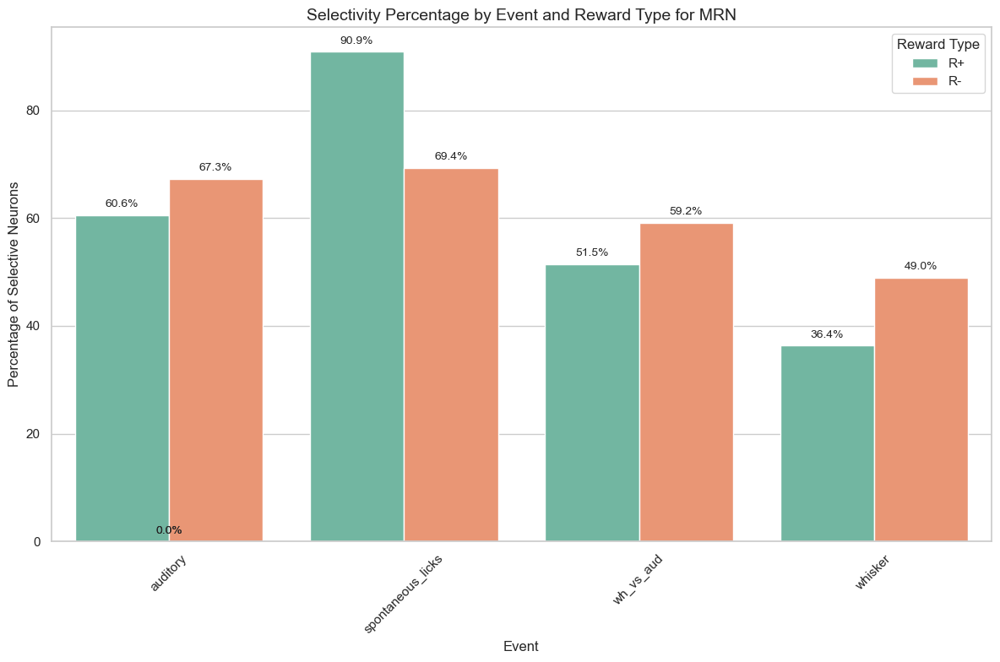

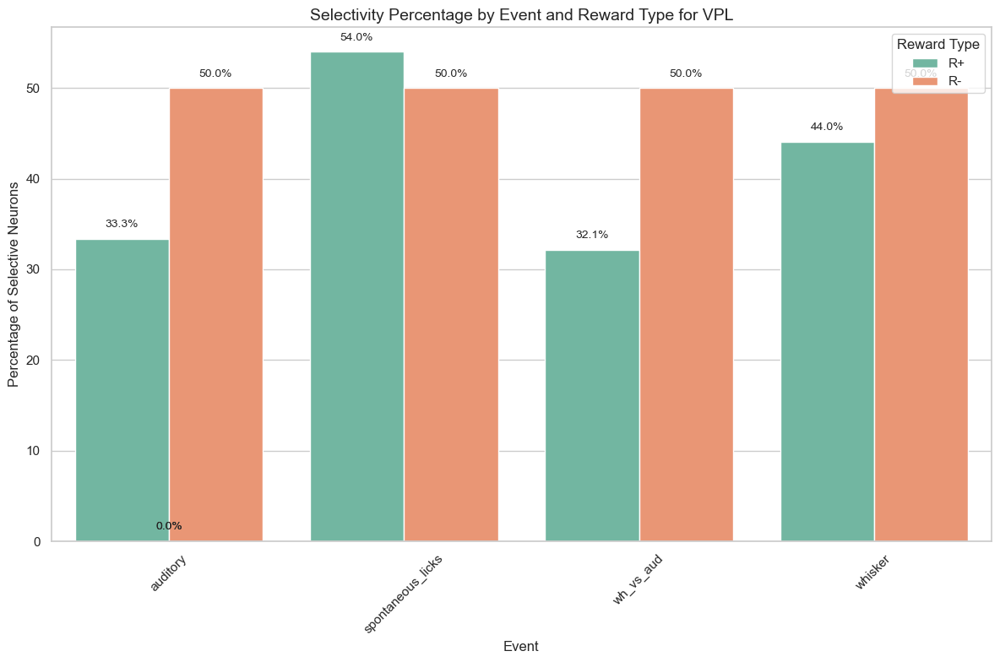

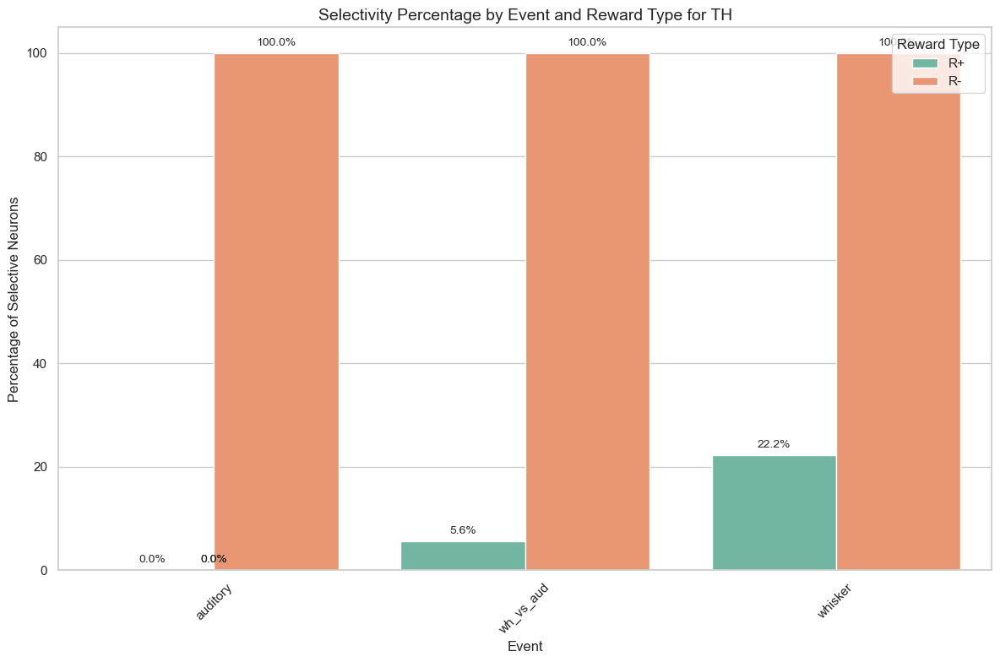

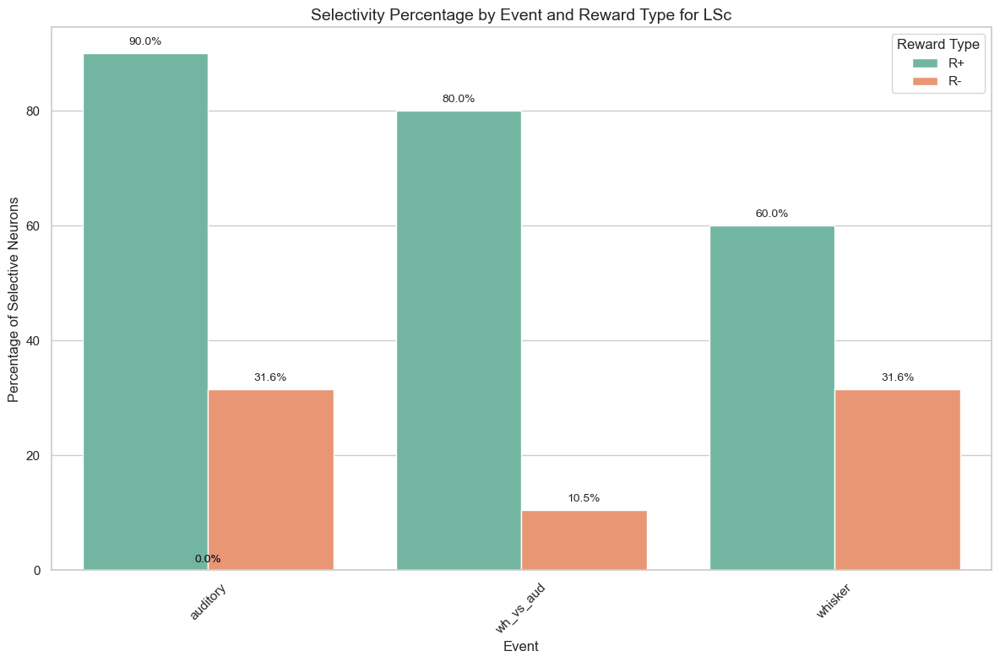

In [89]:
import matplotlib.pyplot as plt
import seaborn as sns

for region in ['MRN', 'VPL', 'TH', 'LSc']:

    # Filter data for 'SSp-bfd'
    df_1_region = df[df['area_acronym'] == region]

    # Drop NaN values in the 'selective' column
    df_filtered = df_1_region.dropna(subset=['selective'])

    # Calculate percentages grouped by 'event' and 'wh_reward'
    percentages = df_filtered.groupby(['event', 'wh_reward'])['selective'].mean().reset_index()
    percentages['selective'] *= 100  # Convert to percentage

    # Create the plot
    plt.figure(figsize=(12, 8))
    sns.barplot(x='event', y='selective', hue='wh_reward', data=percentages, palette='Set2')

    # Annotate percentages on the bars
    for i, bar in enumerate(plt.gca().patches):
        height = bar.get_height()
        plt.gca().text(
            bar.get_x() + bar.get_width() / 2., 
            height + 1, 
            f"{height:.1f}%", 
            ha='center', 
            va='bottom', 
            fontsize=10
        )

    # Add labels and title
    plt.xlabel('Event', fontsize=12)
    plt.ylabel('Percentage of Selective Neurons', fontsize=12)
    plt.title(f'Selectivity Percentage by Event and Reward Type for {region}', fontsize=14)
    plt.xticks(rotation=45)
    plt.legend(title='Reward Type', loc='upper right')
    plt.tight_layout()
    plt.show()

    # It means that 25% of the neurons in the SSp-bfd brain region were selective during spontaneous licking events 
    # with a reward type of R+.

In [16]:
df[df['has context']==False]['context'].unique()

array(['active', 'passive_pre', 'passive_post', nan], dtype=object)

In [45]:
all_acronyms = df['area_acronym'].unique()

array(['CA3', 'AUDp', 'CA2', 'STR', 'GPe', 'CP', 'SSp-n', 'MOp', 'MOs',
       'SSp-bfd', 'ZI', 'LGv', 'AUDd', 'RT', 'CEAl', 'SSs', 'AUDv', 'AIv',
       'AId', 'SSp-m', 'LA', 'SF', 'MS', 'LSr', 'LSc', 'ACAv', 'ACAd',
       'OLF', 'ORBl', 'FRP', 'MRN', 'PAG', 'SCm', 'SCs', 'RSPv', 'RSPd',
       'ACB', 'ORBvl', 'ORBm', 'PL', 'EPd', 'PIR', 'SSp-un', 'SSp-ul',
       'CLA', 'PO', 'VPL', 'LD', 'TH', 'AON', 'VPM', 'LGd-co', 'CA1',
       'AV'], dtype=object)

### Now let's visualize the overall data:

In [35]:
display(df.head())

,cluster_id,ccf_acronym,ccf_name,ccf_parent_id,ccf_parent_acronym,ccf_parent_name,spike_times,mouse_id,context,event,...,AUC,Transformed AUC,p-values positive,p-values negative,selective,direction,pre_time,post_time,area_acronym,has context
0,1,CA3,Field CA3,375.0,CA,Ammon's horn,[1.10997831e-02 3.79359254e-01 4.41958031e-01 ...,AB120_20240811_143102,active,whisker,...,0.511540,0.023079,0.822,0.178,False,none,0.2,0.2,CA3,False
1,5,CA3,Field CA3,375.0,CA,Ammon's horn,[8.50683378e-01 8.61316503e-01 8.73749594e-01 ...,AB120_20240811_143102,active,whisker,...,0.496881,-0.006239,0.877,0.123,False,none,0.2,0.2,CA3,False
2,9,CA3,Field CA3,375.0,CA,Ammon's horn,[8.57983235e-02 1.90962935e-01 2.93227604e-01 ...,AB120_20240811_143102,active,whisker,...,0.498041,-0.003917,0.889,0.111,False,none,0.2,0.2,CA3,False
3,12,CA3,Field CA3,375.0,CA,Ammon's horn,[8.19650651e-02 1.73179949e+00 2.62854864e+00 ...,AB120_20240811_143102,active,whisker,...,0.488184,-0.023633,0.775,0.245,False,none,0.2,0.2,CA3,False
4,14,CA3,Field CA3,375.0,CA,Ammon's horn,[4.24688368e+00 5.92881749e+00 6.04198194e+00 ...,AB120_20240811_143102,active,whisker,...,0.477341,-0.045318,0.877,0.123,False,none,0.2,0.2,CA3,False


### Start with overall selectivity aggregated throughout the different areas

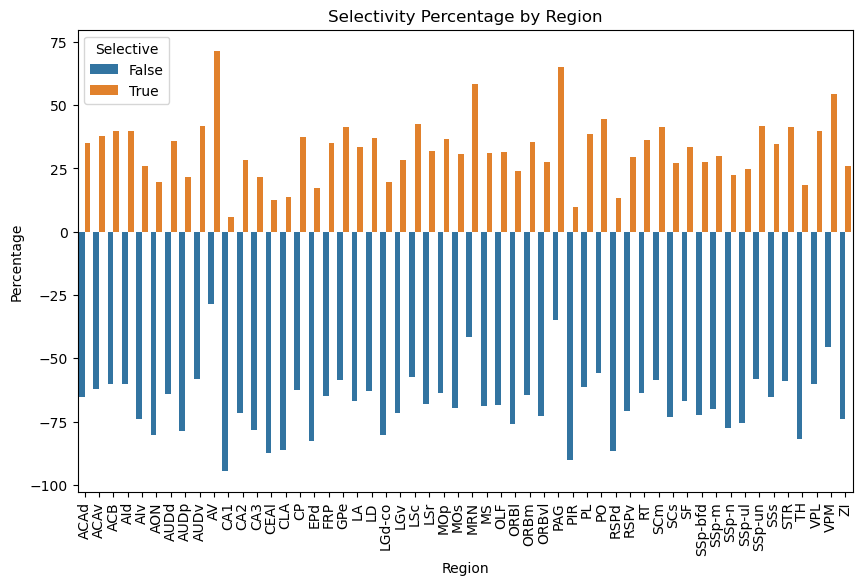

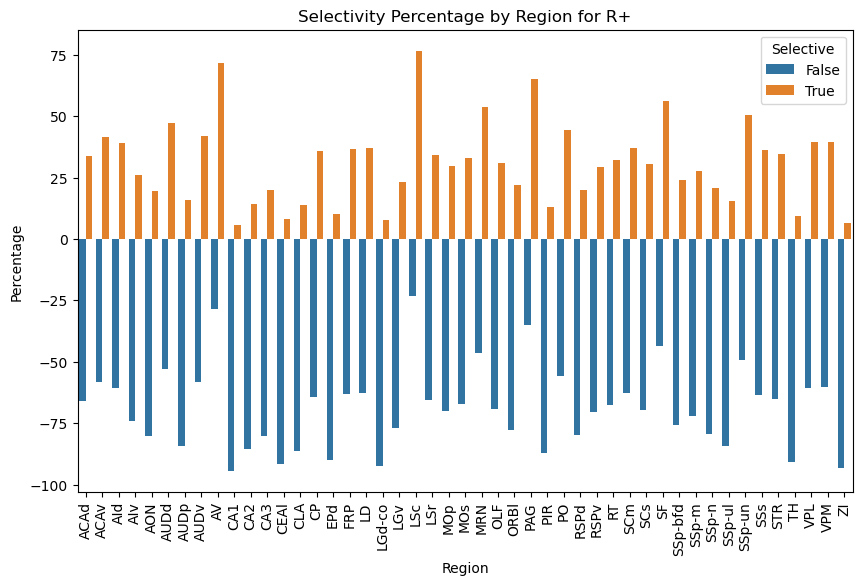

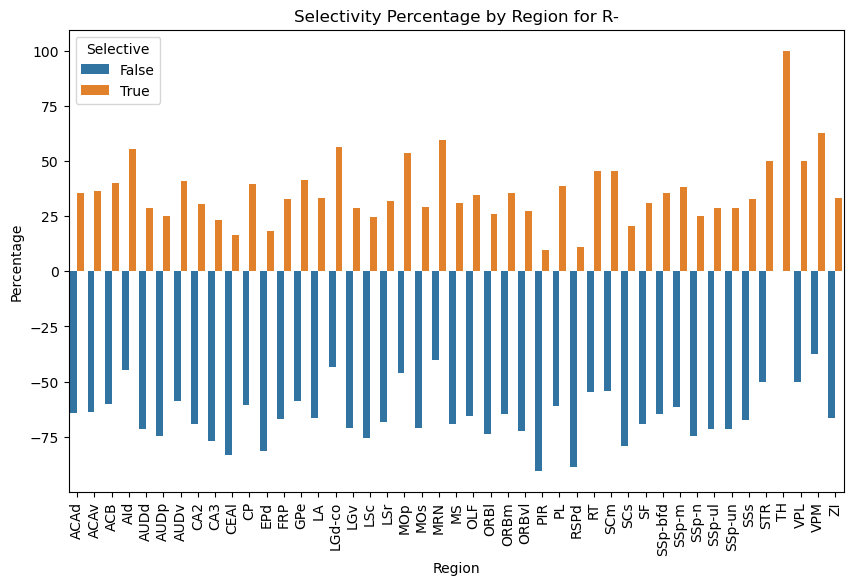

In [ ]:
#percentage of selective neurons for each region
percentage_df = df.groupby(['area_acronym', 'selective']).size().reset_index(name='count')
total_counts = percentage_df.groupby('area_acronym')['count'].transform('sum')
percentage_df['percentage'] = (percentage_df['count'] / total_counts) * 100
percentage_df.loc[percentage_df['selective'] == False, 'percentage'] *= -1

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='area_acronym', y='percentage', hue='selective', data=percentage_df)
plt.title('Selectivity Percentage by Region')
plt.ylabel('Percentage')
plt.xlabel('Region')
plt.xticks(rotation = 90)
plt.legend(title='Selective')
plt.show()


import matplotlib.pyplot as plt
import seaborn as sns



percentage_df = df[df['wh_reward']=='R+'].groupby(['area_acronym', 'selective']).size().reset_index(name='count')
total_counts = percentage_df.groupby('area_acronym')['count'].transform('sum')
percentage_df['percentage'] = (percentage_df['count'] / total_counts) * 100
percentage_df.loc[percentage_df['selective'] == False, 'percentage'] *= -1

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='area_acronym', y='percentage', hue='selective', data=percentage_df)
plt.title('Selectivity Percentage by Region for R+')
plt.ylabel('Percentage')
plt.xlabel('Region')
plt.xticks(rotation = 90)
plt.legend(title='Selective')
plt.show()


percentage_df = df[df['wh_reward']=='R-'].groupby(['area_acronym', 'selective']).size().reset_index(name='count')
total_counts = percentage_df.groupby('area_acronym')['count'].transform('sum')
percentage_df['percentage'] = (percentage_df['count'] / total_counts) * 100
percentage_df.loc[percentage_df['selective'] == False, 'percentage'] *= -1

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='area_acronym', y='percentage', hue='selective', data=percentage_df)
plt.title('Selectivity Percentage by Region for R-')
plt.ylabel('Percentage')
plt.xlabel('Region')
plt.xticks(rotation = 90)
plt.legend(title='Selective')
plt.show()



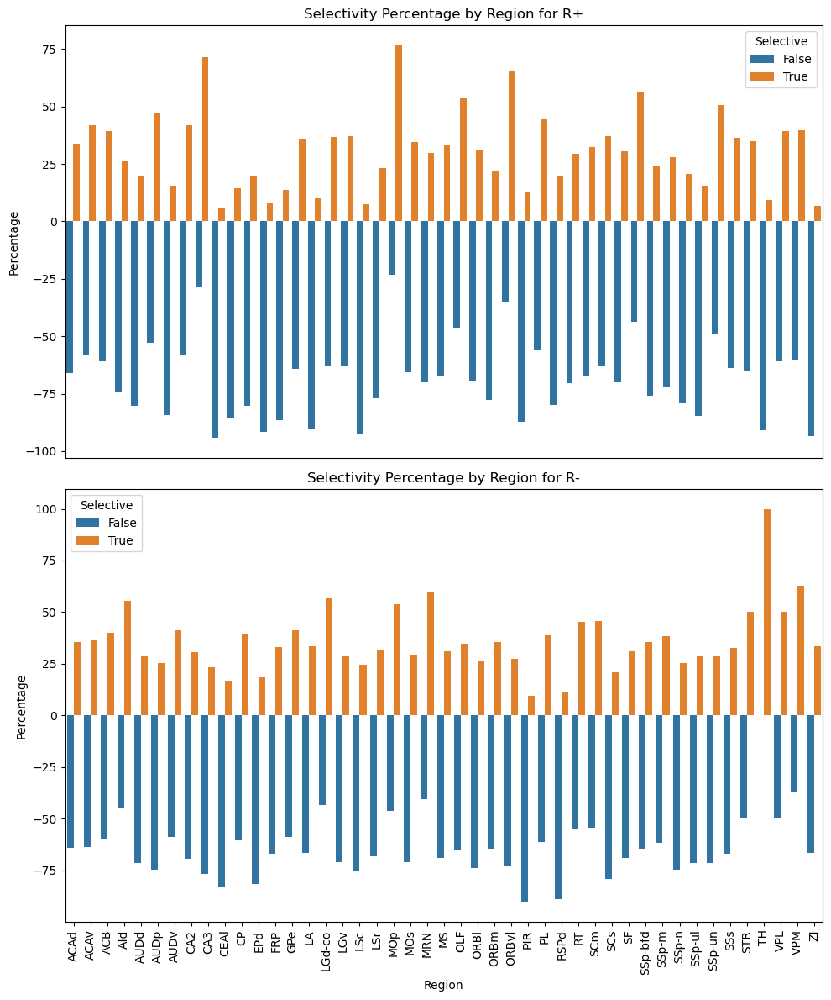

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a 2-row, 1-column grid of subplots
fig, axes = plt.subplots(2, 1, figsize=(10, 12))

# Plot for 'R+'
percentage_df = df[df['wh_reward'] == 'R+'].groupby(['area_acronym', 'selective']).size().reset_index(name='count')
total_counts = percentage_df.groupby('area_acronym')['count'].transform('sum')
percentage_df['percentage'] = (percentage_df['count'] / total_counts) * 100
percentage_df.loc[percentage_df['selective'] == False, 'percentage'] *= -1

sns.barplot(x='area_acronym', y='percentage', hue='selective', data=percentage_df, ax=axes[0])
axes[0].set_title('Selectivity Percentage by Region for R+')
axes[0].set_ylabel('Percentage')
axes[0].set_xlabel('')  # Remove x-axis label for the top plot
axes[0].set_xticklabels([]) 
axes[0].set_xticks([])
axes[0].tick_params(axis='x', labelrotation=90)  # Rotate x-axis labels for the top plot
axes[0].legend(title='Selective')

# Plot for 'R-'
percentage_df = df[df['wh_reward'] == 'R-'].groupby(['area_acronym', 'selective']).size().reset_index(name='count')
total_counts = percentage_df.groupby('area_acronym')['count'].transform('sum')
percentage_df['percentage'] = (percentage_df['count'] / total_counts) * 100
percentage_df.loc[percentage_df['selective'] == False, 'percentage'] *= -1

sns.barplot(x='area_acronym', y='percentage', hue='selective', data=percentage_df, ax=axes[1])
axes[1].set_title('Selectivity Percentage by Region for R-')
axes[1].set_ylabel('Percentage')
axes[1].set_xlabel('Region')  # Add x-axis label only for the bottom plot
axes[1].tick_params(axis='x', labelrotation=90)  # Rotate x-axis labels for the bottom plot
axes[1].legend(title='Selective')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


### Selectivity averaged over each mice and area_regions

/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_56548/3658901017.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_56548/3658901017.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_56548/3658901017.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_56548/3658901017.py:56: UserWarning: set_ticklabels() should only be used with a fixed number of t

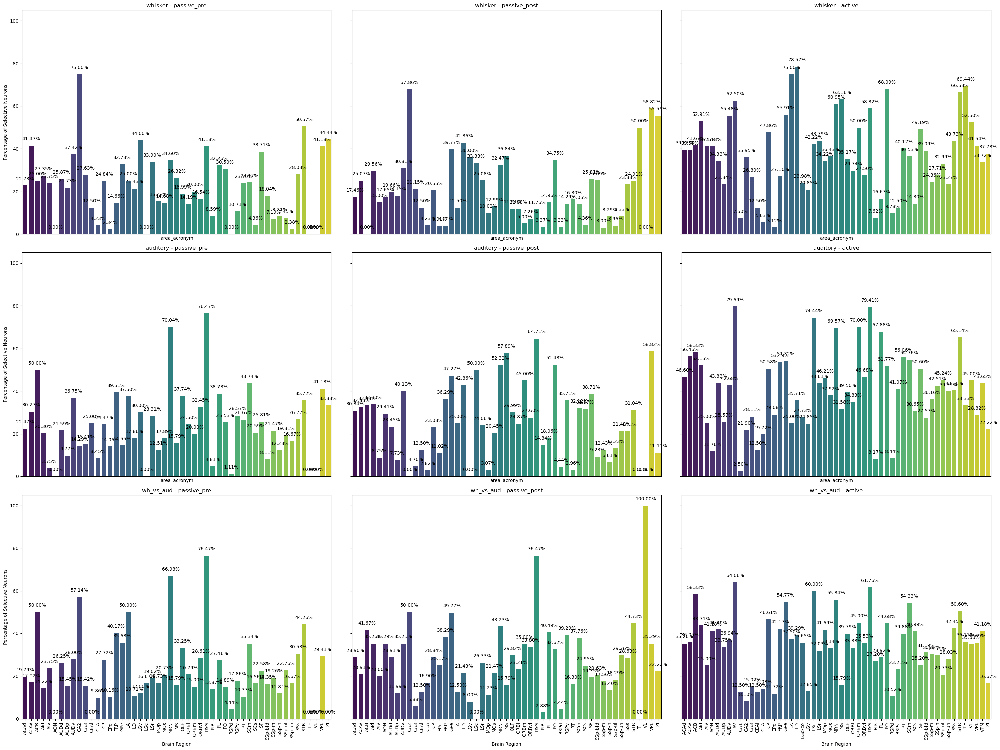

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_all_categories(df, categories, contexts, offset=2, over_mouse=True):
    """
    Generates a grid of plots where each row corresponds to a category and each column corresponds to a context.

    Parameters:
    - df: DataFrame with 'mouse_id', 'area_acronym' (brain region), 'selective', and other necessary columns.
    - categories: List of categories to plot (e.g., ['whisker', 'auditory', 'wh_vs_aud']).
    - contexts: List of contexts to plot (e.g., ['passive_pre', 'passive_post', 'active']).
    - offset: Distance for percentage annotation above the bars (default=2).
    - over_mouse: Whether to calculate percentages over individual mice (True) or overall (False).
    """
    # Set up the figure and axes grid, adjusting to group by context
    num_rows = len(categories)
    num_cols = len(contexts)
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows), sharey=True)
    axes = axes if num_rows > 1 else [axes]  # Ensure axes is always a 2D array

    for col_idx, context in enumerate(contexts):  # Iterate over contexts (columns)
        for row_idx, category in enumerate(categories):  # Iterate over categories (rows)
            ax = axes[row_idx][col_idx] if num_rows > 1 else axes[col_idx]

            # Filter data based on category and context
            if category == 'spontaneous_licks':
                df_filtered = df[df['event'] == category]
            else:
                df_filtered = df[(df['event'] == category) & (df['context'] == context)]

            # Drop NaN values and calculate percentages
            df_filtered = df_filtered.dropna(subset=['selective'])
            df_filtered['selective'] = df_filtered['selective'].astype(bool)

            if over_mouse:
                percentages = df_filtered.groupby(['area_acronym', 'mouse_id'])['selective'].mean().reset_index()
            else:
                percentages = df_filtered.groupby(['area_acronym'])['selective'].mean().reset_index()
            percentages['selective'] *= 100
            avg_percentages = percentages.groupby('area_acronym')['selective'].mean().reset_index()

            # Plot data
            sns.barplot(
                x='area_acronym', y='selective', data=avg_percentages, palette='viridis',
                ax=ax, order=avg_percentages['area_acronym'].tolist()
            )

            # Add annotations
            for i, row in avg_percentages.iterrows():
                ax.text(i, row['selective'] + offset, f"{row['selective']:.2f}%", ha='center', va='bottom', color='black')

            # Titles and labels
            ax.set_title(f"{category} - {context}")
            if row_idx == num_rows - 1:  # Only add x-axis label to bottom row
                ax.set_xlabel('Brain Region')
                ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')
            else:
                ax.set_xticks([])  # Remove x-ticks and labels for other rows

            if col_idx == 0:  # Only add y-axis label to first column
                ax.set_ylabel('Percentage of Selective Neurons')
            else:
                ax.set_ylabel('')

    # Adjust layout
    plt.tight_layout(rect=[0, 0.5, 2, 2])  # Leave space for suptitle
    plt.show()


categories = ['whisker', 'auditory', 'wh_vs_aud']
contexts = ['passive_pre', 'passive_post', 'active']
plot_all_categories(df, categories, contexts, offset=2, over_mouse=True)


In [ ]:
categories = ['whisker', 'auditory', 'wh_vs_aud']
contexts = ['passive_pre', 'passive_post', 'active']

for category in categories:
    for context in contexts:
        plot_selectivity(df, offset=2, category=category, context=context, over_mouse=True)

plot_selectivity(df, offset=2, category='spontaneous_licks', over_mouse=True)

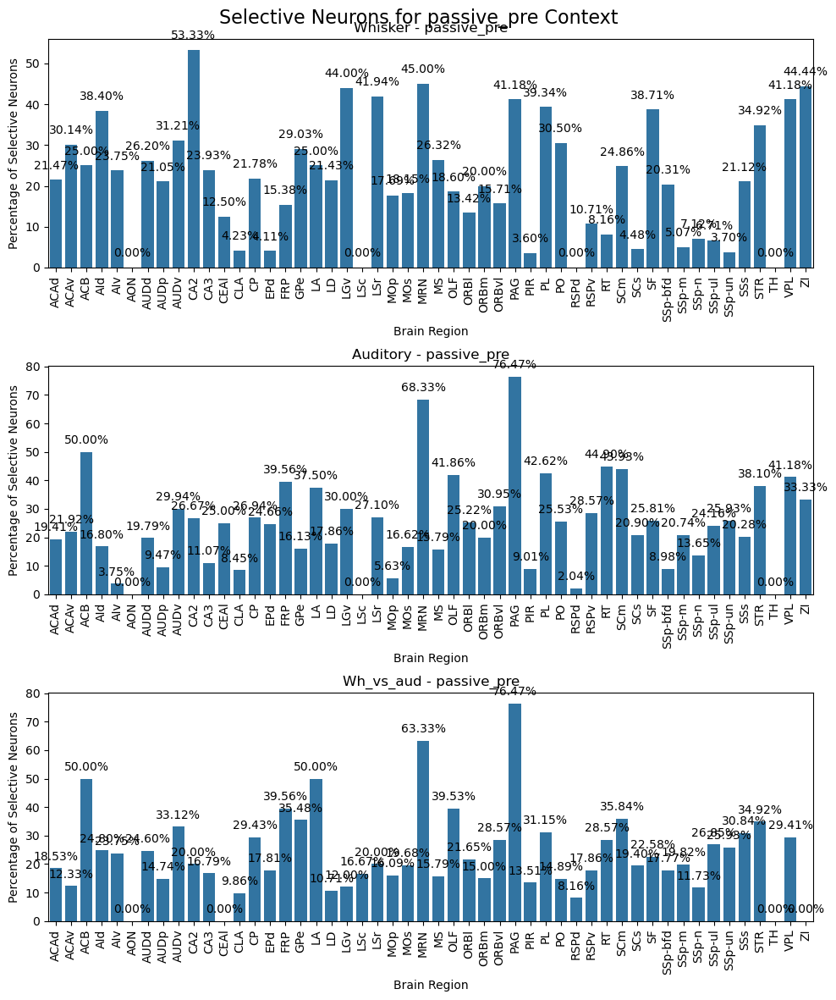

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

categories = ['whisker', 'auditory', 'wh_vs_aud']
context = 'passive_pre'  # Set your context here

def plot_selectivity(df, category='whisker', context='active', over_mouse=False):
    """
    Plots the average percentage of selective neurons per brain region for the given category and context.
    
    Parameters:
    - df: DataFrame with 'mouse_id', 'area_acronym' (brain region), and 'selective'.
    - category: Category for the event ('whisker', 'auditory', etc.)
    - context: Context for the event (e.g., 'active', 'passive_pre', etc.)
    """
    # Filter the dataframe for the given category and context
    df_filtered = df[(df['event'] == category) & (df['context'] == context)]

    # Drop NaN values in the 'selective' column
    df_filtered = df_filtered.dropna(subset=['selective'])

    # Ensure 'selective' is a binary column (True/False)
    df_filtered['selective'] = df_filtered['selective'].astype(bool)

    # Calculate the percentage of selective neurons per mouse and brain region
    if over_mouse:
        percentages = df_filtered.groupby(['area_acronym', 'mouse_id'])['selective'].mean().reset_index()
    else:
        percentages = df_filtered.groupby(['area_acronym'])['selective'].mean().reset_index()
    percentages['selective'] *= 100  # Convert to percentage

    return percentages

# Create a figure with 3 vertically stacked subplots
fig, axs = plt.subplots(3, 1, figsize=(10, 12))  # 3 rows, 1 column

# Loop through categories and plot each one in a separate subplot
for i, category in enumerate(categories):
    ax = axs[i]  # Access the current axis for this category
    
    # Plot the data for the current category and context
    avg_percentages = plot_selectivity(df, category=category, context=context)
    
    # Create a seaborn barplot for the current category
    sns.barplot(x='area_acronym', y='selective', data=avg_percentages, ax=ax) #palette='viridis'
    
    # Set the title and labels for the current subplot
    ax.set_title(f"{category.capitalize()} - {context}")
    ax.set_xlabel('Brain Region')
    ax.set_ylabel('Percentage of Selective Neurons')
    ax.tick_params(axis='x', rotation=90)

    # Add percentage annotations
    for idx, row in avg_percentages.iterrows():
        ax.text(idx, row['selective'] + 2, f"{row['selective']:.2f}%", ha='center', va='bottom', color='black')

# Adjust layout to avoid overlap
plt.tight_layout()
plt.suptitle(f'Selective Neurons for {context} Context', fontsize=16)
plt.subplots_adjust(top=0.95)  # Adjust the top to fit the main title
plt.show()


### Selectivity averaged over each region only

In [51]:
categories = ['whisker', 'auditory', 'wh_vs_aud']
contexts = ['passive_pre', 'passive_post', 'auditory']

for category in categories:
    for context in contexts:
        plot_selectivity(df, category=category, context=context)

#plot_selectivity(df, offset=2, category='spontaneous_licks')

### For spontaneous licks

In [55]:
df

,cluster_id,ccf_acronym,ccf_name,ccf_parent_id,ccf_parent_acronym,ccf_parent_name,spike_times,mouse_id,context,event,...,Transformed AUC,p-values positive,p-values negative,selective,direction,pre_time,post_time,area_acronym,has context,wh_reward
0,1,CA3,Field CA3,375.0,CA,Ammon's horn,[1.10997831e-02 3.79359254e-01 4.41958031e-01 ...,AB120_20240811_143102,active,whisker,...,0.114714,0.812,0.188,False,none,0.2,0.2,CA3,False,R-
1,5,CA3,Field CA3,375.0,CA,Ammon's horn,[8.50683378e-01 8.61316503e-01 8.73749594e-01 ...,AB120_20240811_143102,active,whisker,...,0.088271,0.892,0.108,False,none,0.2,0.2,CA3,False,R-
2,9,CA3,Field CA3,375.0,CA,Ammon's horn,[8.57983235e-02 1.90962935e-01 2.93227604e-01 ...,AB120_20240811_143102,active,whisker,...,0.060016,0.879,0.122,False,none,0.2,0.2,CA3,False,R-
3,12,CA3,Field CA3,375.0,CA,Ammon's horn,[8.19650651e-02 1.73179949e+00 2.62854864e+00 ...,AB120_20240811_143102,active,whisker,...,0.014756,0.771,0.247,False,none,0.2,0.2,CA3,False,R-
4,14,CA3,Field CA3,375.0,CA,Ammon's horn,[4.24688368e+00 5.92881749e+00 6.04198194e+00 ...,AB120_20240811_143102,active,whisker,...,0.081816,0.861,0.139,False,none,0.2,0.2,CA3,False,R-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122889,644,SSp-m6a,"Primary somatosensory area, mouth, layer 6a",345.0,SSp-m,"Primary somatosensory area, mouth",[4.82992796e-02 3.64093569e+00 4.10362446e+00 ...,AB107_20240318_121423,NaN,spontaneous_licks,...,0.032883,0.941,0.065,False,none,0.2,0.2,SSp-m,True,R+
122890,646,SSp-m6a,"Primary somatosensory area, mouth, layer 6a",345.0,SSp-m,"Primary somatosensory area, mouth",[ 4.45451922 5.01817748 5.58706533 ...,AB107_20240318_121423,NaN,spontaneous_licks,...,-0.014349,0.215,0.818,False,none,0.2,0.2,SSp-m,True,R+
122891,647,SSp-m6a,"Primary somatosensory area, mouth, layer 6a",345.0,SSp-m,"Primary somatosensory area, mouth",[3.12295342e-01 3.82394296e-01 5.38191972e-01 ...,AB107_20240318_121423,NaN,spontaneous_licks,...,0.137755,1.000,0.000,True,negative,0.2,0.2,SSp-m,True,R+
122892,650,SSp-m5,"Primary somatosensory area, mouth, layer 5",345.0,SSp-m,"Primary somatosensory area, mouth",[1.98969965e+00 2.33309120e+00 3.46880493e+00 ...,AB107_20240318_121423,NaN,spontaneous_licks,...,0.065957,0.974,0.026,True,negative,0.2,0.2,SSp-m,True,R+


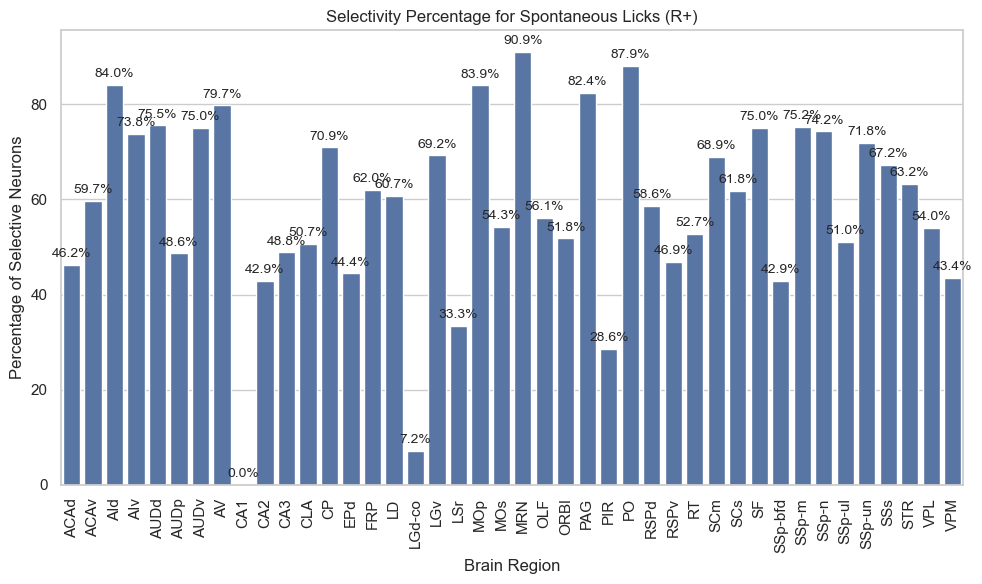

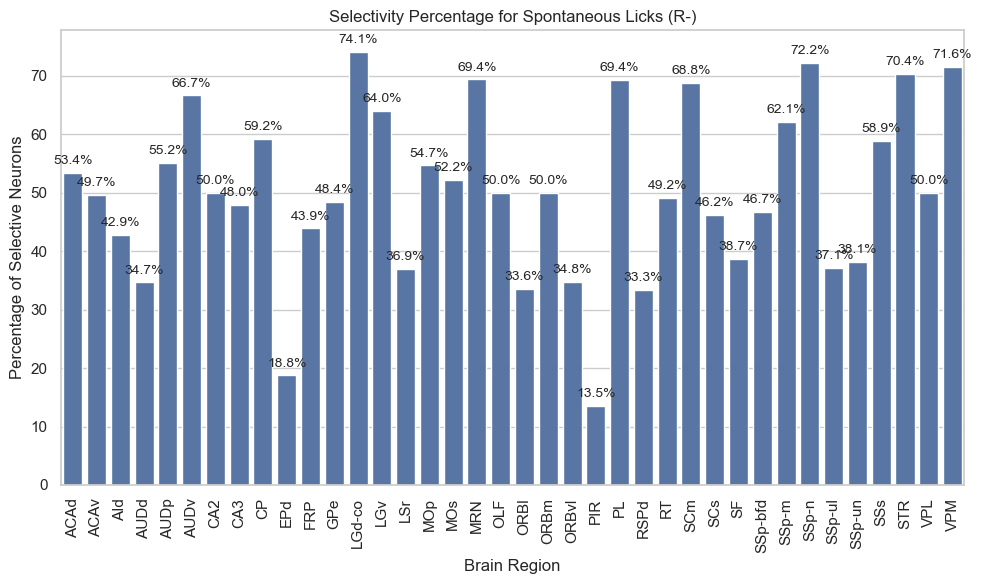

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for R+
df_filtered = df[(df['event'] == 'spontaneous_licks') & (df['wh_reward'] == 'R+')]
# Drop NaN values in the 'selective' column
df_filtered = df_filtered.dropna(subset=['selective'])
# Calculate percentages
percentages = df_filtered.groupby(['area_acronym'])['selective'].mean().reset_index()
percentages['selective'] *= 100  # Convert to percentage
# Create the plot
plt.figure(figsize=(10, 6))
sns.barplot(x='area_acronym', y='selective', data=percentages)
# Annotate percentages on the bars
for i, row in percentages.iterrows():
    plt.text(i, row['selective'] + 1, f"{row['selective']:.1f}%", ha='center', va='bottom', fontsize=10)
# Add labels and title
plt.xlabel('Brain Region')
plt.ylabel('Percentage of Selective Neurons')
plt.title('Selectivity Percentage for Spontaneous Licks (R+)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


# Filter data for R-
df_filtered = df[(df['event'] == 'spontaneous_licks') & (df['wh_reward'] == 'R-')]
# Drop NaN values in the 'selective' column
df_filtered = df_filtered.dropna(subset=['selective'])

# Calculate percentages
percentages = df_filtered.groupby(['area_acronym'])['selective'].mean().reset_index()
percentages['selective'] *= 100  # Convert to percentage

# Create the plot
plt.figure(figsize=(10, 6))
sns.barplot(x='area_acronym', y='selective', data=percentages)

# Annotate percentages on the bars
for i, row in percentages.iterrows():
    plt.text(i, row['selective'] + 1, f"{row['selective']:.1f}%", ha='center', va='bottom', fontsize=10)

# Add labels and title
plt.xlabel('Brain Region')
plt.ylabel('Percentage of Selective Neurons')
plt.title('Selectivity Percentage for Spontaneous Licks (R-)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()




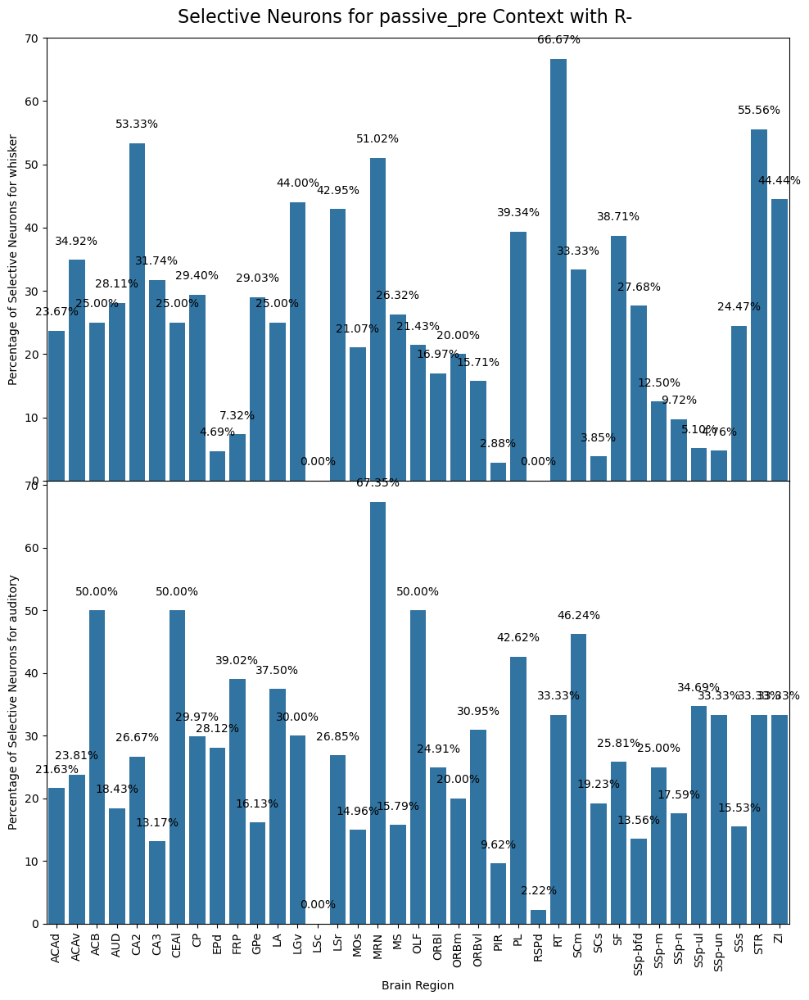

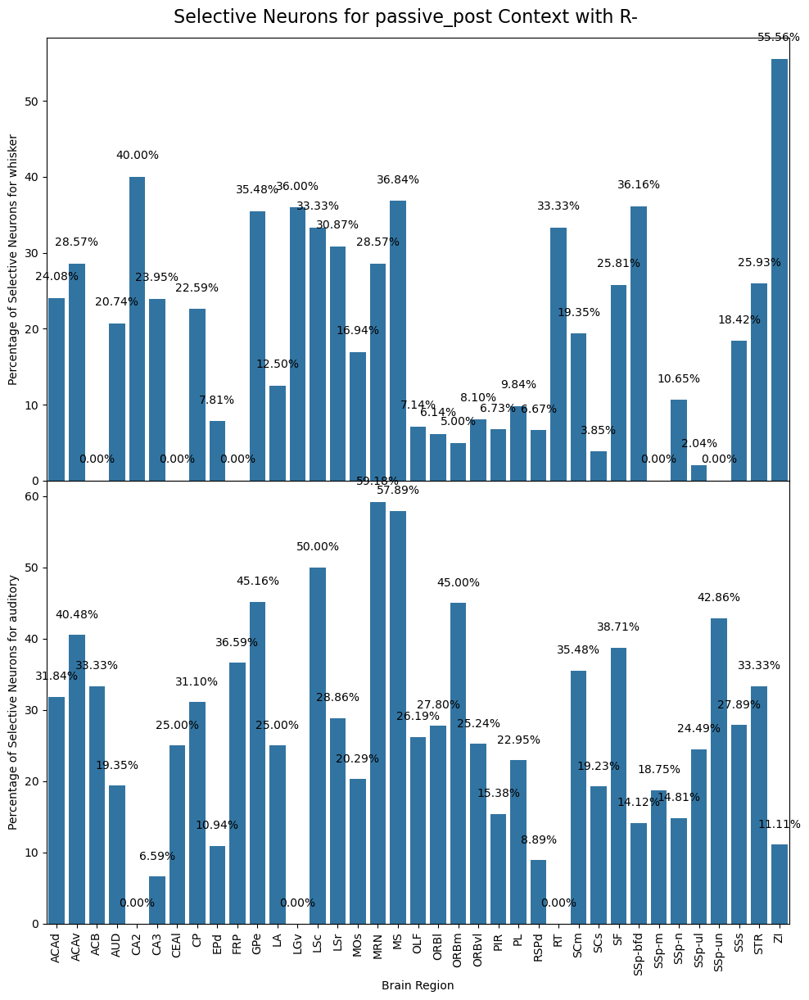

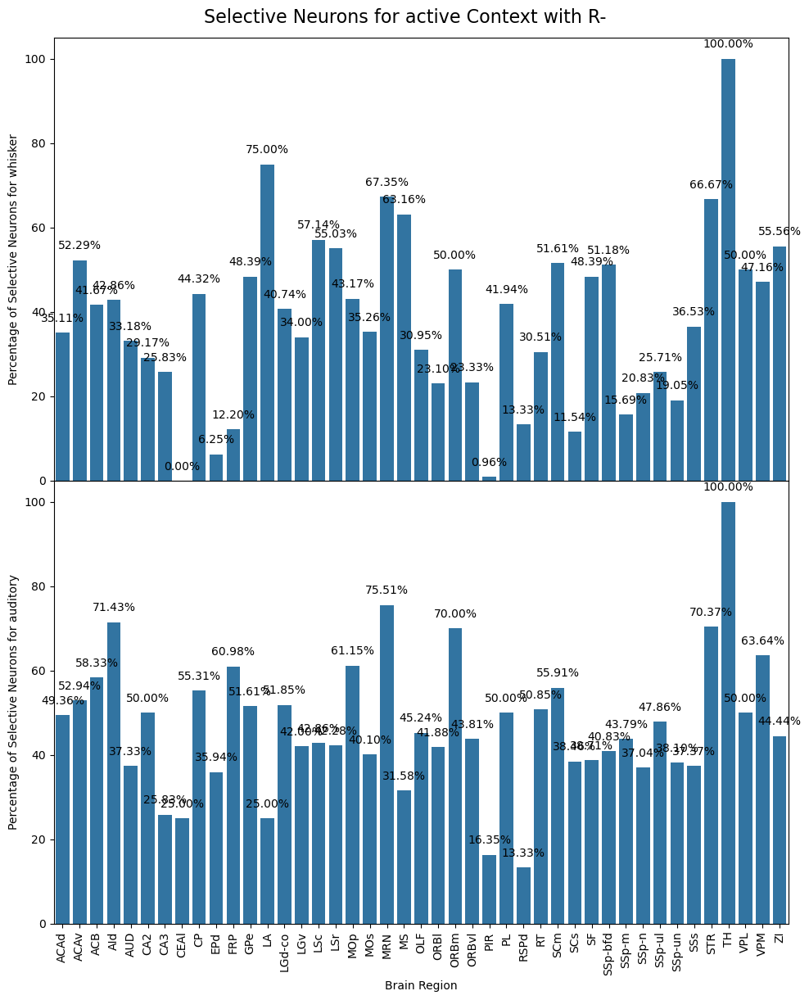

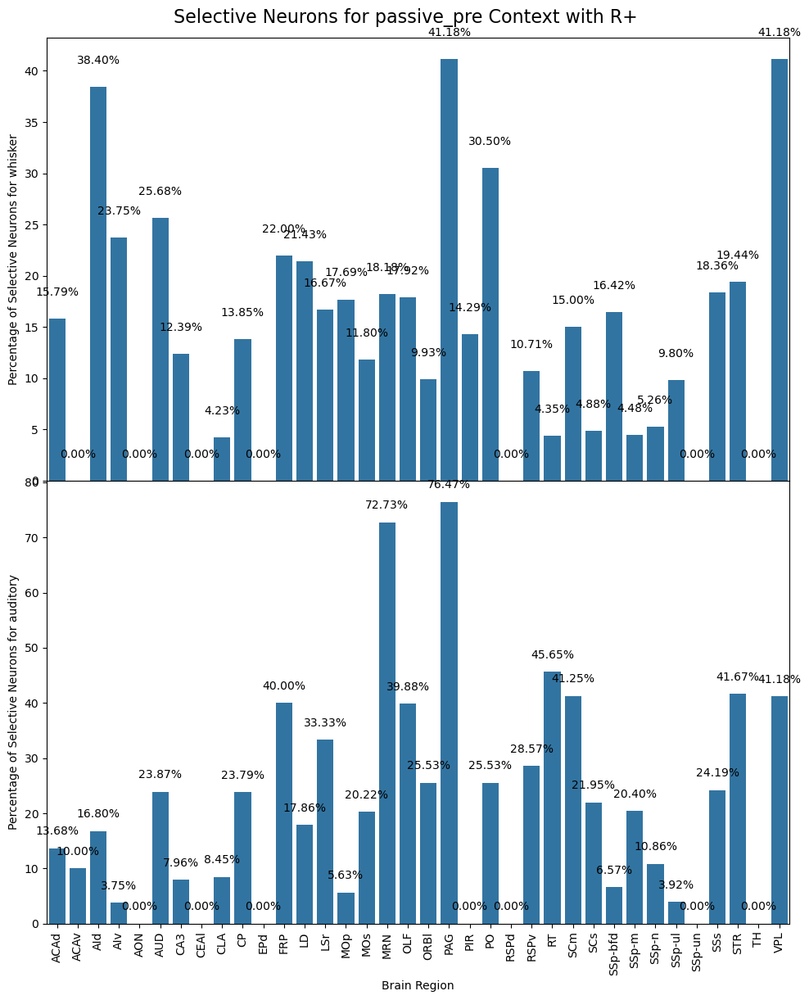

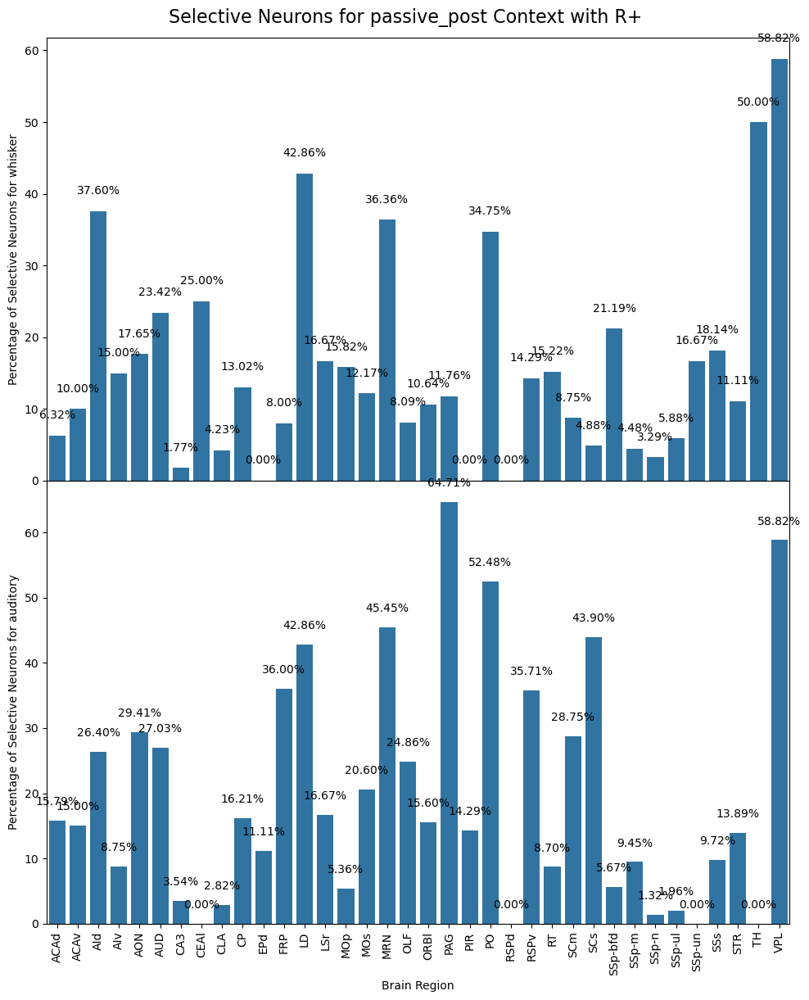

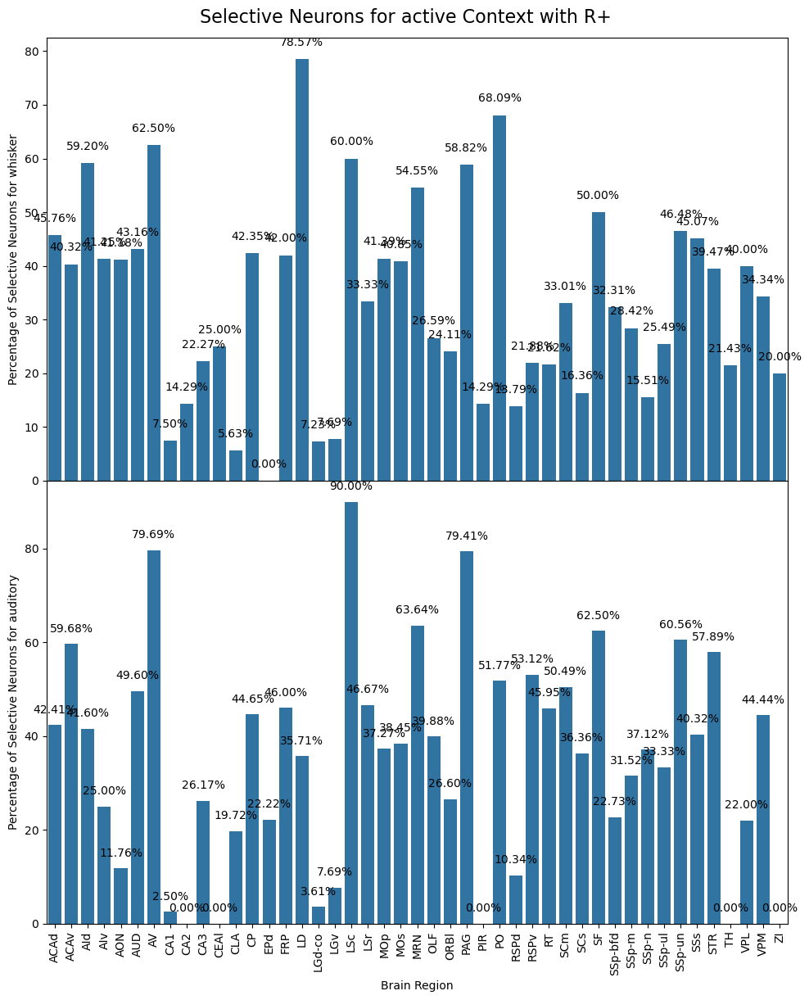

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns

categories = ['whisker', 'auditory']#, 'wh_vs_aud']
contexts = ['passive_pre', 'passive_post', 'active']  # Set your context here
wh_rewards = ['R+', 'R-']

def percentage_selectivity(df, category='whisker', context='', over_mouse=False, wh_reward = ''):
    """
    Plots the average percentage of selective neurons per brain region for the given category and context.
    
    Parameters:
    - df: DataFrame with 'mouse_id', 'area_acronym' (brain region), and 'selective'.
    - category: Category for the event ('whisker', 'auditory', etc.)
    - context: Context for the event (e.g., 'active', 'passive_pre', etc.)
    """
    if wh_reward != '':
        # Filter the dataframe for the given category and context
        if category == 'spontaneous_licks':
            df_filtered = df[(df['event'] == category)&(df['wh_reward'] == wh_reward)]
        else:
            df_filtered = df[(df['event'] == category) & (df['context'] == context) & (df['wh_reward'] == wh_reward)]
    else:
        if category == 'spontaneous_licks':
            df_filtered = df[(df['event'] == category)]
        else:
            df_filtered = df[(df['event'] == category) & (df['context'] == context)]
    

    # Drop NaN values in the 'selective' column
    df_filtered = df_filtered.dropna(subset=['selective'])

    # Ensure 'selective' is a binary column (True/False)
    df_filtered['selective'] = df_filtered['selective'].astype(bool)

    # Calculate the percentage of selective neurons per mouse and brain region
    if over_mouse:
        percentages = df_filtered.groupby(['area_acronym', 'mouse_id'])['selective'].mean().reset_index()
    else:
        percentages = df_filtered.groupby(['area_acronym'])['selective'].mean().reset_index()
    percentages['selective'] *= 100  # Convert to percentage

    return percentages


for wh_reward in ['R-', 'R+']:
    for context in contexts:
        # Create a figure with 3 vertically stacked subplots
        fig, axs = plt.subplots(2, 1, figsize=(10, 12))  # 3 rows, 1 column

        # Loop through categories and plot each one in a separate subplot
        for i, category in enumerate(categories):
            
            ax = axs[i]
            
            # Plot the data for the current category and context
            avg_percentages = percentage_selectivity(df, category=category, context=context, wh_reward = wh_reward)
            
            # Create a seaborn barplot for the current category
            sns.barplot(x='area_acronym', y='selective', data=avg_percentages, ax = ax)#, palette='viridis', ax=ax)
            
            # Remove titles for individual subplots
            ax.set_title('')
            
            # Set the y-axis label for all plots
            ax.set_ylabel(f'Percentage of Selective Neurons for {category}')
            
            # Add percentage annotations
            for idx, row in avg_percentages.iterrows():
                ax.text(idx, row['selective'] + 2, f"{row['selective']:.2f}%", ha='center', va='bottom', color='black')

            # Remove x-tick labels for the non-bottom-most plots
            if i < 1:
                ax.tick_params(axis='x', labelbottom=False)
                ax.set_xlabel('')  # Remove x-label for the top two plots
            else:
                ax.set_xlabel('Brain Region')  # Keep the x-label for the bottom-most plot

        # Adjust layout to avoid overlap
        plt.tight_layout()
        plt.suptitle(f'Selective Neurons for {context} Context with {wh_reward}', fontsize=16)
        plt.subplots_adjust(top=0.95, hspace=0)  # Adjust vertical space between subplots
        plt.xticks(rotation = 90)
        plt.show()

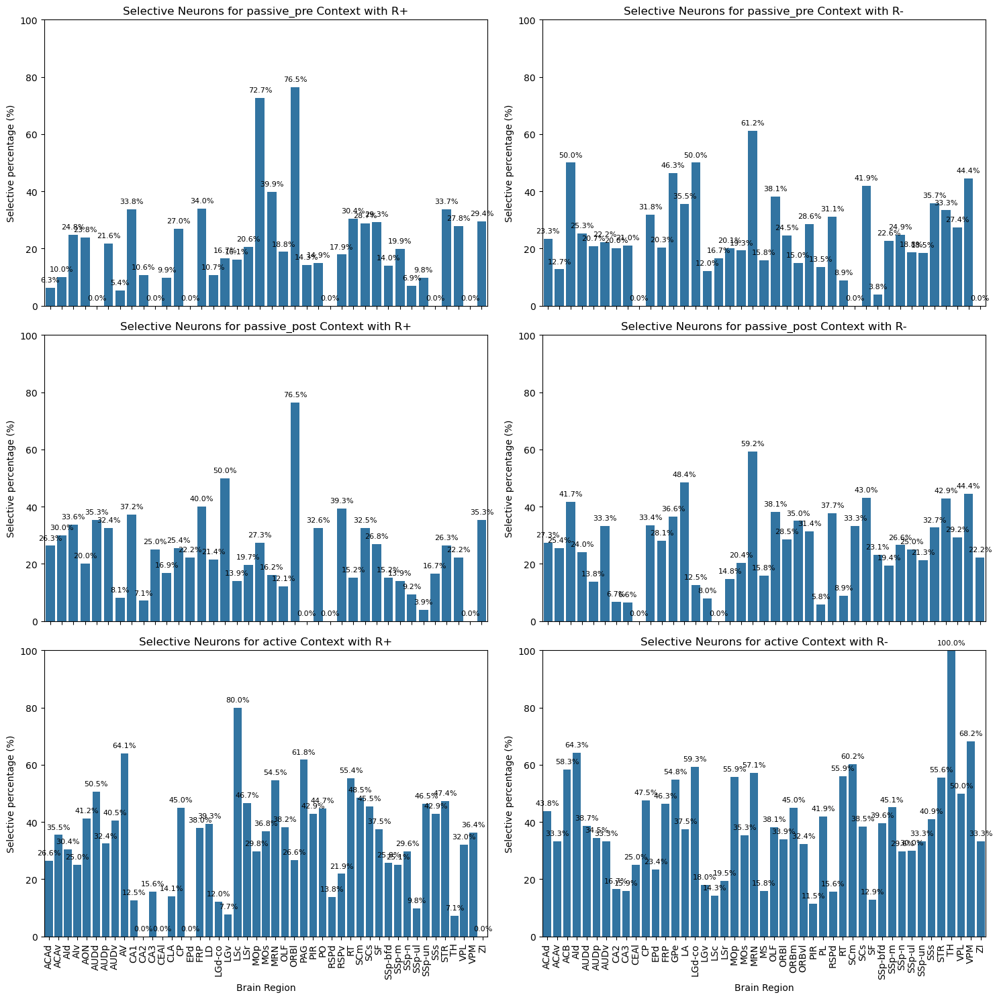

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to annotate bars with percentages
def annotate_bars(ax):
    for bar in ax.patches:
        height = bar.get_height()
        ax.annotate(f'{height:.1f}%',  # Format the percentage to 1 decimal place
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 5),  # Offset annotation slightly above the bar
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=8)

# Initialize the 3x2 plot
fig, axes = plt.subplots(3, 2, figsize=(15, 15))

# Data preparation
contexts = ['passive_pre', 'passive_post', 'active']
rewards = ['R+', 'R-']
plots_data = []

# Collect data for all subplots
for context in contexts:
    for reward in rewards:
        avg_percentages = percentage_selectivity(df, category='wh_vs_aud', context=context, wh_reward=reward)
        plots_data.append(avg_percentages)

# Find the common y-axis limits
y_min = min(data['selective'].min() for data in plots_data)
y_max = max(data['selective'].max() for data in plots_data)

# Create plots
for i, (context, reward) in enumerate([(c, r) for c in contexts for r in rewards]):
    row, col = divmod(i, 2)
    avg_percentages = percentage_selectivity(df, category='wh_vs_aud', context=context, wh_reward=reward)
    sns.barplot(x='area_acronym', y='selective', data=avg_percentages, ax=axes[row, col])
    
    # Set titles and labels
    axes[row, col].set_title(f'Selective Neurons for {context} Context with {reward}')
    axes[row, col].set_ylabel('Selective percentage (%)')
    if row < 2:  # Hide x-axis labels for top rows
        axes[row, col].set_xlabel('')
        axes[row, col].set_xticklabels([])
    else:  # Show x-axis labels only for the bottom row
        axes[row, col].set_xlabel('Brain Region')
        axes[row, col].tick_params(axis='x', rotation=90)

    # Annotate bars
    annotate_bars(axes[row, col])

    # Set common y-axis limits
    axes[row, col].set_ylim(y_min, y_max)

# Adjust layout
plt.tight_layout()
# Show the plot
plt.show()


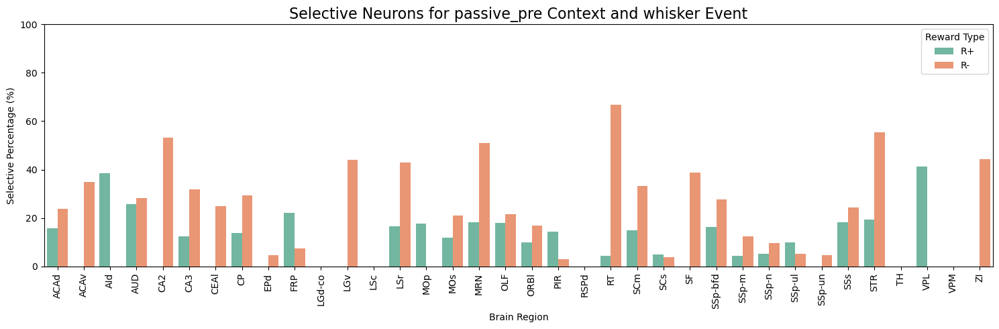

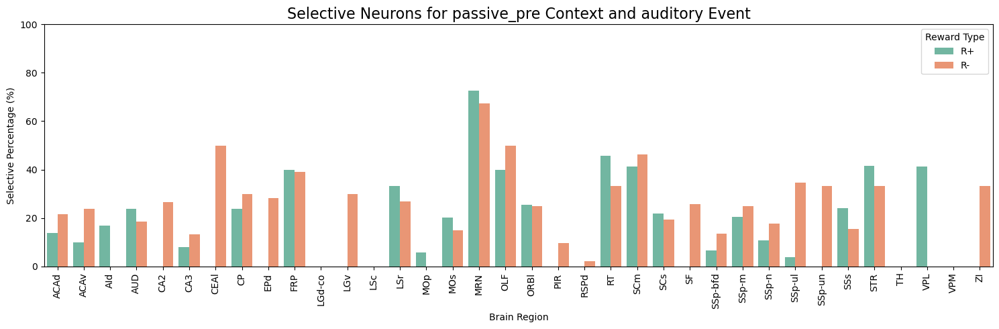

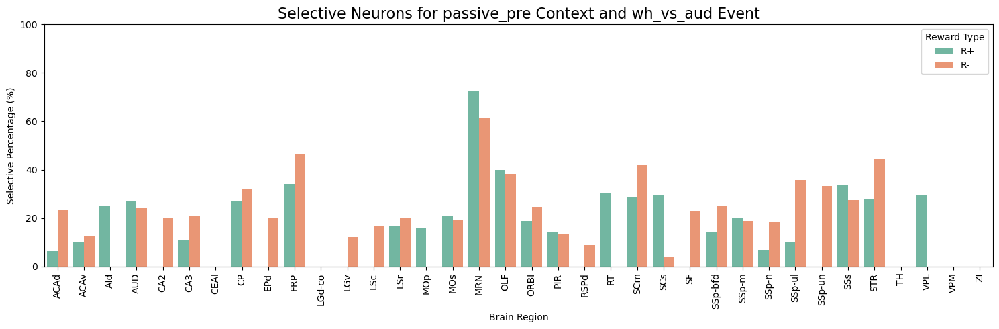

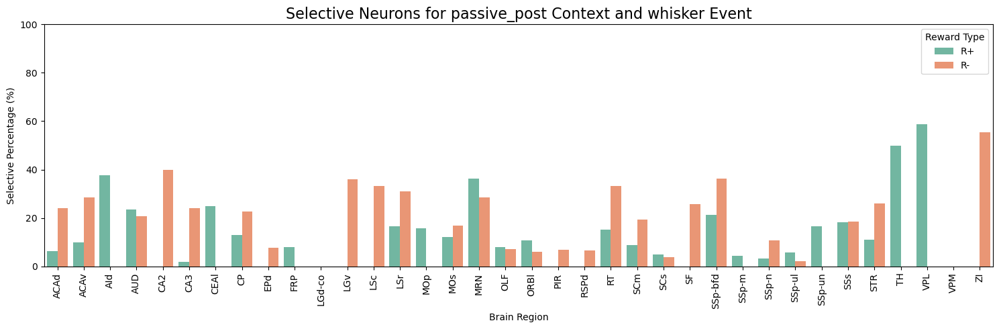

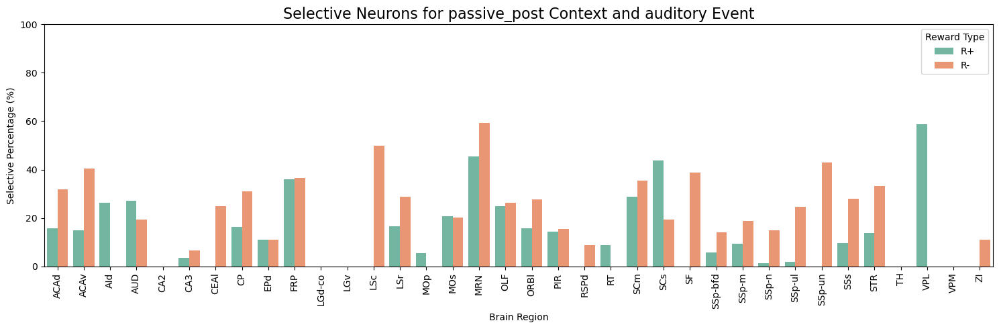

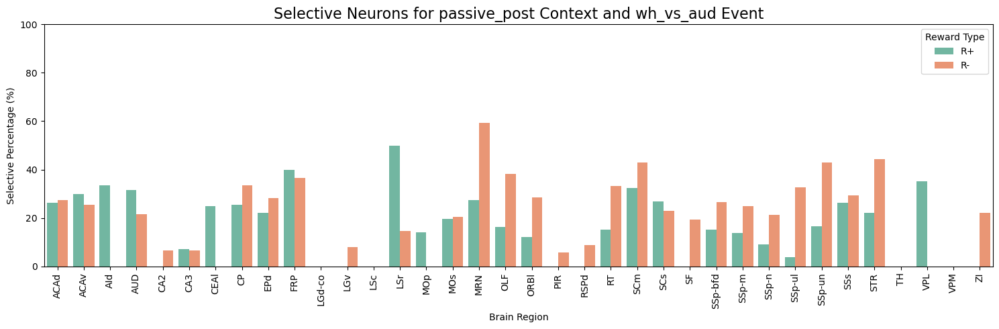

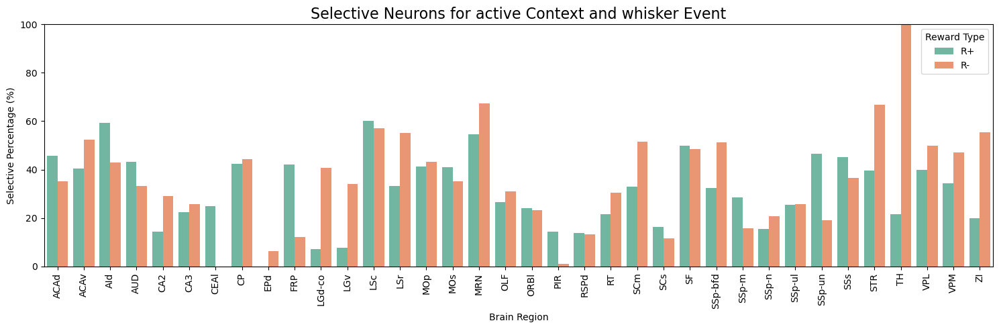

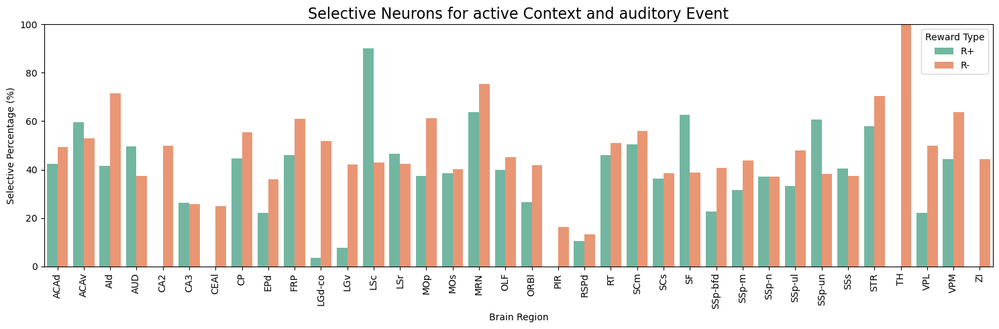

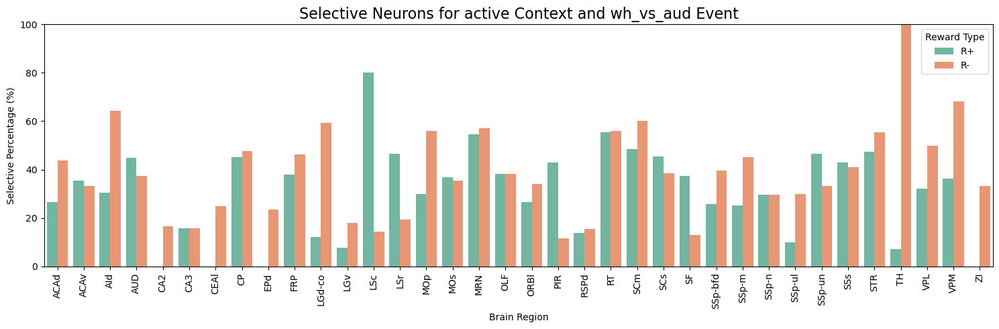

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt

def percentage_selectivity_wh_reward(df, category='whisker', context='active', over_mouse=False):
    """
    Calculates the average percentage of selective neurons per brain region for the given category and context.
    
    Parameters:
    - df: DataFrame with 'mouse_id', 'area_acronym' (brain region), and 'selective'.
    - category: Category for the event ('whisker', 'auditory', etc.)
    - context: Context for the event (e.g., 'active', 'passive_pre', etc.)
    """
    # Filter the dataframe for the given category and context
    if category == 'spontaneous_licks':
        df_filtered = df[(df['event'] == category)]
    else:
        df_filtered = df[(df['event'] == category) & (df['context'] == context)]

    # Drop NaN values in the 'selective' column
    df_filtered = df_filtered.dropna(subset=['selective'])

    # Ensure 'selective' is a binary column (True/False)
    df_filtered['selective'] = df_filtered['selective'].astype(bool)

    # Calculate the percentage of selective neurons per mouse and brain region
    if over_mouse:
        percentages = df_filtered.groupby(['area_acronym', 'wh_reward', 'mouse_id'])['selective'].mean().reset_index()
    else:
        percentages = df_filtered.groupby(['area_acronym', 'wh_reward'])['selective'].mean().reset_index()
    percentages['selective'] *= 100  # Convert to percentage

    return percentages

# List of contexts and events
contexts = ['passive_pre', 'passive_post', 'active']
events = ['whisker', 'auditory', 'wh_vs_aud']

for context in contexts:
    for event in events:
        plt.figure(figsize=(15, 5))

        # Get the percentage selectivity data
        avg_percentages = percentage_selectivity_wh_reward(df_filtered, category=event, context=context)

        # Ensure all areas from the predefined list are present in the data, adding 0 for missing ones
        #missing_areas = [area for area in areas if area not in avg_percentages['area_acronym'].unique()]
        #missing_rows = pd.DataFrame([{'area_acronym': area, 'wh_reward': 'N/A', 'selective': 0} for area in missing_areas])
        #avg_percentages = pd.concat([avg_percentages, missing_rows], ignore_index=True)

        # Create the seaborn barplot with hue for `wh_reward`
        sns.barplot(x='area_acronym', y='selective', hue='wh_reward', data=avg_percentages, order=areas, palette='Set2')

        # Set the title and labels
        plt.title(f'Selective Neurons for {context} Context and {event} Event', fontsize=16)
        plt.xticks(rotation=90)
        plt.xlabel('Brain Region')
        plt.ylabel('Selective Percentage (%)')
        plt.ylim(0, 100)
        plt.legend(title='Reward Type', loc='upper right')

        # Display the plot
        plt.tight_layout()
        plt.show()



## Spontaneous licks

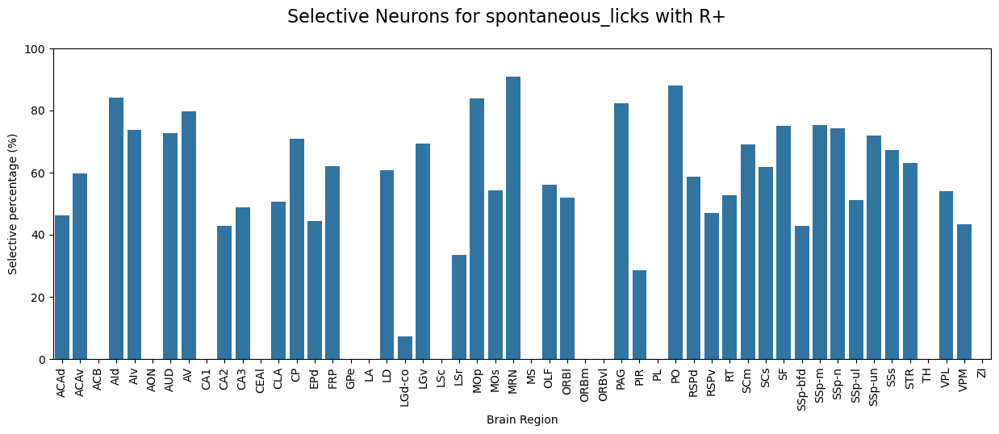

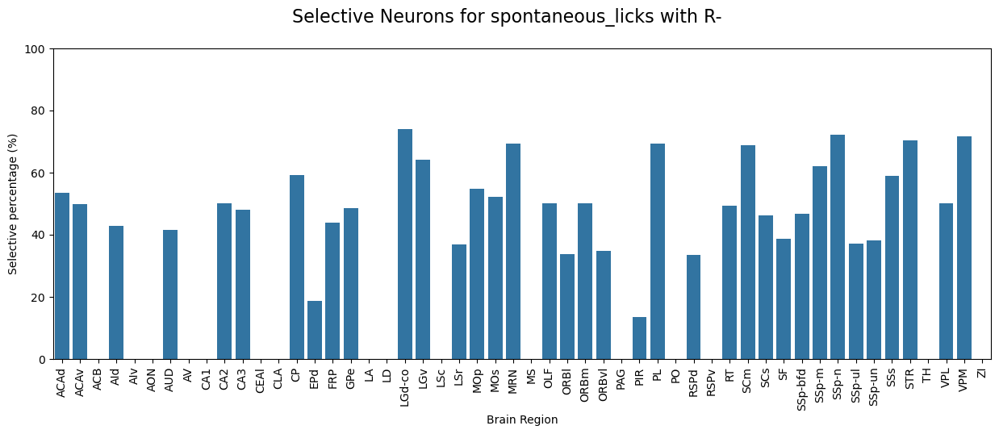

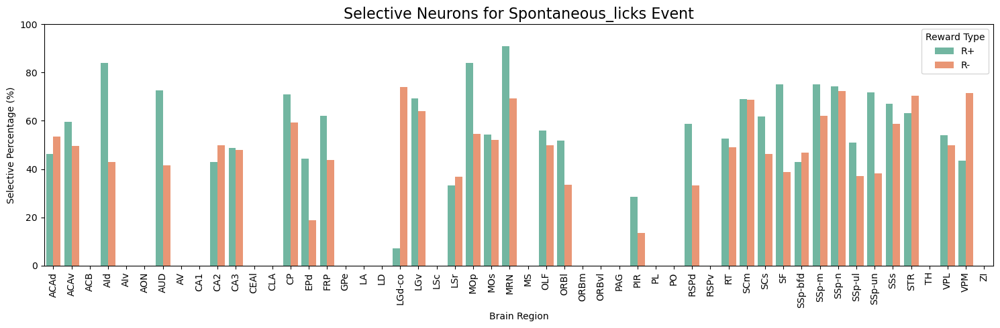

In [59]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of contexts and reward conditions
#contexts = ['passive_pre', 'passive_post', 'active']
reward_conditions = ['R+', 'R-']


# Iterate over each combination of context and reward condition
for reward in reward_conditions:
    plt.figure(figsize=(15, 5))
    
    # Get the percentage selectivity data
    avg_percentages = percentage_selectivity(df, category='spontaneous_licks', wh_reward=reward)
    
    # Ensure all areas from the predefined list are present in the data, adding 0 for missing ones
    avg_percentages['selective'] = avg_percentages.apply(
        lambda row: row['selective'] if row['area_acronym'] in areas else 0, axis=1
    )
    
    # Create the seaborn barplot for the current category
    sns.barplot(x='area_acronym', y='selective', data=avg_percentages, order=areas)
    
    # Set the title and labels
    plt.suptitle(f'Selective Neurons for spontaneous_licks with {reward}', fontsize=16)
    plt.xticks(rotation=90)
    plt.xlabel('Brain Region')
    plt.ylim(0, 100)
    plt.ylabel('Selective percentage (%)')
    
    # Display the plot
    plt.show()




plt.figure(figsize=(15, 5))

# Get the percentage selectivity data
avg_percentages = percentage_selectivity_wh_reward(df_filtered, category='spontaneous_licks')

# Ensure all areas from the predefined list are present in the data, adding 0 for missing ones
#missing_areas = [area for area in areas if area not in avg_percentages['area_acronym'].unique()]
#missing_rows = pd.DataFrame([{'area_acronym': area, 'wh_reward': 'N/A', 'selective': 0} for area in missing_areas])
#avg_percentages = pd.concat([avg_percentages, missing_rows], ignore_index=True)

# Create the seaborn barplot with hue for `wh_reward`
sns.barplot(x='area_acronym', y='selective', hue='wh_reward', data=avg_percentages, order=areas, palette='Set2')

# Set the title and labels
plt.title(f'Selective Neurons for Spontaneous_licks Event', fontsize=16)
plt.xticks(rotation=90)
plt.xlabel('Brain Region')
plt.ylabel('Selective Percentage (%)')
plt.ylim(0, 100)
plt.legend(title='Reward Type', loc='upper right')

# Display the plot
plt.tight_layout()
plt.show()


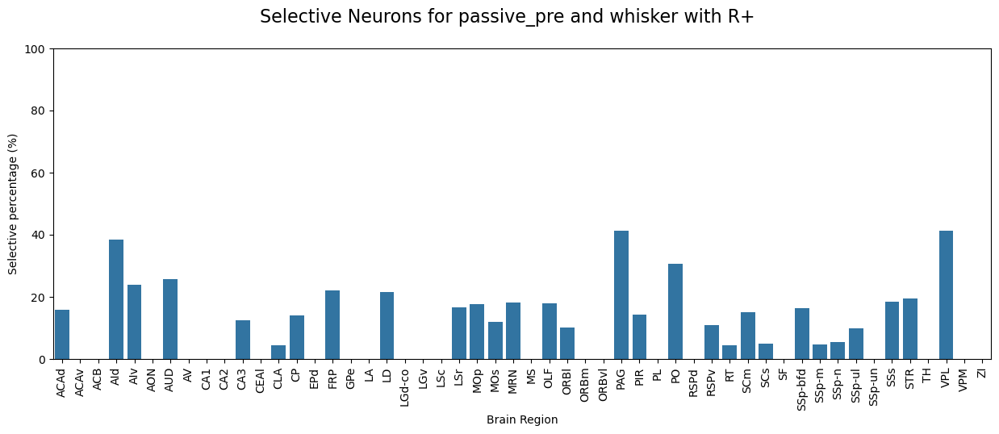

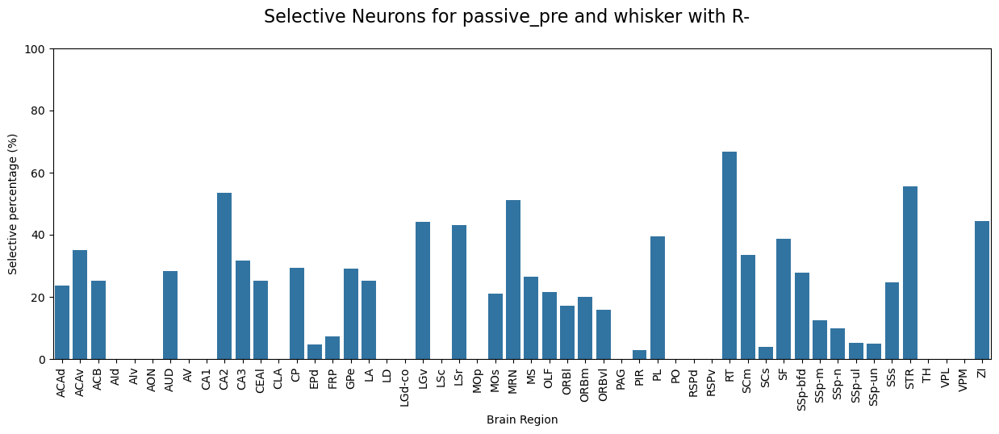

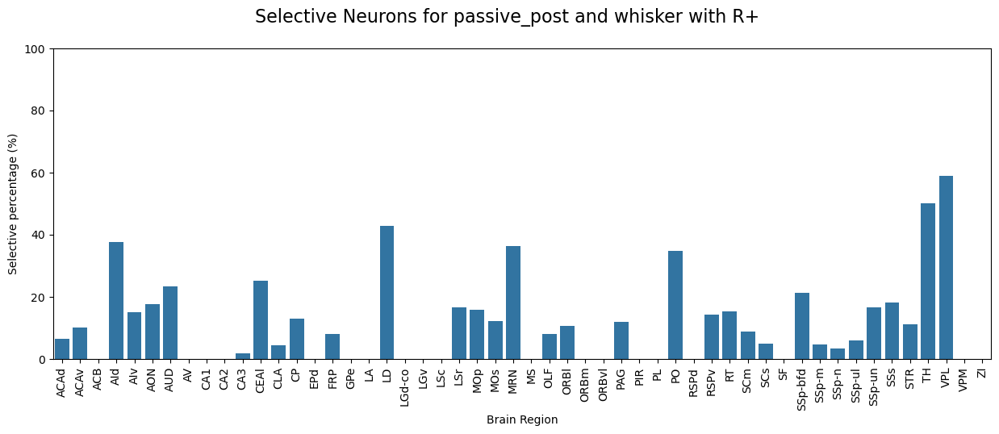

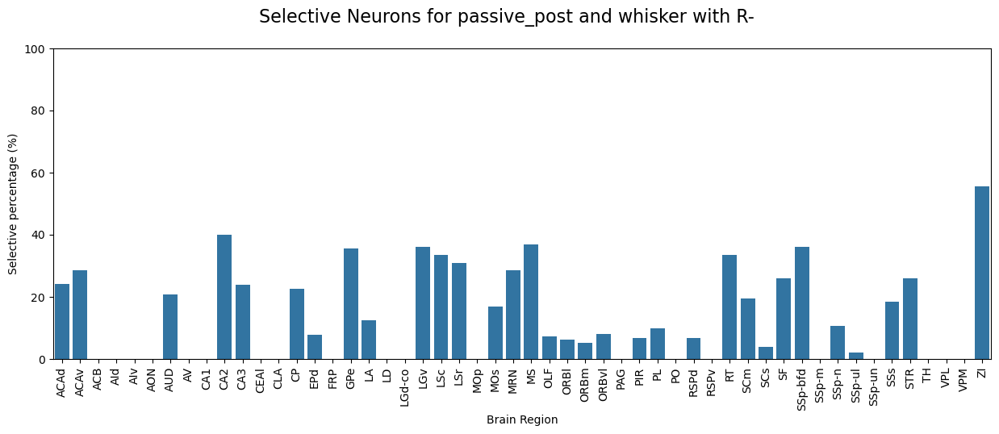

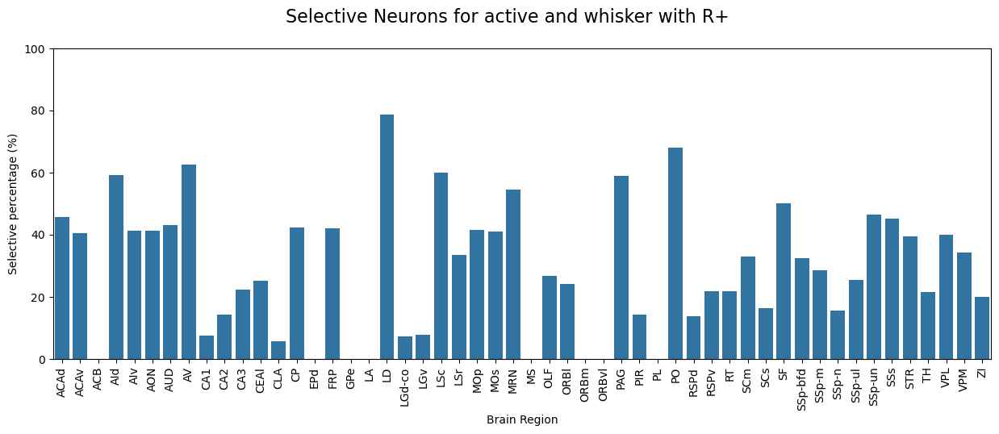

...

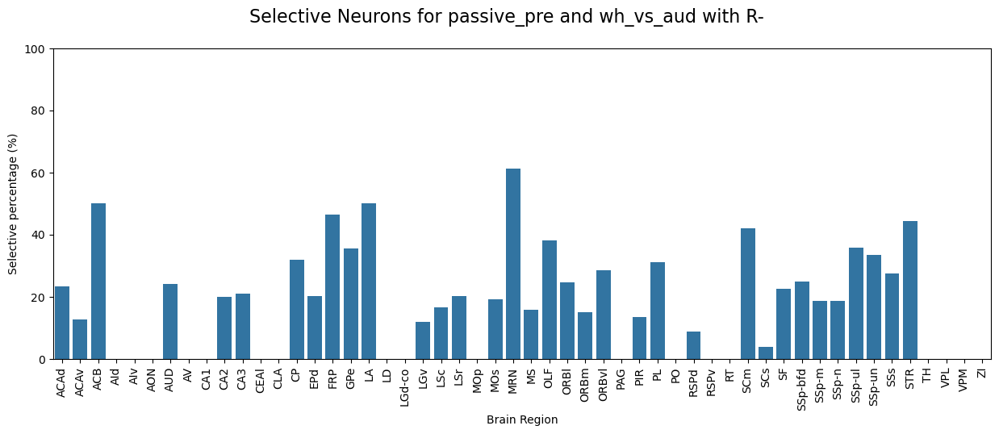

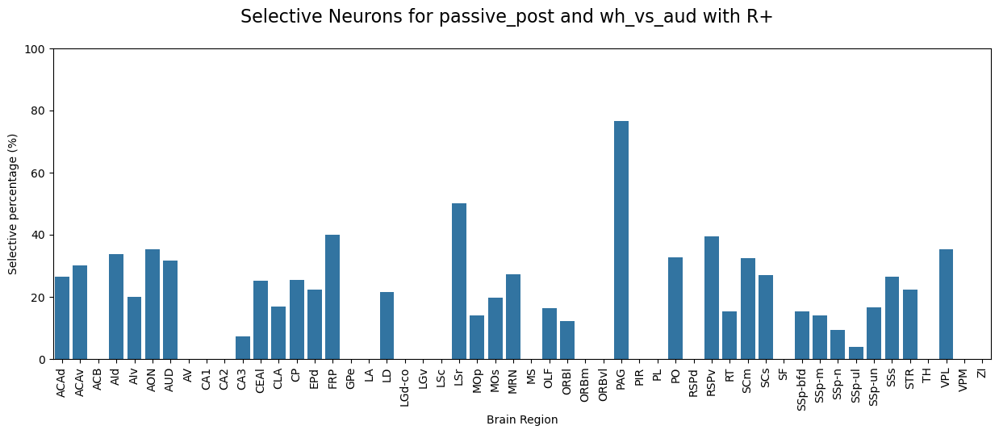

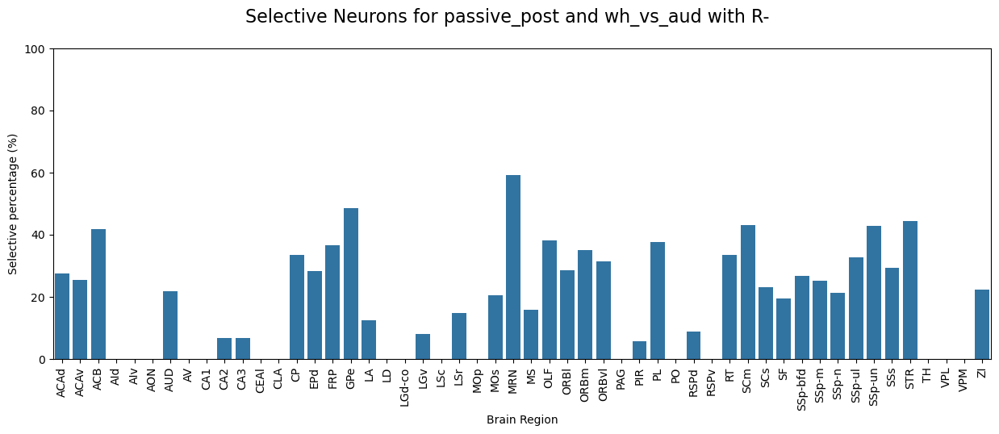

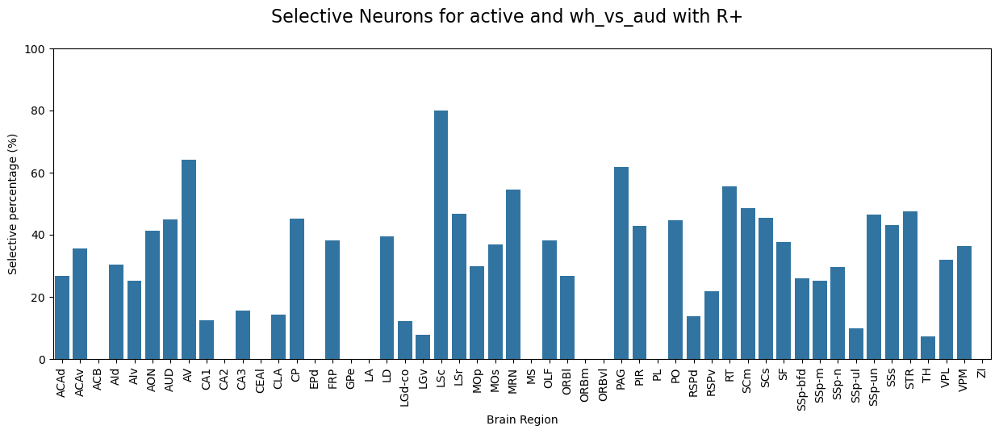

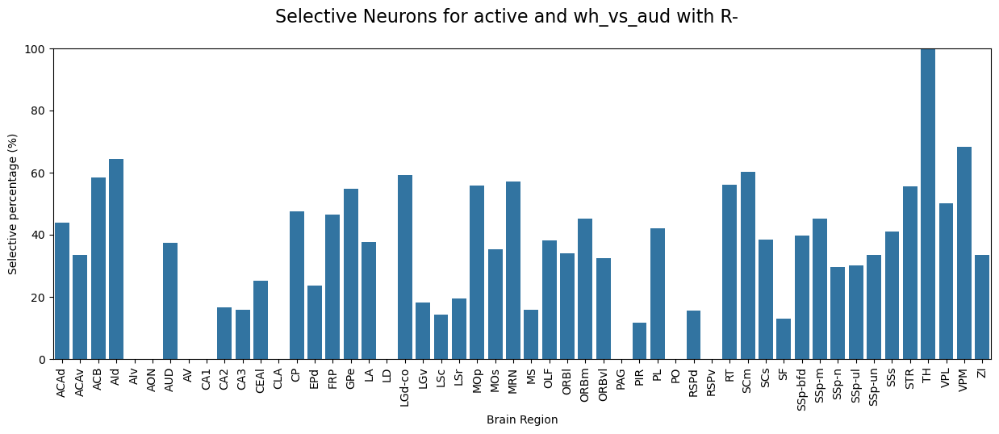

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of contexts and reward conditions
contexts = ['passive_pre', 'passive_post', 'active']
reward_conditions = ['R+', 'R-']

for event in ['whisker', 'auditory', 'wh_vs_aud']:
    # Iterate over each combination of context and reward condition
    for context in contexts:
        for reward in reward_conditions:
            plt.figure(figsize=(15, 5))
            
            # Get the percentage selectivity data
            avg_percentages = percentage_selectivity(df, category=event, context=context, wh_reward=reward)
            
            # Ensure all areas from the predefined list are present in the data, adding 0 for missing ones
            avg_percentages['selective'] = avg_percentages.apply(
                lambda row: row['selective'] if row['area_acronym'] in areas else 0, axis=1
            )
            
            # Create the seaborn barplot for the current category
            sns.barplot(x='area_acronym', y='selective', data=avg_percentages, order=areas)
            
            # Set the title and labels
            plt.suptitle(f'Selective Neurons for {context} and {event} with {reward}', fontsize=16)
            plt.xticks(rotation=90)
            plt.xlabel('Brain Region')
            plt.ylim(0, 100)
            plt.ylabel('Selective percentage (%)')
            
            # Display the plot
            plt.show()


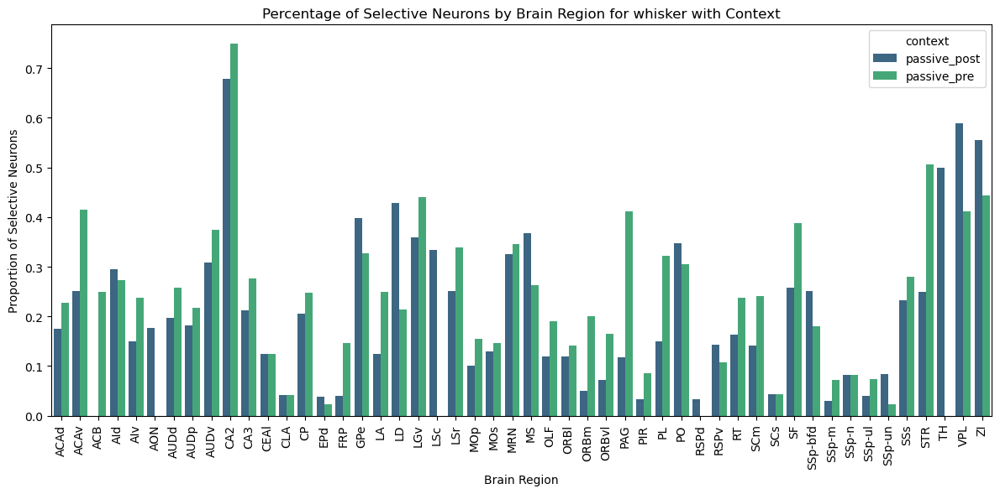

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_selectivity_by_element(df, category='whisker', element='context', has_context=0, over_mouse=False):
    """
    Plots the average selective neurons per brain region, grouped by a given element (e.g., context, category).
    
    Parameters:
    - df: DataFrame with 'mouse_id', 'area_acronym' (brain region), 'selective', and the specified element.
    - category: Filter based on category (default='whisker').
    - element: The element to group by (e.g., 'context', 'category').
    - has_context: Whether to include data with the specified context (0 or 1).
    - over_mouse: Whether to calculate percentages over individual mice (True) or overall (False).
    """

    # Filter the data based on the selected category
    if category == 'spontaneous_licks':
        df_filtered = df[(df['event'] == category)]
    else:
        df_filtered = df[(df['event'] == category)]  # Remove the fixed context filtering

    if (has_context == True) or (has_context == False):
        df_filtered = df_filtered[df_filtered['has context'] == has_context]
    
    # Drop NaN values in 'selective' column
    df_filtered = df_filtered.dropna(subset=['selective'])

    # Ensure 'selective' is a binary column (True/False)
    df_filtered['selective'] = df_filtered['selective'].astype(bool)
    df_filtered = df_filtered[df_filtered[element]!='active']
    # Calculate the mean of selective neurons per mouse and brain region
    if over_mouse:
        percentages = df_filtered.groupby(['area_acronym', 'mouse_id', element])['selective'].mean().reset_index()
    else:
        percentages = df_filtered.groupby(['area_acronym', element])['selective'].mean().reset_index()
    
    

    # Average percentages across mice for each brain region and element
    avg_percentages = percentages.groupby(['area_acronym', element])['selective'].mean().reset_index()

    # Get the unique order of brain regions and elements (dynamic grouping)
    category_order = avg_percentages['area_acronym'].unique().tolist()
    element_order = avg_percentages[element].unique().tolist()

    # Create the bar plot with explicit order
    plt.figure(figsize=(12, 6))  # Set figure size
    ax = sns.barplot(x='area_acronym', y='selective', hue=element, data=avg_percentages, palette='viridis', 
                     order=category_order, hue_order=element_order)
    # Title and labels
    title = (f"Percentage of Selective Neurons by Brain Region for {category}"
             if category == 'spontaneous_licks' else
             f"Percentage of Selective Neurons by Brain Region for {category} with {element.capitalize()}")
    plt.title(title)
    plt.xlabel('Brain Region')
    plt.ylabel('Proportion of Selective Neurons')
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=90, ha='center')
    # Tight layout
    plt.tight_layout()
    # Show the plot
    plt.show()


# Example usage:
# Assuming you have a DataFrame `df` with the necessary columns
plot_selectivity_by_element(df, category='whisker', element='context', has_context=0, over_mouse=True)


/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_13179/2889664731.py:179: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')


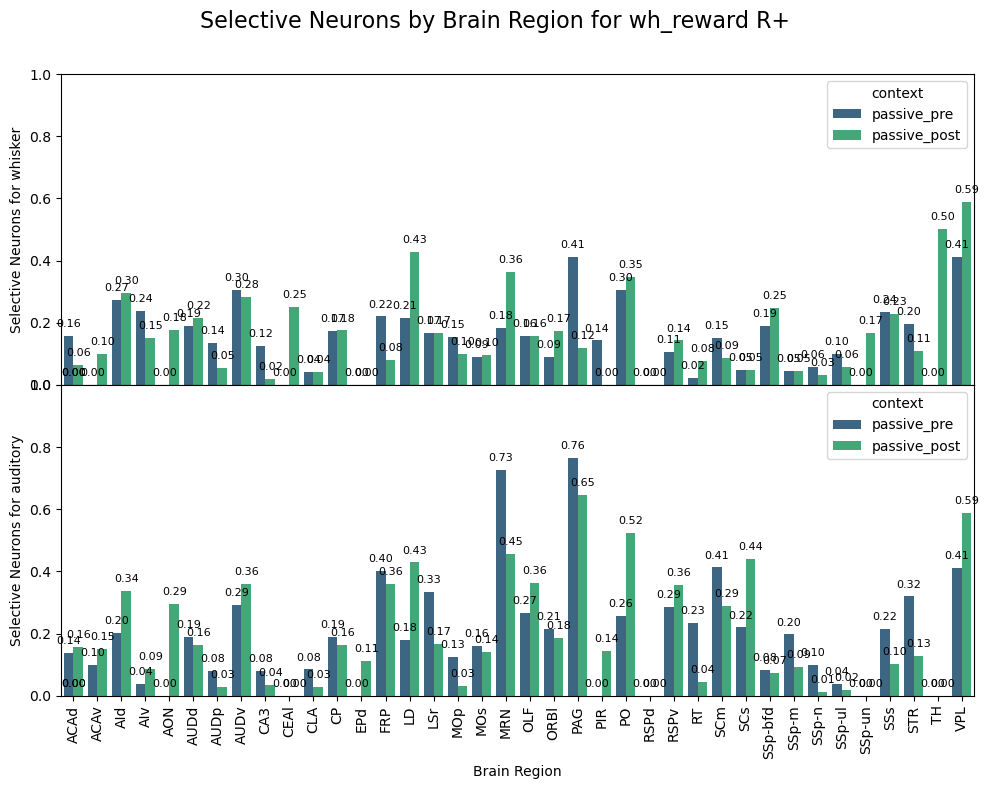

/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_13179/2889664731.py:179: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')


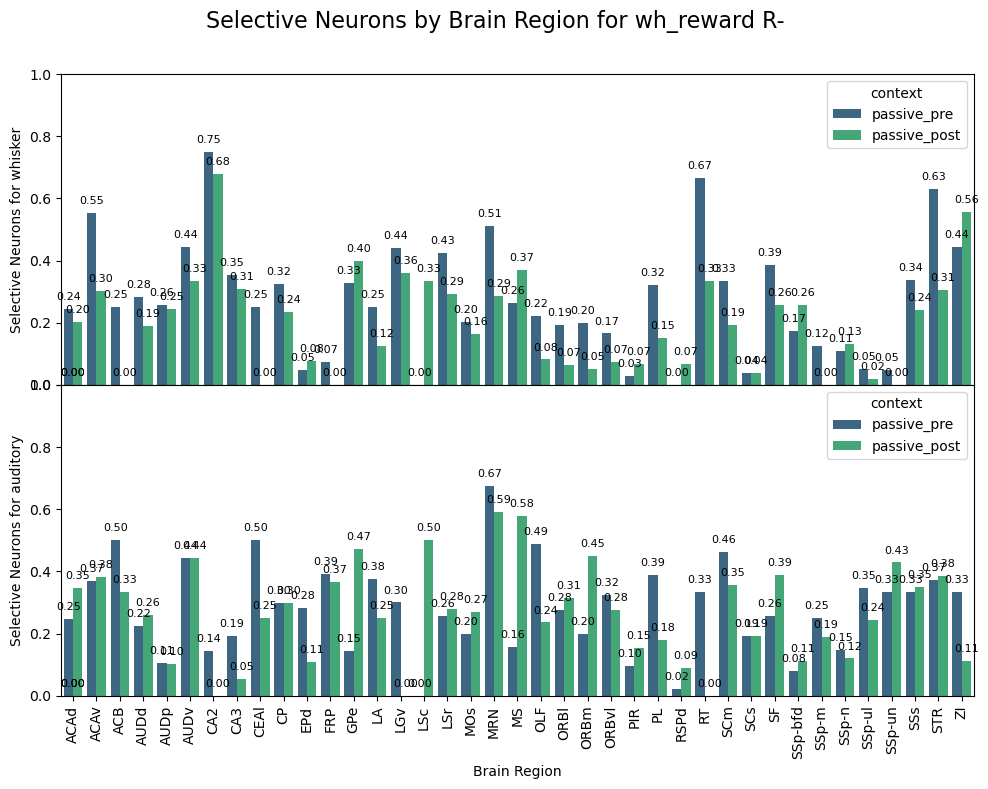

/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_13179/2889664731.py:179: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')


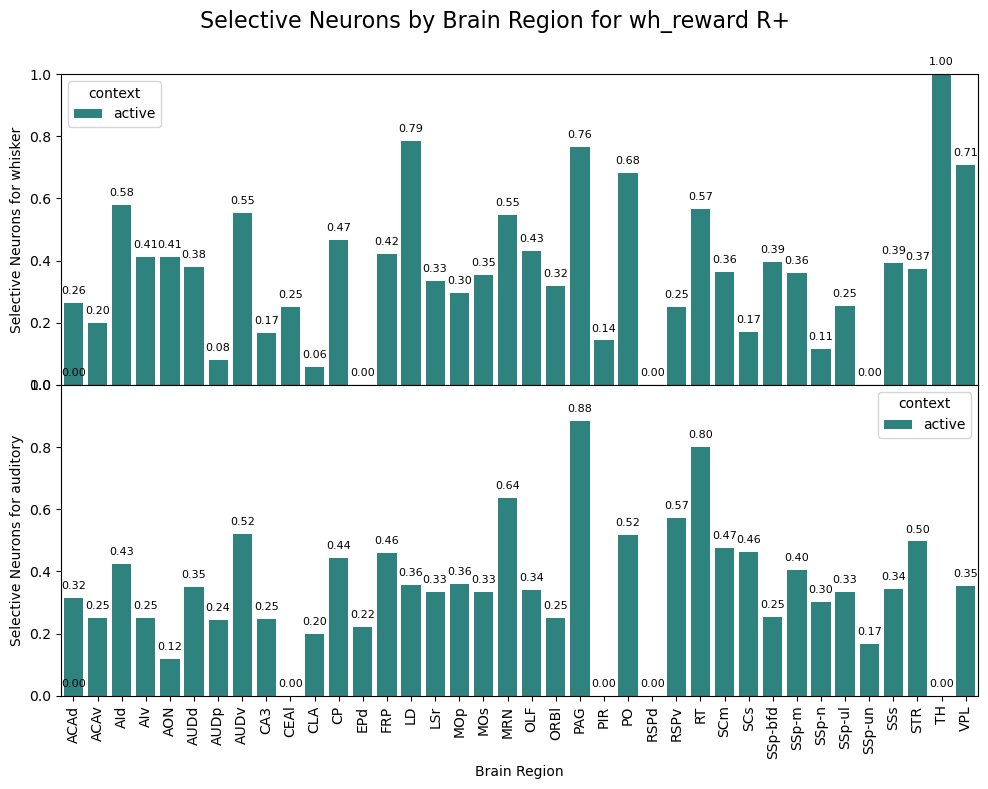

/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_13179/2889664731.py:179: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')


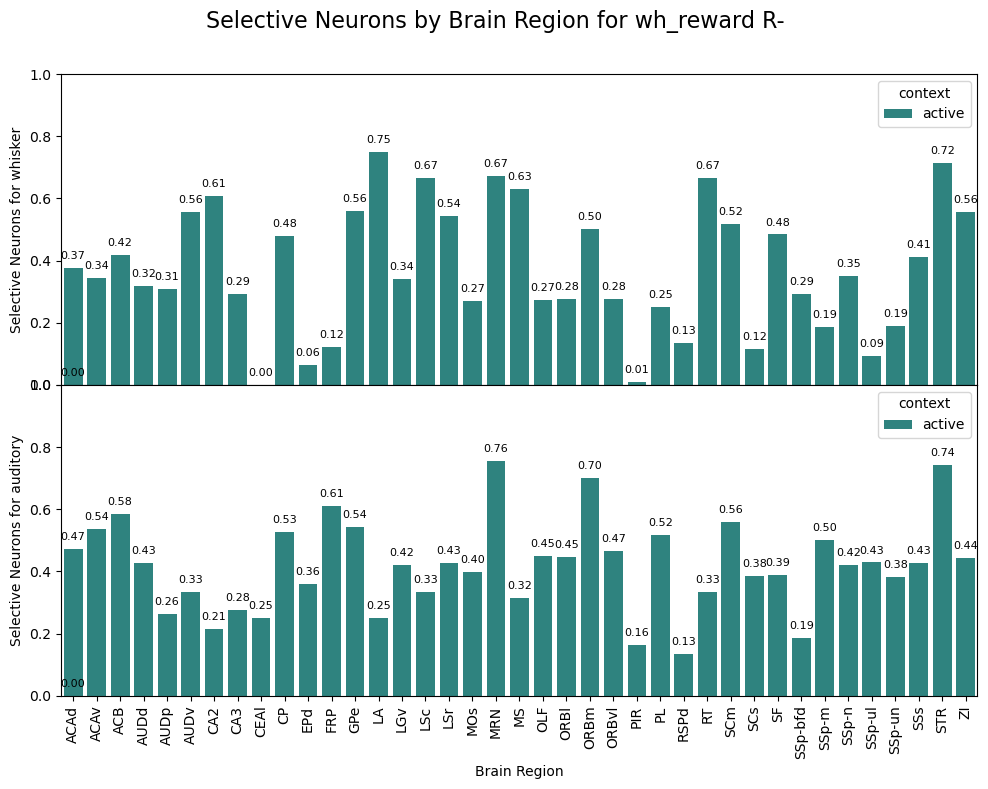

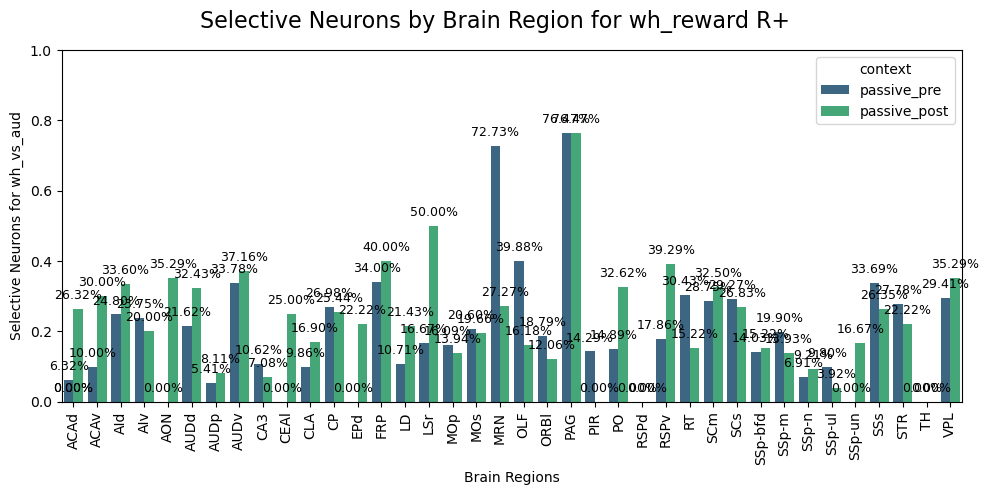

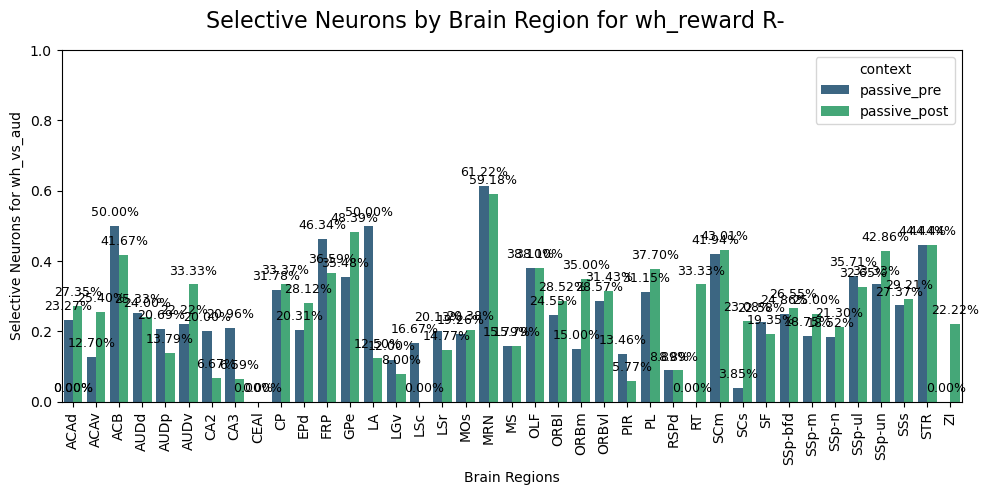

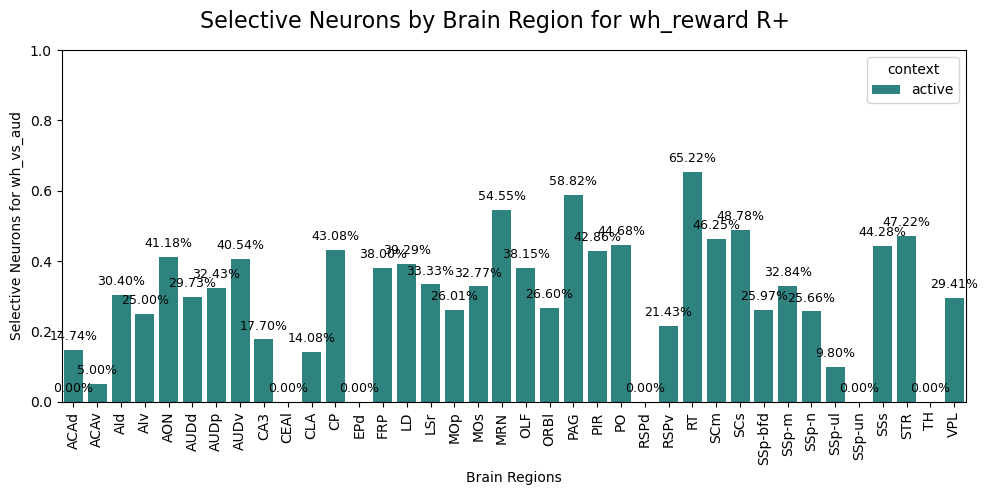

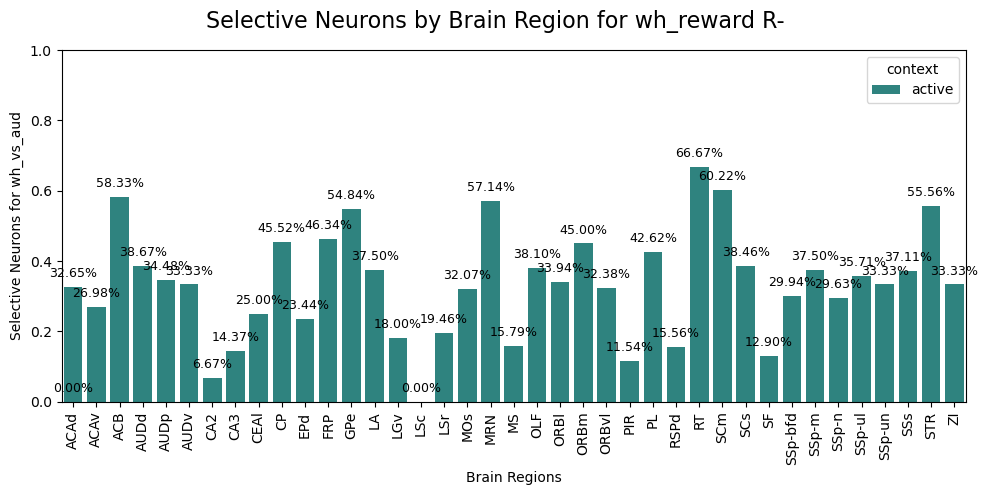

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_selectivity_by_element(df, categories=['whisker', 'auditory', 'wh_vs_aud'], element='context', wh_reward = 'R+', has_context=0, over_mouse=False, element_order = ['passive_pre', 'passive_post', 'active']):
    """
    Plots the average selective neurons per brain region for multiple categories, stacked vertically.
    
    Parameters:
    - df: DataFrame with 'mouse_id', 'area_acronym' (brain region), 'selective', and the specified element.
    - categories: List of categories to plot (default=['whisker', 'auditory', 'wh_vs_aud']).
    - element: The element to group by (e.g., 'context', 'category').
    - has_context: Whether to include data with the specified context (0 or 1).
    - over_mouse: Whether to calculate percentages over individual mice (True) or overall (False).
    """
    # Create a figure with 3 vertically stacked subplots
    fig, axs = plt.subplots(len(categories), 1, figsize=(10, 8))  # 3 rows, 1 column
    # Loop through categories and plot each one in a separate subplot
    for i, category in enumerate(categories):
        ax = axs[i]  # Access the current axis for this category

        # Filter the data based on the selected category
        if category == 'spontaneous_licks':
            df_filtered = df[(df['event'] == category)]
        else:
            df_filtered = df[(df['event'] == category)]  # Remove the fixed context filtering

        if (has_context == True) or (has_context == False):
            df_filtered = df_filtered[df_filtered['has context'] == has_context]

        # Drop NaN values in 'selective' column
        df_filtered = df_filtered.dropna(subset=['selective'])

        # Ensure 'selective' is a binary column (True/False)
        df_filtered['selective'] = df_filtered['selective'].astype(bool)
        df_filtered = df_filtered[df_filtered['wh_reward']==wh_reward]

        # Calculate the mean of selective neurons per mouse and brain region
        if over_mouse:
            percentages = df_filtered.groupby(['area_acronym', 'mouse_id', element])['selective'].mean().reset_index()
        else:
            percentages = df_filtered.groupby(['area_acronym', element])['selective'].mean().reset_index()

        # Average percentages across mice for each brain region and element
        avg_percentages = percentages.groupby(['area_acronym', element])['selective'].mean().reset_index()

        # Get the unique order of brain regions and elements (dynamic grouping)
        category_order = avg_percentages['area_acronym'].unique().tolist()

        # Handle the order of contexts (e.g., 'passive_pre' before 'passive_post')
        if element == 'context':
            element_order = element_order#['passive_pre', 'passive_post', 'active']  # Specify the desired order for context
        else:
            element_order = avg_percentages[element].unique().tolist()

        # Create the bar plot with explicit order
        #ax = sns.barplot(x='area_acronym', y='selective', hue=element, data=avg_percentages, palette='viridis',
        #                order=category_order, hue_order=element_order)
        sns.barplot(x='area_acronym', y='selective', hue=element, data=avg_percentages, palette='viridis', 
                    order=category_order, hue_order=element_order, ax=ax)

        # Title for each subplot (no subtitles, just one main title)
        #ax.set_title("Percentage of Selective Neurons by Brain Region for wh_reward")

        # Remove x-label and brain region names on all but the last subplot
        if i < len(categories) - 1:
            ax.set_xlabel('')
            ax.set_xticklabels([])  # Remove brain region names from x-axis
        else:
            ax.set_xlabel('Brain Region')

        ax.set_ylabel(f'Proportion of Selective Neurons for {category}')

        # Rotate x-axis labels for better readability
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.subplots_adjust(top=0.95, hspace=0)  # Adjust vertical space between subplots

    # Show the plot
    plt.suptitle(f"Percentage of Selective Neurons by Brain Region for wh_reward {wh_reward}", fontsize=16)  # Main title for the whole plot
    plt.show()

import matplotlib.pyplot as plt
import seaborn as sns

def plot_selectivity_by_element(df, categories=['whisker', 'auditory', 'wh_vs_aud'], element='context', wh_reward='R+', has_context=0, over_mouse=False, element_order=['passive_pre', 'passive_post', 'active']):
    """
    Plots the average selective neurons per brain region for multiple categories, stacked vertically.
    
    Parameters:
    - df: DataFrame with 'mouse_id', 'area_acronym' (brain region), 'selective', and the specified element.
    - categories: List of categories to plot (default=['whisker', 'auditory', 'wh_vs_aud']).
    - element: The element to group by (e.g., 'context', 'category').
    - wh_reward: Reward condition (e.g., 'R+' or 'R-').
    - has_context: Whether to filter data by context presence (0 or 1).
    - over_mouse: Whether to calculate percentages over individual mice (True) or overall (False).
    - element_order: Order of elements for grouping (e.g., contexts like ['passive_pre', 'passive_post']).
    """
    # Create a figure with subplots for each category
    if len(categories)==1:
        #plt.figure((10))
        plt.figure(figsize=(10, 5))
        df_filtered = df[(df['event'] == categories[0])]  # Filter by category
        if has_context in [True, False]:
            df_filtered = df_filtered[df_filtered['has context'] == has_context]
        df_filtered = df_filtered.dropna(subset=['selective'])
        df_filtered['selective'] = df_filtered['selective'].astype(bool)  # Ensure binary column
        df_filtered = df_filtered[df_filtered['wh_reward'] == wh_reward]  # Filter by reward
        percentages = df_filtered.groupby(['area_acronym', element])['selective'].mean().reset_index()
        # Average percentages across mice
        avg_percentages = percentages.groupby(['area_acronym', element])['selective'].mean().reset_index()

        # Order brain regions and contexts
        category_order = avg_percentages['area_acronym'].unique().tolist()
        if element == 'context':
            element_order = element_order  # Use predefined order
        else:
            element_order = avg_percentages[element].unique().tolist()
        ax = sns.barplot(x='area_acronym', y='selective', hue=element, data=avg_percentages, palette='viridis',
                        order=category_order, hue_order=element_order)
        ax.set_ylim(0, 1)

        plt.ylabel(f'Selective Neurons for {categories[0]}')
        plt.xlabel('Brain Regions')
        plt.xticks(rotation = 90)
        # Add percentage annotations on each bar
        for bar in ax.patches:
            height = bar.get_height()  # Get the height of each bar
            if not pd.isna(height):   # Check for valid height
                ax.annotate(f'{height:.2%}',  # Format as percentage (e.g., 25%)
                            xy=(bar.get_x() + bar.get_width() / 2, height),  # Bar center
                            xytext=(0, 5),  # Offset annotation slightly above the bar
                            textcoords="offset points",
                            ha='center', va='bottom', fontsize=9)


    else:
        fig, axs = plt.subplots(len(categories), 1, figsize=(10, 8))  # One row for each category

        for i, category in enumerate(categories):
            ax = axs[i]  # Access the current axis for this category

            # Filter the data based on the selected category
            df_filtered = df[(df['event'] == category)]  # Filter by category
            if has_context in [True, False]:
                df_filtered = df_filtered[df_filtered['has context'] == has_context]
            df_filtered = df_filtered.dropna(subset=['selective'])
            df_filtered['selective'] = df_filtered['selective'].astype(bool)  # Ensure binary column
            df_filtered = df_filtered[df_filtered['wh_reward'] == wh_reward]  # Filter by reward

            # Calculate percentages
            if over_mouse:
                percentages = df_filtered.groupby(['area_acronym', 'mouse_id', element])['selective'].mean().reset_index()
            else:
                percentages = df_filtered.groupby(['area_acronym', element])['selective'].mean().reset_index()

            # Average percentages across mice
            avg_percentages = percentages.groupby(['area_acronym', element])['selective'].mean().reset_index()

            # Order brain regions and contexts
            category_order = avg_percentages['area_acronym'].unique().tolist()
            if element == 'context':
                element_order = element_order  # Use predefined order
            else:
                element_order = avg_percentages[element].unique().tolist()

            # Plot the bar plot
            sns.barplot(x='area_acronym', y='selective', hue=element, data=avg_percentages, palette='viridis',
                        order=category_order, hue_order=element_order, ax=ax)

            # Set axis labels
            ax.set_ylabel(f'Selective Neurons for {category}')
            if i < len(categories) - 1:
                ax.set_xlabel('')
                ax.set_xticklabels([])  # Remove x-tick labels except for the last plot
            else:
                ax.set_xlabel('Brain Region')
                ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')

            # Set consistent Y-axis range (0 to 1 for proportions)
            ax.set_ylim(0, 1)

            # Annotate bars with percentages
            for bar in ax.patches:
                height = bar.get_height()
                ax.annotate(f'{height:.2f}',  # Format percentage with 2 decimal places
                            xy=(bar.get_x() + bar.get_width() / 2, height),
                            xytext=(0, 5),  # Offset text slightly above the bar
                            textcoords="offset points",
                            ha='center', va='bottom', fontsize=8)

    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(top=0.9, hspace=0)  # Add vertical space between plots

    # Add a main title
    plt.suptitle(f"Selective Neurons by Brain Region for wh_reward {wh_reward}", fontsize=16)

    # Show the plot
    plt.show()


# Example usage:
# Assuming you have a DataFrame `df` with the necessary columns
for element_order in [['passive_pre', 'passive_post'], ['active']]:
    for wh_reward in ['R+', 'R-']:  
        plot_selectivity_by_element(df, categories=['whisker', 'auditory'], element='context', wh_reward = wh_reward, has_context=0, over_mouse=True, element_order=element_order)

for element_order in [['passive_pre', 'passive_post'], ['active']]:
    for wh_reward in ['R+', 'R-']:  
        plot_selectivity_by_element(df, categories=['wh_vs_aud'], element='context', wh_reward = wh_reward, has_context=0, over_mouse=True, element_order=element_order)



In [52]:
df[(df['context'] == 'passive_pre') & (df['event'] == 'whisker')]

,cluster_id,ccf_acronym,ccf_name,ccf_parent_id,ccf_parent_acronym,ccf_parent_name,spike_times,mouse_id,context,event,...,Transformed AUC,p-values positive,p-values negative,selective,direction,pre_time,post_time,area_acronym,has context,wh_reward
259,1,CA3,Field CA3,375.0,CA,Ammon's horn,[1.10997831e-02 3.79359254e-01 4.41958031e-01 ...,AB120_20240811_143102,passive_pre,whisker,...,0.114714,0.992,0.008,True,negative,0.2,0.2,CA3,False,R-
260,5,CA3,Field CA3,375.0,CA,Ammon's horn,[8.50683378e-01 8.61316503e-01 8.73749594e-01 ...,AB120_20240811_143102,passive_pre,whisker,...,0.088271,0.967,0.034,True,negative,0.2,0.2,CA3,False,R-
261,9,CA3,Field CA3,375.0,CA,Ammon's horn,[8.57983235e-02 1.90962935e-01 2.93227604e-01 ...,AB120_20240811_143102,passive_pre,whisker,...,0.060016,1.000,0.000,True,negative,0.2,0.2,CA3,False,R-
262,12,CA3,Field CA3,375.0,CA,Ammon's horn,[8.19650651e-02 1.73179949e+00 2.62854864e+00 ...,AB120_20240811_143102,passive_pre,whisker,...,0.014756,0.320,0.693,False,none,0.2,0.2,CA3,False,R-
263,14,CA3,Field CA3,375.0,CA,Ammon's horn,[4.24688368e+00 5.92881749e+00 6.04198194e+00 ...,AB120_20240811_143102,passive_pre,whisker,...,0.081816,0.773,0.763,False,none,0.2,0.2,CA3,False,R-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94113,610,MOs5,"Secondary motor area, layer 5",993.0,MOs,Secondary motor area,[1.67906889e+00 6.87577335e+00 8.72533789e+00 ...,AB116_20240724_102941,passive_pre,whisker,...,0.044259,0.966,0.051,False,none,0.2,0.2,MOs,False,R-
94114,611,MOs5,"Secondary motor area, layer 5",993.0,MOs,Secondary motor area,[ 550.09230156 556.8284405 558.09501707 ......,AB116_20240724_102941,passive_pre,whisker,...,-0.021489,1.000,1.000,False,none,0.2,0.2,MOs,False,R-
94115,619,MOs5,"Secondary motor area, layer 5",993.0,MOs,Secondary motor area,[5.71822129e-01 4.05309287e+00 4.42672106e+00 ...,AB116_20240724_102941,passive_pre,whisker,...,-0.082144,0.175,0.944,False,none,0.2,0.2,MOs,False,R-
94116,620,MOs5,"Secondary motor area, layer 5",993.0,MOs,Secondary motor area,[ 538.99870828 559.2576304 605.60872567 ......,AB116_20240724_102941,passive_pre,whisker,...,-0.017370,1.000,1.000,False,none,0.2,0.2,MOs,False,R-


/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_56548/2040966443.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='area_acronym', y='selective', data=avg_percentages, palette='viridis', ax=ax)
/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_56548/2040966443.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='area_acronym', y='selective', data=avg_percentages, palette='viridis', ax=ax)
/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_56548/2040966443.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplo

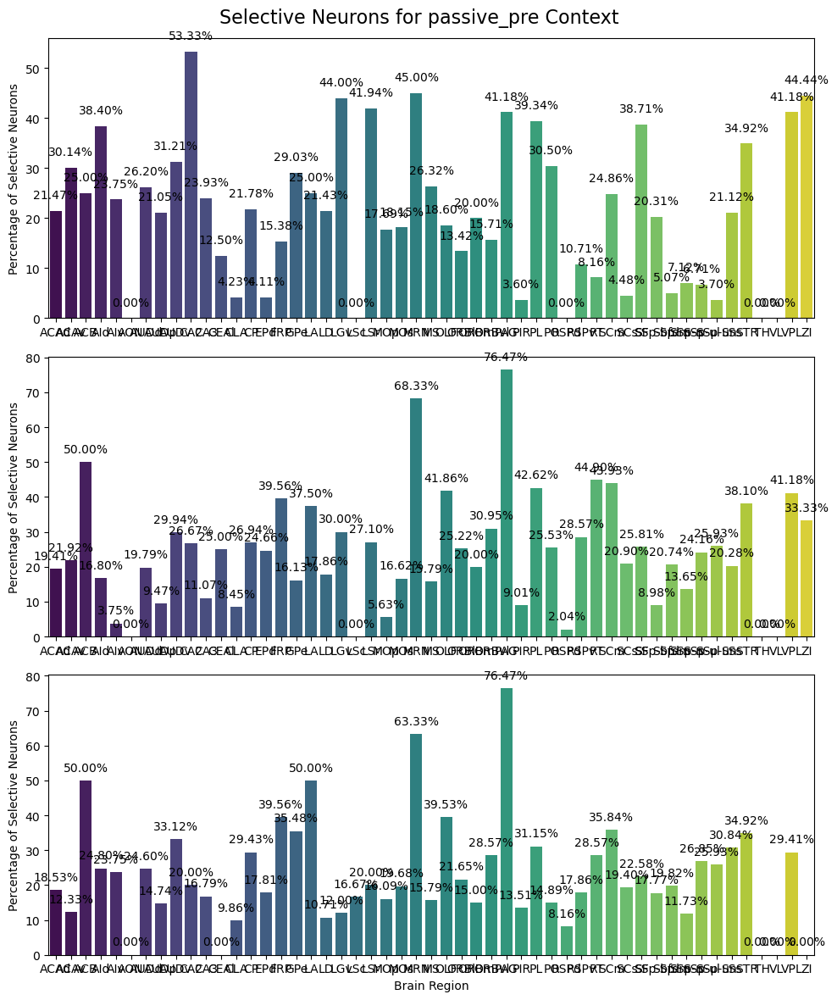

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

categories = ['whisker', 'auditory', 'wh_vs_aud']
context = 'passive_pre'  # Set your context here

def plot_selectivity(df, category='whisker', context='active', over_mouse=False):
    """
    Plots the average percentage of selective neurons per brain region for the given category and context.
    
    Parameters:
    - df: DataFrame with 'mouse_id', 'area_acronym' (brain region), and 'selective'.
    - category: Category for the event ('whisker', 'auditory', etc.)
    - context: Context for the event (e.g., 'active', 'passive_pre', etc.)
    """
    # Filter the dataframe for the given category and context
    df_filtered = df[(df['event'] == category) & (df['context'] == context)]

    # Drop NaN values in the 'selective' column
    df_filtered = df_filtered.dropna(subset=['selective'])

    # Ensure 'selective' is a binary column (True/False)
    df_filtered['selective'] = df_filtered['selective'].astype(bool)

    # Calculate the percentage of selective neurons per mouse and brain region
    if over_mouse:
        percentages = df_filtered.groupby(['area_acronym', 'mouse_id'])['selective'].mean().reset_index()
    else:
        percentages = df_filtered.groupby(['area_acronym'])['selective'].mean().reset_index()
    percentages['selective'] *= 100  # Convert to percentage

    return percentages

# Create a figure with 3 vertically stacked subplots
fig, axs = plt.subplots(3, 1, figsize=(10, 12))  # 3 rows, 1 column

# Loop through categories and plot each one in a separate subplot
for i, category in enumerate(categories):
    ax = axs[i]  # Access the current axis for this category
    
    # Plot the data for the current category and context
    avg_percentages = plot_selectivity(df, category=category, context=context)
    
    # Create a seaborn barplot for the current category
    sns.barplot(x='area_acronym', y='selective', data=avg_percentages, palette='viridis', ax=ax)
    
    # Remove titles for individual subplots
    ax.set_title('')
    
    # Set the x-axis label and y-axis label for the bottom-most plot
    if i == 2:  # For the bottom-most plot
        ax.set_xlabel('Brain Region')
    else:
        ax.set_xlabel('')  # Remove x-axis label for the other plots
    
    # Remove x-tick labels for the non-bottom-most plots
    if i < 2:
        ax.tick_params(axis='x', labelleft=False)
    
    ax.set_ylabel('Percentage of Selective Neurons')
    
    # Add percentage annotations
    for idx, row in avg_percentages.iterrows():
        ax.text(idx, row['selective'] + 2, f"{row['selective']:.2f}%", ha='center', va='bottom', color='black')

# Adjust layout to avoid overlap
plt.tight_layout()
plt.suptitle(f'Selective Neurons for {context} Context', fontsize=16)
plt.subplots_adjust(top=0.95)  # Adjust the top to fit the main title
plt.show()


#### Selective neurons per mouse :

In [68]:
def plot_selectivity_direction_event(df, mouse_id=''):

    # If filtering by mouse_id, only take rows corresponding to the given mouse_id
    if mouse_id != '':
        df = df[df['mouse_id'] == mouse_id]

    # Group by event and direction to calculate counts
    selective_counts = df.groupby(['event', 'direction']).size().reset_index(name='count')

    # Total counts for normalization purposes
    total_counts = selective_counts.groupby('event')['count'].sum().reset_index(name='total')

    # Merge to compute percentage of selectivity per event
    selective_percentages = selective_counts.merge(total_counts, on='event')
    selective_percentages['percentage'] = (selective_percentages['count'] / selective_percentages['total']) * 100

    # Adjust visualization values:
    # - Keep positive responses as-is
    # - For negative responses, map their magnitude to "below the baseline"
    selective_percentages['visual_percentage'] = selective_percentages.apply(
        lambda row: -row['percentage'] if row['direction'] == 'negative' else row['percentage'],
        axis=1
    )

    # Plotting
    plt.figure(figsize=(15, 8))

    # Create the bar plot with seaborn
    ax = sns.barplot(
        data=selective_percentages,
        x='event',
        y='visual_percentage',
        hue='direction',
        dodge=True,
        palette='viridis'
    )

    # Annotate the bars
    for p in ax.patches:
        percentage = f"{abs(p.get_height()):.1f}%"  # Always annotate using magnitude
        ax.annotate(
            percentage,
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center',
            va='bottom',
            fontsize=9,
            color='black',
            xytext=(0, 5),
            textcoords='offset points'
        )

    # Adjust legends to avoid duplicates
    handles, labels = ax.get_legend_handles_labels()
    unique_labels = dict(zip(labels, handles))
    ax.legend(unique_labels.values(), unique_labels.keys(), title='Direction')

    # Set axis labels and titles
    if mouse_id != '':
        title = f'Percentage of Selective Neurons per Event for Mouse {mouse_id}'
    else:
        title = 'Percentage of Selective Neurons per Event'

    plt.axhline(0, color='black', linewidth=0.8)  # Reference line at baseline
    plt.title(title)
    plt.ylabel('Percentage (%)')
    plt.xlabel('Event')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

In [74]:
def plot_selectivity_direction_area(df, event=''):

    # If filtering by event, only take rows corresponding to the given event
    if event != '':
        df = df[df['event'] == event]

    # Group by area_acronym and direction to calculate counts
    selective_counts = df.groupby(['area_acronym', 'direction']).size().reset_index(name='count')

    # Total counts for normalization purposes
    total_counts = selective_counts.groupby('area_acronym')['count'].sum().reset_index(name='total')

    # Merge to compute percentage of selectivity per area_acronym
    selective_percentages = selective_counts.merge(total_counts, on='area_acronym')
    selective_percentages['percentage'] = (selective_percentages['count'] / selective_percentages['total']) * 100

    # Adjust visualization values:
    # - Keep positive responses as-is
    # - For negative responses, map their magnitude to "below the baseline"
    selective_percentages['visual_percentage'] = selective_percentages.apply(
        lambda row: -row['percentage'] if row['direction'] == 'negative' else row['percentage'],
        axis=1
    )

    # Plotting
    plt.figure(figsize=(15, 8))

    # Create the bar plot with seaborn
    ax = sns.barplot(
        data=selective_percentages,
        x='area_acronym',
        y='visual_percentage',
        hue='direction',
        dodge=True,
        palette='viridis'
    )

    # Annotate the bars
    for p in ax.patches:
        percentage = f"{abs(p.get_height()):.1f}%"  # Always annotate using magnitude
        ax.annotate(
            percentage,
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center',
            va='bottom',
            fontsize=9,
            color='black',
            xytext=(0, 5),
            textcoords='offset points'
        )

    # Adjust legends to avoid duplicates
    handles, labels = ax.get_legend_handles_labels()
    unique_labels = dict(zip(labels, handles))
    ax.legend(unique_labels.values(), unique_labels.keys(), title='Direction')

    # Set axis labels and titles
    if event != '':
        title = f'Percentage of Selective Neurons per Region for {event}'
    else:
        title = 'Percentage of Selective Neurons per Region'

    plt.axhline(0, color='black', linewidth=0.8)  # Reference line at baseline
    plt.title(title)
    plt.ylabel('Percentage (%)')
    plt.xlabel('Region (Area Acronym)')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

In [ ]:
def plot_selectivity_direction2(df, by='event', filter_value='', wh_reward = 'R+'):

    #df = df[df['direction'] != 'none']
    #df = df[df['wh_reward'] == wh_reward]
    # If filtering by event or area_acronym, only take rows corresponding to the given filter_value
    if filter_value != '':
        df = df[df[by] == filter_value]

    # Group by the specified parameter and direction to calculate counts
    selective_counts = df[df['wh_reward']==wh_reward].groupby([by, 'direction', 'wh_reward']).size().reset_index(name='count')
    selective_counts2 = df.groupby([by, 'direction', 'wh_reward']).size().reset_index(name='count')

    # Total counts for normalization purposes
    total_counts = selective_counts2.groupby(by)['count'].sum().reset_index(name='total')

    # Merge to compute percentage of selectivity per specified parameter
    selective_percentages = selective_counts.merge(total_counts, on=by)
    selective_percentages['percentage'] = (selective_percentages['count'] / selective_percentages['total']) * 100

    # Adjust visualization values:
    # - Keep positive responses as-is
    # - For negative responses, map their magnitude to "below the baseline"
    selective_percentages['visual_percentage'] = selective_percentages.apply(
        lambda row: -row['percentage'] if row['direction'] == 'negative' else row['percentage'],
        axis=1
    )

    # Plotting
    plt.figure(figsize=(15, 8))

    # Create the bar plot with seaborn
    ax = sns.barplot(
        data=selective_percentages,
        x=by,
        y='visual_percentage',
        hue='direction',
        dodge=True,
        palette='viridis'
    )

    # Annotate the bars
    for p in ax.patches:
        percentage = f"{abs(p.get_height()):.1f}%"  # Always annotate using magnitude
        ax.annotate(
            percentage,
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center',
            va='bottom',
            fontsize=9,
            color='black',
            xytext=(0, 5),
            textcoords='offset points'
        )

    # Adjust legends to avoid duplicates
    handles, labels = ax.get_legend_handles_labels()
    unique_labels = dict(zip(labels, handles))
    ax.legend(unique_labels.values(), unique_labels.keys(), title='Direction')

    # Set axis labels and titles
    if filter_value != '':
        title = f'Percentage of Selective Neurons per {by.capitalize()} for {filter_value} for {wh_reward}'
    else:
        title = f'Percentage of Selective Neurons per {by.capitalize()} for {wh_reward}'

    plt.axhline(0, color='black', linewidth=0.8)  # Reference line at baseline
    plt.title(title)
    plt.ylabel('Percentage (%)')
    plt.xlabel(by.capitalize())
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

In [5]:
def plot_selectivity_direction_v4(df, by='event', filter_value='', wh_reward = 'R+', event_type = '', context =''):

    # If filtering by event or area_acronym, only take rows corresponding to the given filter_value
    if filter_value != '':
        df = df[df[by] == filter_value]
    if by == 'area_acronym':
        title_event = ' for ' + event_type + ' and for ' + context
    else:
        title_event = ''

    selective_counts = df[(df['wh_reward'] == wh_reward) & (df['selective'] == True)].groupby([by, 'direction', 'wh_reward']).size().reset_index(name='count')

    # Group by the specified parameter and direction for all neurons to calculate total counts (for normalization)
    total_counts = df.groupby([by, 'direction']).size().reset_index(name='count')

    # Merge total counts for normalization purposes
    #selective_percentages = selective_counts.merge(total_counts, on=['area_acronym', 'direction', 'wh_reward'])

    hi = total_counts.groupby(by)['count'].sum().reset_index(name='total')
    selective_percentages = selective_counts.merge(hi, on=[by])
    selective_percentages['percentage'] = selective_percentages['count']/selective_percentages['total']

    # Adjust visualization values:
    # - Keep positive responses as-is
    # - For negative responses, map their magnitude to "below the baseline"
    selective_percentages['visual_percentage'] = selective_percentages.apply(
        lambda row: -row['percentage'] if row['direction'] == 'negative' else row['percentage'],
        axis=1
    )

    # Plotting
    plt.figure(figsize=(15, 8))

    # Create the bar plot with seaborn
    ax = sns.barplot(
        data=selective_percentages,
        x=by,
        y='visual_percentage',
        hue='direction',
        dodge=True,
        palette='viridis'
    )

    # Annotate the bars
    for p in ax.patches:
        percentage = f"{abs(p.get_height()):.3f}%"  # Always annotate using magnitude
        ax.annotate(
            percentage,
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center',
            va='bottom',
            fontsize=9,
            color='black',
            xytext=(0, 5),
            textcoords='offset points'
        )

    # Adjust legends to avoid duplicates
    handles, labels = ax.get_legend_handles_labels()
    unique_labels = dict(zip(labels, handles))
    ax.legend(unique_labels.values(), unique_labels.keys(), title='Direction')

    # Set axis labels and titles
    if filter_value != '':
        title = f'Percentage of Selective Neurons per {by.capitalize()} for {filter_value} for {wh_reward}{title_event}'
    else:
        title = f'Percentage of Selective Neurons per {by.capitalize()} for {wh_reward}{title_event}'

    plt.axhline(0, color='black', linewidth=0.8)  # Reference line at baseline
    plt.title(title)
    plt.ylabel('Percentage (%)')
    plt.xlabel(by.capitalize())
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


In [6]:
selective_percentages_

NameError: name 'selective_percentages_' is not defined

In [7]:
df[(df['wh_reward'] == 'R+') & (df['area_acronym']=='AV')]['wh_reward'].unique()

array(['R+'], dtype=object)

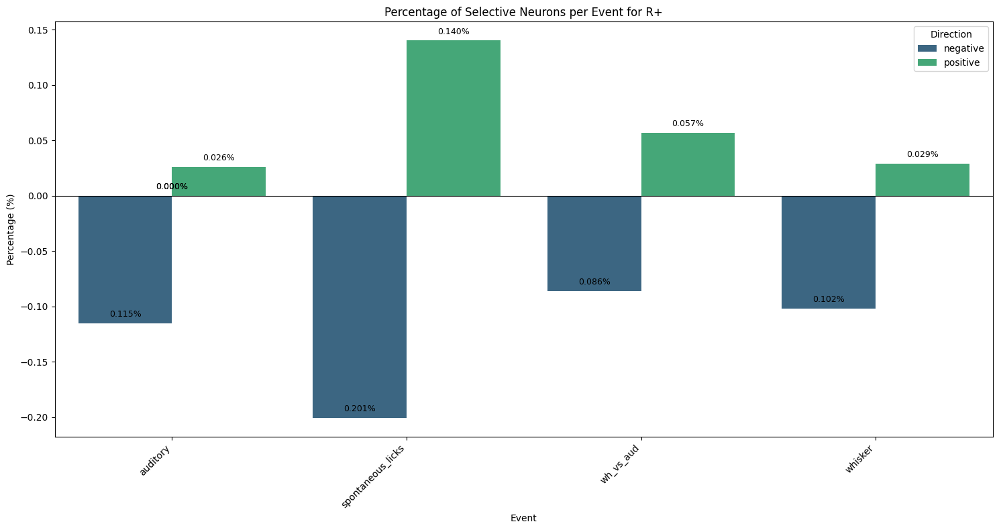

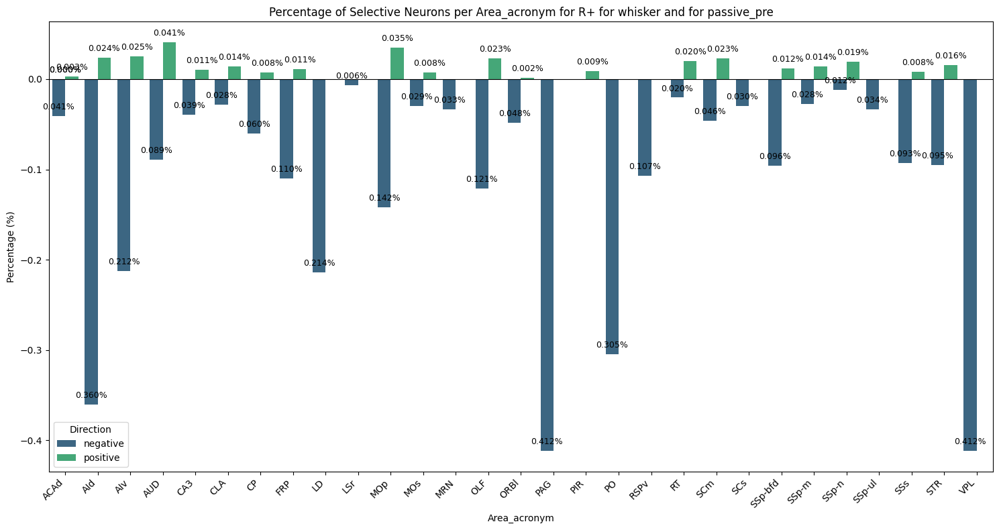

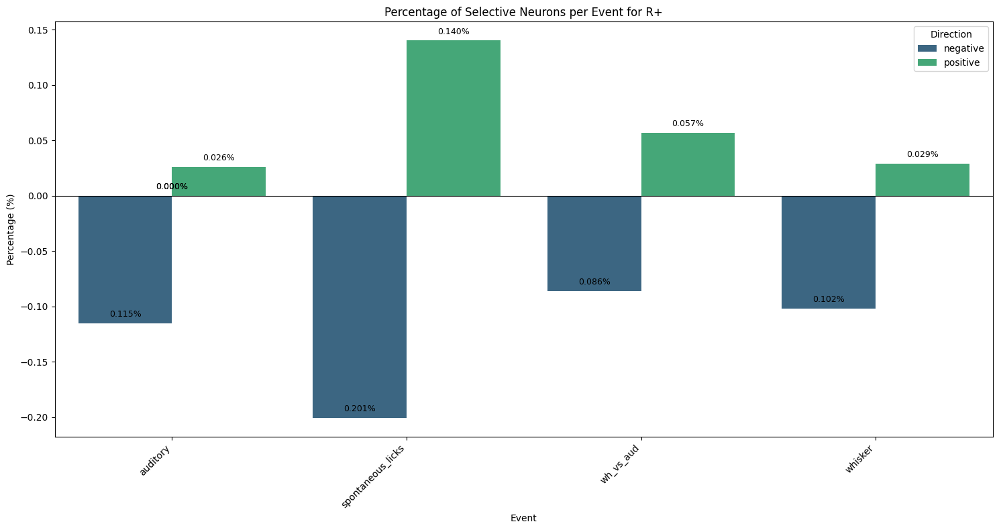

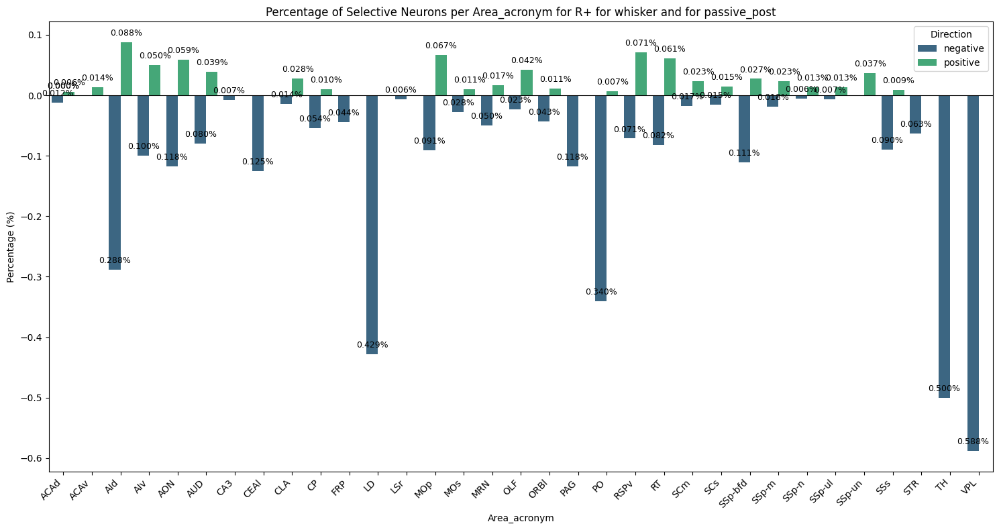

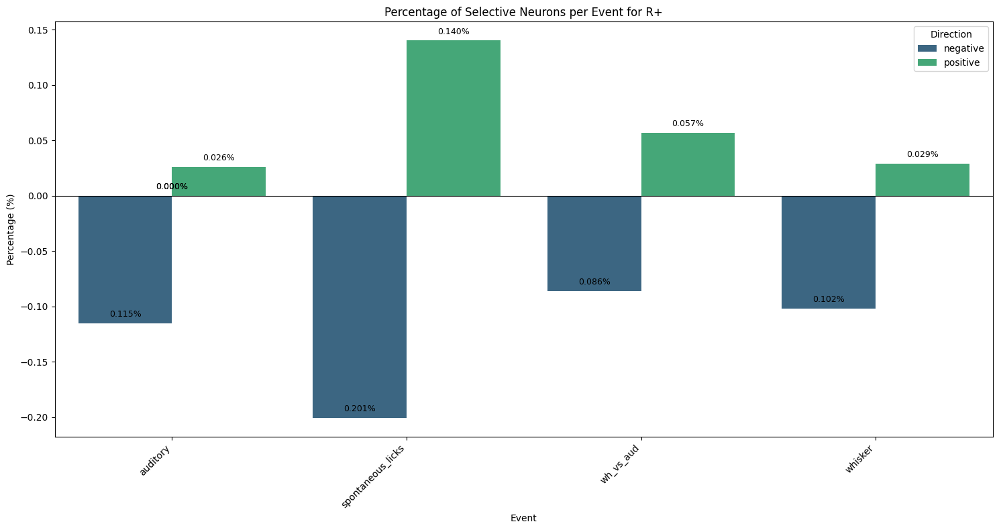

...

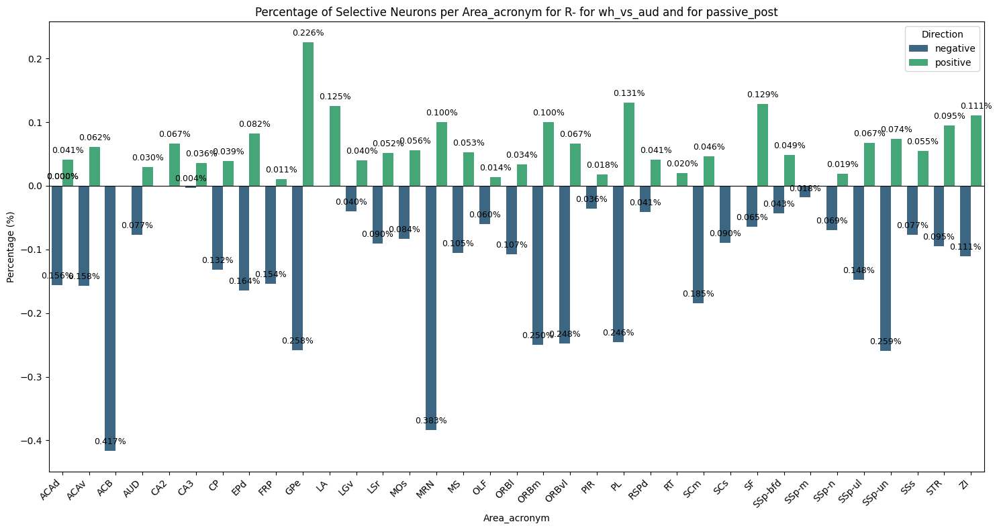

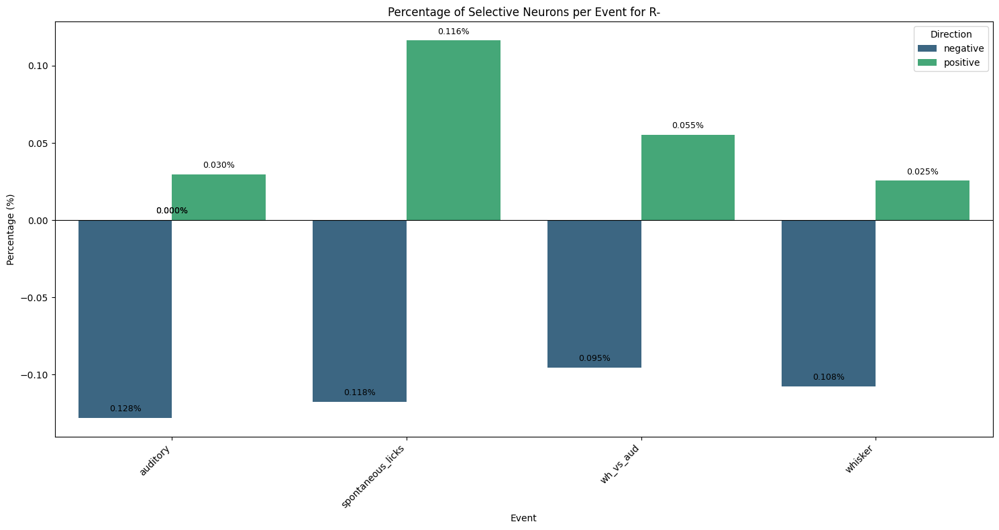

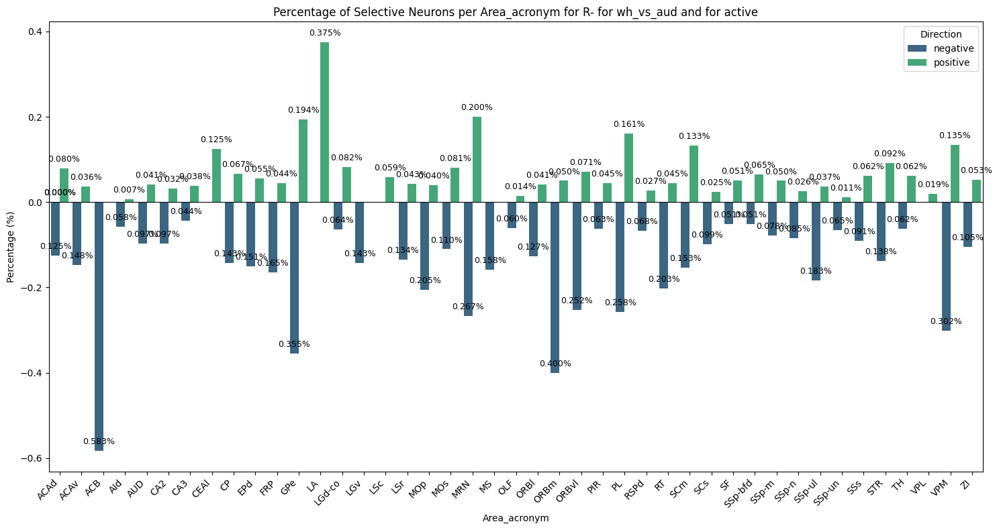

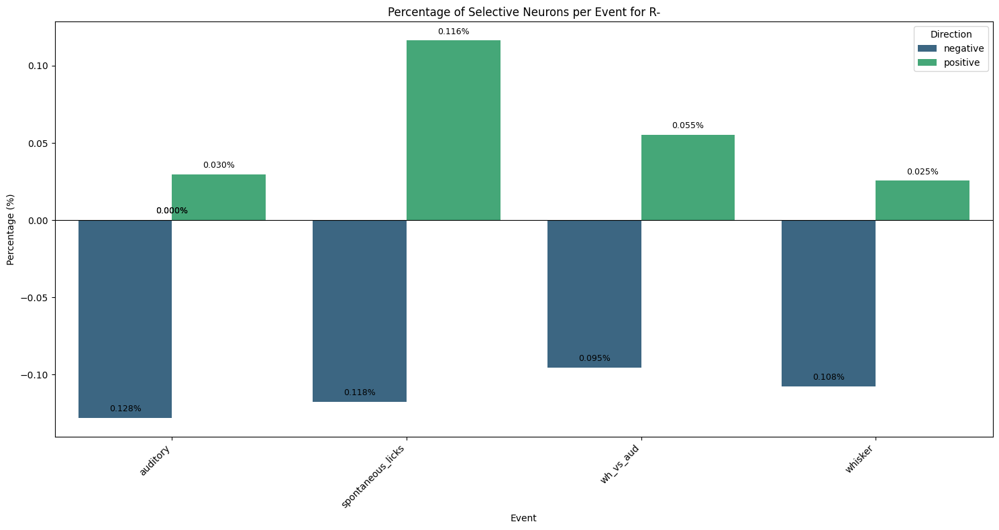

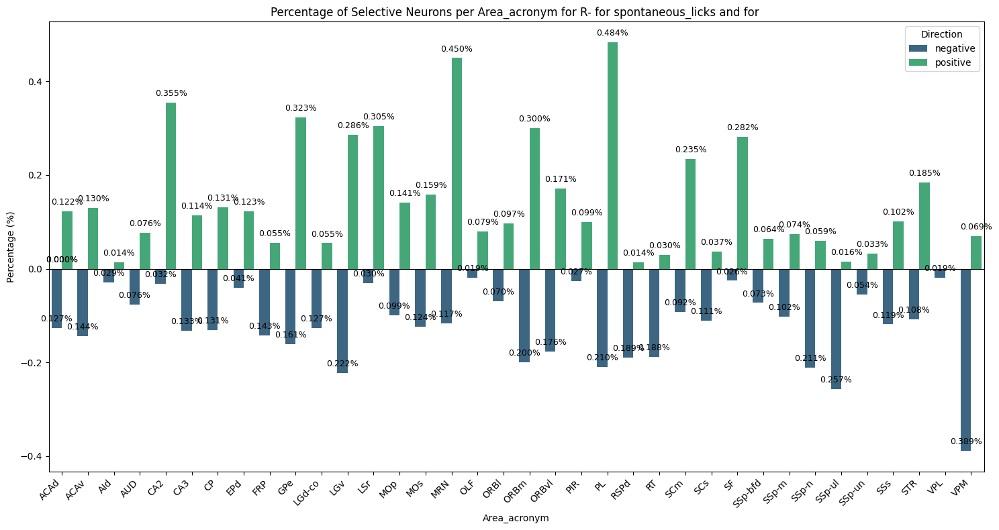

In [9]:
for wh_reward in ['R+', 'R-']:
    for event in ['whisker','auditory','wh_vs_aud', 'spontaneous_licks']:
        if event != 'spontaneous_licks':
            contexts = ['passive_pre', 'passive_post', 'active']
        else:
            contexts = ['']
        for context in contexts:
            if context == '':
                df_modif = df[(df['event']==event)]
            else:
                df_modif = df[(df['event']==event)&(df['context']==context)]

            # To plot per event
            plot_selectivity_direction_v4(df, by='event', filter_value='', wh_reward = wh_reward)

            # To plot per area_acronym
            plot_selectivity_direction_v4(df_modif, by='area_acronym', filter_value='', wh_reward = wh_reward, event_type = event, context = context)

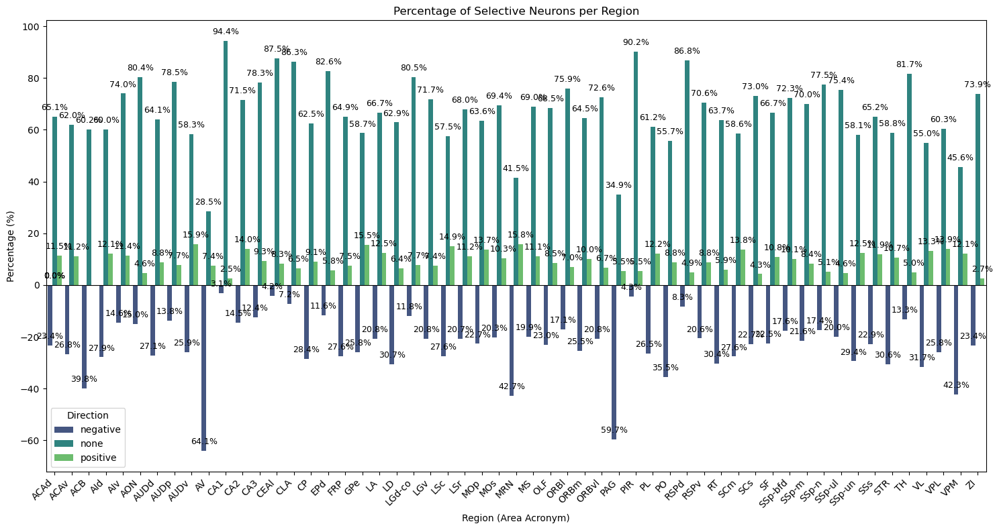

In [ ]:
plot_selectivity_direction_area(df, event='')

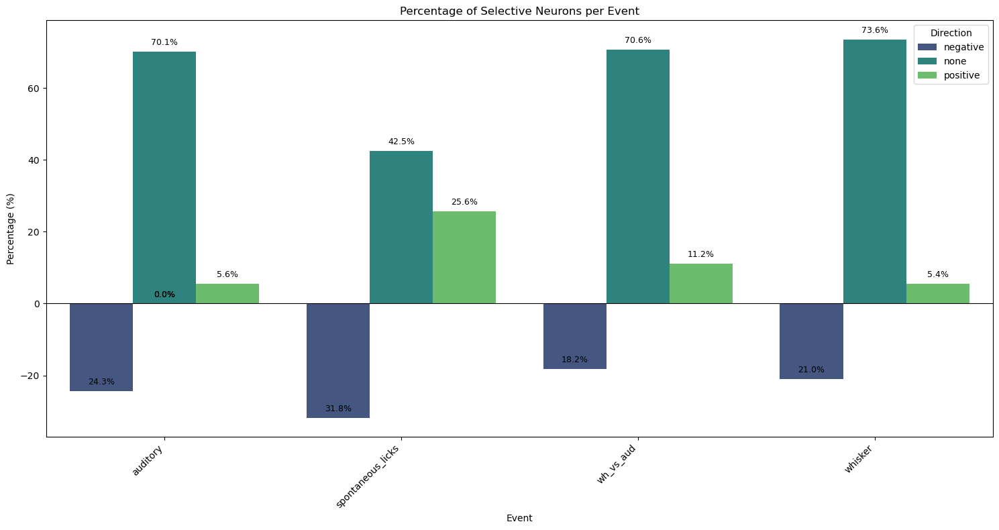

In [ ]:
#plot_selectivity_direction_mice(df)
#plot_selectivity_direction_event_direction(df)
#plot_selectivity_direction_event_context(df)
plot_selectivity_direction_event(df)
# axe en bas reste positive - override 
# A faire par 

In [ ]:
def plot_selectivity_direction(df, by='event', filter_value=''):

    # If filtering by event or area_acronym, only take rows corresponding to the given filter_value
    if filter_value != '':
        df = df[df[by] == filter_value]

    # Group by the specified parameter and direction to calculate counts
    selective_counts = df.groupby([by, 'direction']).size().reset_index(name='count')

    # Total counts for normalization purposes
    total_counts = selective_counts.groupby(by)['count'].sum().reset_index(name='total')

    # Merge to compute percentage of selectivity per specified parameter
    selective_percentages = selective_counts.merge(total_counts, on=by)
    selective_percentages['percentage'] = (selective_percentages['count'] / selective_percentages['total']) * 100

    # Adjust visualization values:
    # - Keep positive responses as-is
    # - For negative responses, map their magnitude to "below the baseline"
    selective_percentages['visual_percentage'] = selective_percentages.apply(
        lambda row: -row['percentage'] if row['direction'] == 'negative' else row['percentage'],
        axis=1
    )

    # Plotting
    plt.figure(figsize=(15, 8))

    # Create the bar plot with seaborn
    ax = sns.barplot(
        data=selective_percentages,
        x=by,
        y='visual_percentage',
        hue='direction',
        dodge=True,
        palette='viridis'
    )

    # Annotate the bars
    for p in ax.patches:
        percentage = f"{abs(p.get_height()):.1f}%"  # Always annotate using magnitude
        ax.annotate(
            percentage,
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center',
            va='bottom',
            fontsize=9,
            color='black',
            xytext=(0, 5),
            textcoords='offset points'
        )

    # Adjust legends to avoid duplicates
    handles, labels = ax.get_legend_handles_labels()
    unique_labels = dict(zip(labels, handles))
    ax.legend(unique_labels.values(), unique_labels.keys(), title='Direction')

    # Set axis labels and titles
    if filter_value != '':
        title = f'Percentage of Selective Neurons per {by.capitalize()} for {filter_value}'
    else:
        title = f'Percentage of Selective Neurons per {by.capitalize()}'

    plt.axhline(0, color='black', linewidth=0.8)  # Reference line at baseline
    plt.title(title)
    plt.ylabel('Percentage (%)')
    plt.xlabel(by.capitalize())
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_47472/1432300508.py:15: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='area_acronym', y='selective', hue='event', data=df, palette='viridis', ci = None)


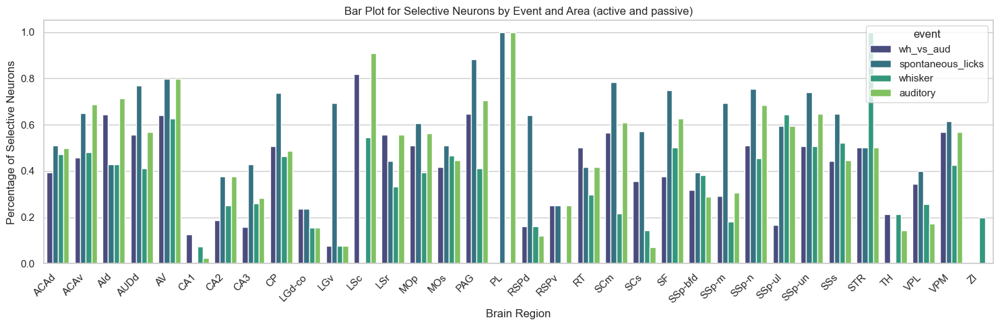

/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_47472/1432300508.py:27: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='area_acronym', y='selective', hue='context', data=df, palette='viridis', ci = None)


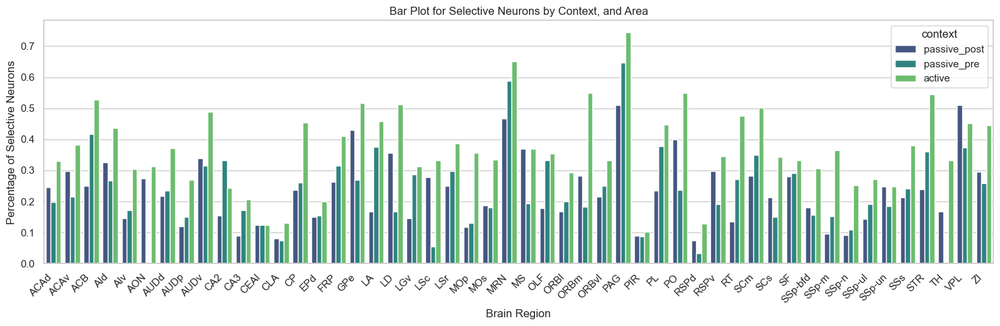

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the seaborn style
sns.set(style="whitegrid")

def plot_by_event(df, has_context = 0):
    if has_context != 0:
        df = df[df['has context'] == has_context]
        title = 'Bar Plot for Selective Neurons by Event and Area (active and passive)' if has_context else 'Bar Plot for Selective Neurons by Event and Area (active)'
    else:
        title = 'Bar Plot for Selective Neurons by Event and Area'
    df = df.sort_values(by='area_acronym')
    plt.figure(figsize=(15, 5))
    sns.barplot(x='area_acronym', y='selective', hue='event', data=df, palette='viridis', ci = None)
    plt.title(title)
    plt.xlabel('Brain Region')
    plt.ylabel('Percentage of Selective Neurons')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


def plot_by_context(df):
    df = df.sort_values(by='area_acronym')
    plt.figure(figsize=(15, 5))
    sns.barplot(x='area_acronym', y='selective', hue='context', data=df, palette='viridis', ci = None)
    plt.title('Bar Plot for Selective Neurons by Context, and Area')
    plt.xlabel('Brain Region')
    plt.ylabel('Percentage of Selective Neurons')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


plot_by_event(df, True)  
plot_by_context(df[df['has context']==False]) 

# Deep analysis with hypothesis

## Event-Specific Hypotheses:


- H1: Selective neurons exhibit event-specific response patterns.

Example: Neuronal selectivity will differ for:
Whisker stimuli vs auditory stimuli.
The whisker vs auditory comparison (post vs post) will show distinct neural activation patterns depending on context and reward presence.
Spontaneous licks might lead to different selectivity, reflecting spontaneous reward-related behavior rather than stimulus-induced selectivity.

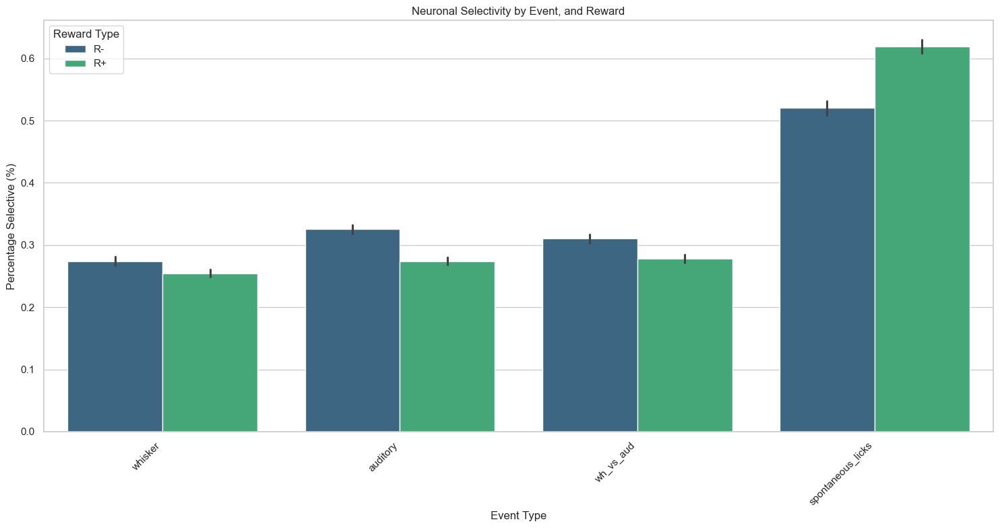

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the seaborn style
sns.set(style="whitegrid")


def plot_events_context_reward(df):
    """
    Create bar plots separated by event type, context, and reward presence (R+ vs R-).
    """

    # Filter only valid events categories if needed
    valid_events = ['whisker', 'auditory', 'wh_vs_aud', 'spontaneous_licks']
    df = df[df['event'].isin(valid_events)]

    # Create barplot comparing these groups by context and reward type
    plt.figure(figsize=(15, 8))
    sns.barplot(
        x='event', 
        y='selective', 
        hue='wh_reward', 
        data=df, 
        palette="viridis",
        dodge=True  # Separate bars by reward type
    )

    # Add plot titles and labels
    plt.title('Neuronal Selectivity by Event, and Reward')
    plt.xlabel('Event Type')
    plt.ylabel('Percentage Selective (%)')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title="Reward Type")
    plt.tight_layout()
    plt.show()


# Call the plotting function
plot_events_context_reward(df)


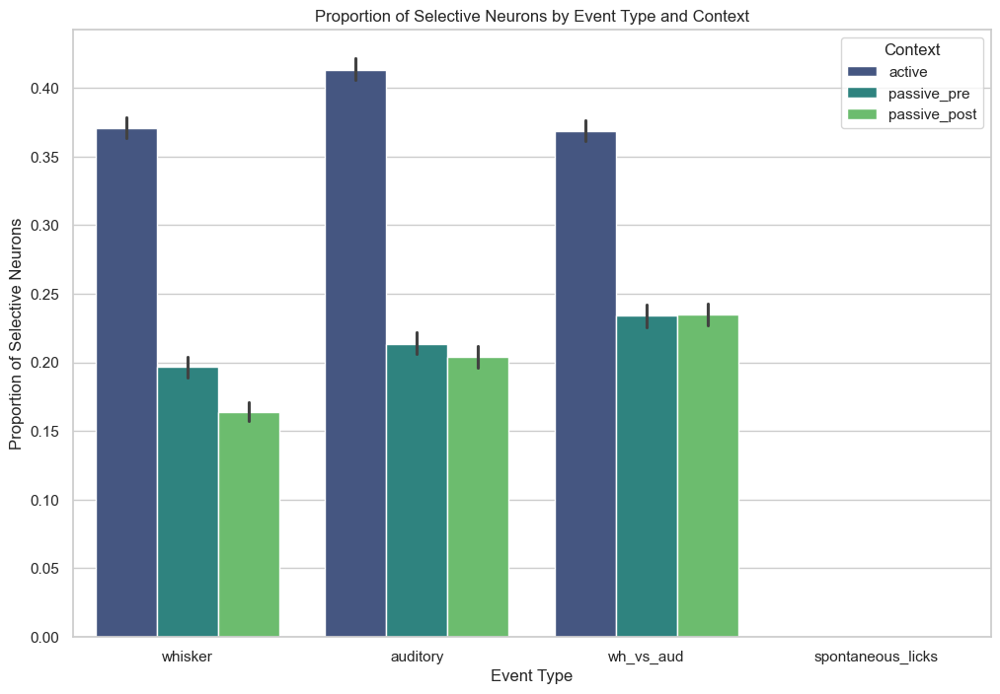

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(
    x='event',
    y='selective',
    hue='context',
    hue_order=['active', 'passive_pre', 'passive_post'],
    data=df,
    palette='viridis'
)

# Add plot titles and labels
plt.title('Proportion of Selective Neurons by Event Type and Context')
plt.xlabel('Event Type')
plt.ylabel('Proportion of Selective Neurons')
plt.legend(title='Context')

plt.show()

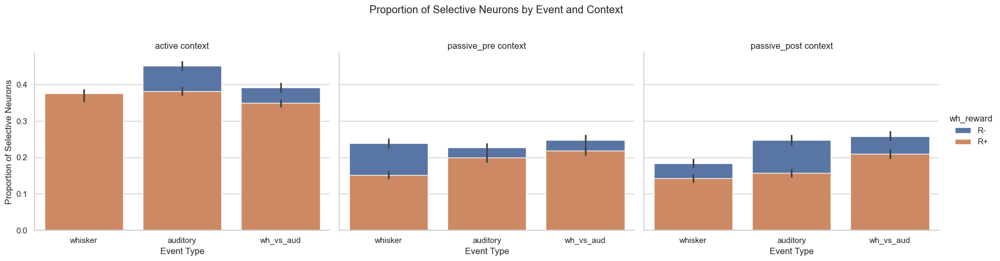

In [74]:
# Filter out spontaneous licks by removing NaN contexts
df_filtered = df[df['context'].notna()]

# Set seaborn theme
sns.set(style="whitegrid")

# Create FacetGrid to separate plots for 'active' vs 'passive' context comparisons
g = sns.FacetGrid(
    df_filtered, 
    col="context",  # Separate by context
    hue="wh_reward",  # Separate reward presence
    col_order=["active", "passive_pre", "passive_post"],  # Exclude NaN now
    height=5, 
    aspect=1.2
)

# Map the bar plot to the FacetGrid
g.map(sns.barplot, "event", "selective", order=df_filtered['event'].unique(), dodge=True)

# Add legend, titles, and other aesthetics
g.add_legend()
g.set_axis_labels("Event Type", "Proportion of Selective Neurons")
g.set_titles("{col_name} context")
plt.subplots_adjust(top=0.8)
g.fig.suptitle('Proportion of Selective Neurons by Event and Context')

# Display the plot
plt.show()

### Spontaneous_licks comparison

Event Type Comparison:

Each category on the x-axis (spontaneous_licks, whisker, and auditory) represents a specific event type.
The shape of the violins reflects the distribution of selective neuron proportions for that event.
Reward Presence (R+ vs R-):

The hue (blue for R- and orange for R+) shows how selective neuron proportions differ under reward and no-reward conditions for each event type.
If there is a significant difference between the distributions of R+ and R-, it suggests that reward presence influences selectivity.
Distribution Shape:

Wider sections of the violin indicate a higher density of neurons with a particular selectivity proportion.
Narrow sections indicate fewer neurons in that range.
Key Observations:

Spontaneous Licks:
Look at whether the shapes of the R+ and R- violins differ significantly. If the distributions overlap heavily, reward presence might not strongly influence selectivity for spontaneous licks.
Whisker and Auditory Events:
Compare the whisker and auditory distributions against spontaneous licks. If their shapes differ significantly, it indicates a distinct selectivity pattern.
Differences between R+ and R- within these events suggest reward-dependent selectivity.

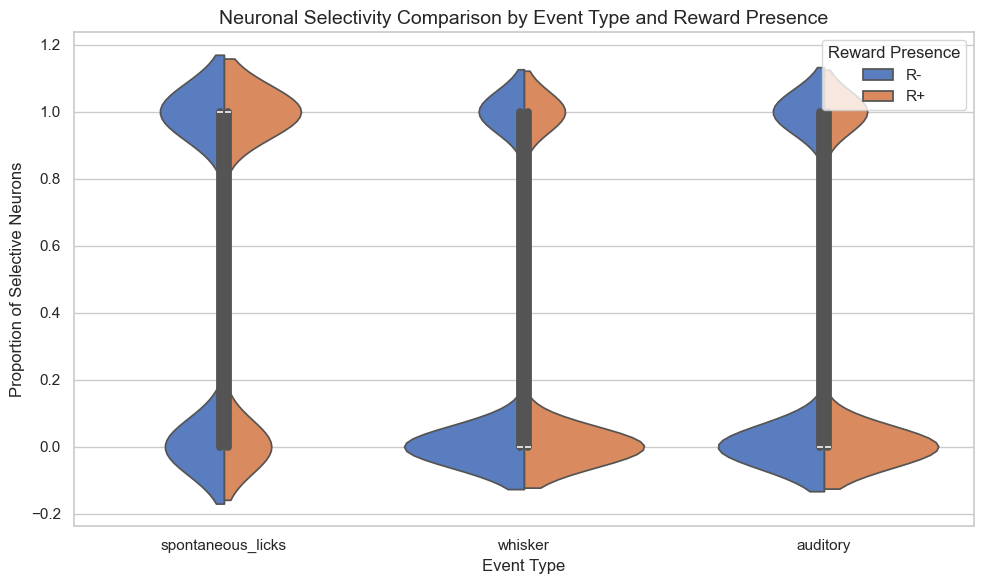

In [76]:
# Set seaborn theme
sns.set(style="whitegrid")

# Create the violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(
    data=df, 
    x="event", 
    y="selective", 
    hue="wh_reward", 
    split=True,  # Split the hue values
    palette="muted", 
    order=["spontaneous_licks", "whisker", "auditory"]
)

# Add titles and labels
plt.title("Neuronal Selectivity Comparison by Event Type and Reward Presence", fontsize=14)
plt.xlabel("Event Type", fontsize=12)
plt.ylabel("Proportion of Selective Neurons", fontsize=12)
plt.legend(title="Reward Presence", loc="upper right")

# Show the plot
plt.tight_layout()
plt.show()

### Stimulus Modality Effects
H3: Auditory and whisker stimuli lead to different patterns of neuronal selectivity across regions.


Example: Selectivity might differ between auditory and whisker stimuli because they engage distinct sensory pathways.

Prediction: Separate bar heights for auditory vs. whisker stimuli in each brain area would support this hypothesis.

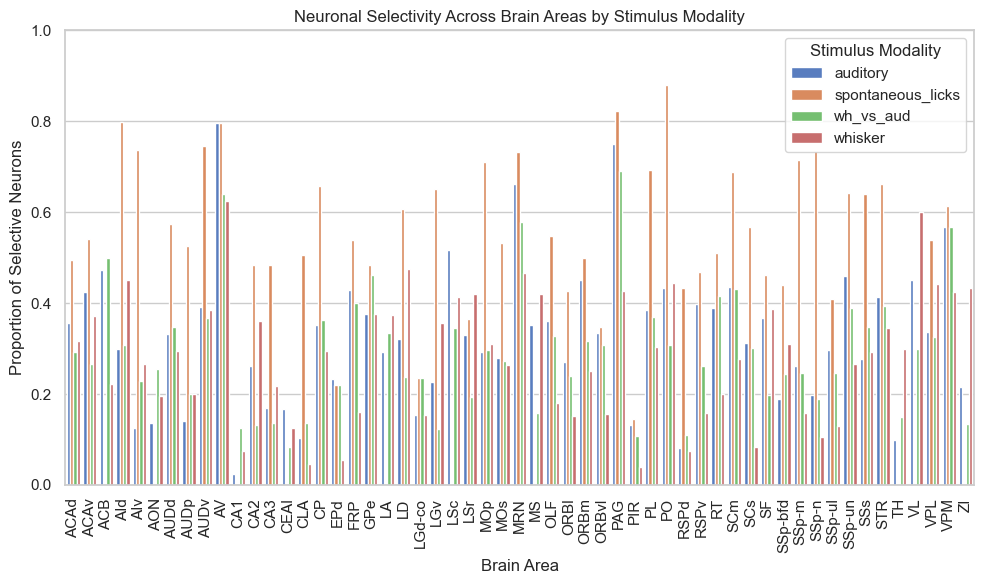

In [85]:
# Check if necessary columns exist
required_columns = ["area_acronym", "event", "selective"]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following columns are missing in the DataFrame: {missing_columns}")

# Ensure 'selective' column is numeric for aggregation
if not pd.api.types.is_numeric_dtype(df["selective"]):
    df["selective"] = pd.to_numeric(df["selective"], errors="coerce")


# Aggregate data by area_acronym and event
df_grouped = df.groupby(["area_acronym", "event"], as_index=False)["selective"].mean()

# Create the grouped bar plot
plt.figure(figsize=(10, 6))
sns.barplot(
    data=df_grouped,
    x="area_acronym", 
    y="selective", 
    hue="event",  # Separate by auditory and whisker
    palette="muted",
)

# Add labels and title
plt.xlabel("Brain Area")
plt.xticks(rotation = 90)
plt.ylabel("Proportion of Selective Neurons")
plt.title("Neuronal Selectivity Across Brain Areas by Stimulus Modality")
plt.legend(title="Stimulus Modality", loc="upper right")
plt.ylim(0, 1)  # Adjust Y-axis range as needed

# Display the plot
plt.tight_layout()
plt.show()


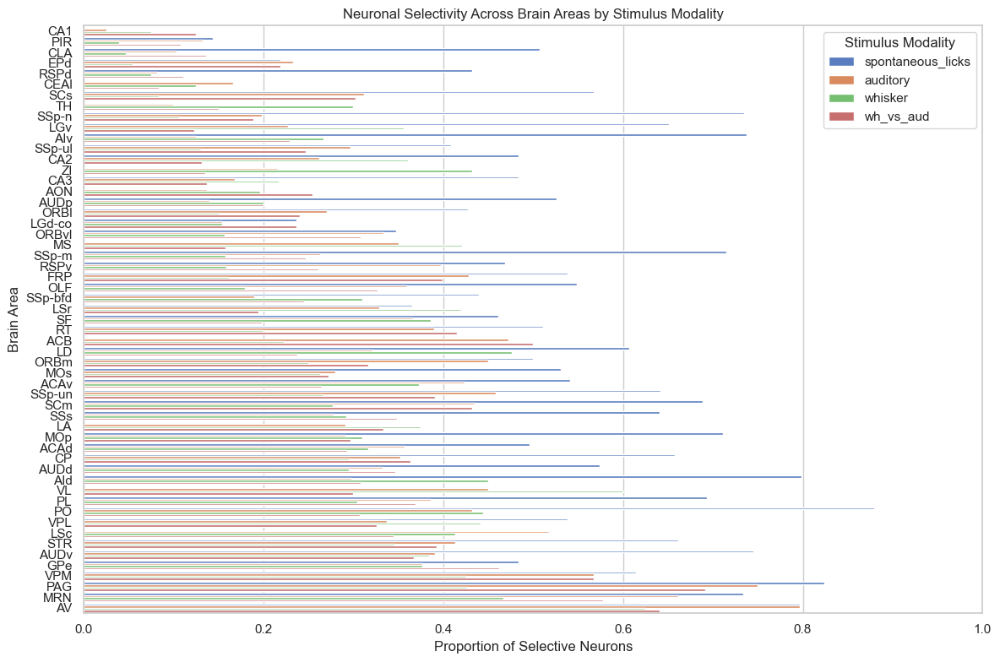

In [86]:
# Check if necessary columns exist
required_columns = ["area_acronym", "event", "selective"]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following columns are missing in the DataFrame: {missing_columns}")

# Ensure 'selective' column is numeric for aggregation
if not pd.api.types.is_numeric_dtype(df["selective"]):
    df["selective"] = pd.to_numeric(df["selective"], errors="coerce")


# Aggregate data by area_acronym and event
df_grouped = df.groupby(["area_acronym", "event"], as_index=False)["selective"].mean()

# Sort data by mean value for better visualization (optional but can improve plot clarity)
df_grouped = df_grouped.sort_values(by="selective", ascending=True)

# Create horizontal grouped bar plot
plt.figure(figsize=(12, 8))  # Increase figure size for better visualization
sns.barplot(
    data=df_grouped,
    y="area_acronym",  # Switch to horizontal plot
    x="selective",
    hue="event",
    palette="muted",
)

# Add labels and title
plt.ylabel("Brain Area")
plt.xlabel("Proportion of Selective Neurons")
plt.title("Neuronal Selectivity Across Brain Areas by Stimulus Modality")
plt.legend(title="Stimulus Modality", loc="upper right")
plt.xlim(0, 1)  # Adjust x-axis range

# Display the plot
plt.tight_layout()
plt.show()


## H3: Reward presence leads to event-specific selectivity changes.
Example: Neural selectivity will differ for:
Whisker stimuli with R+ rewards vs whisker stimuli with R- rewards.
Auditory stimuli with R+ rewards vs auditory stimuli with R- rewards.
Prediction: Comparing auditory vs whisker selectivity under these conditions should show distinct patterns.

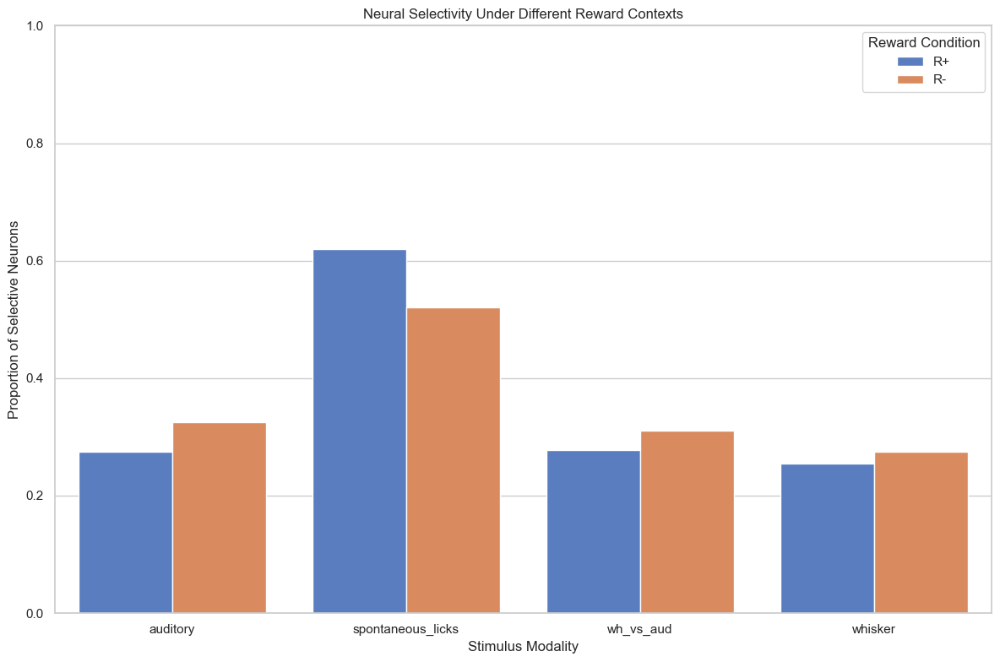

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd



# Aggregate data by event type and reward condition
df_grouped = df.groupby(["event", "wh_reward"], as_index=False)["selective"].mean()

# Create the grouped bar plot
plt.figure(figsize=(12, 8))
sns.barplot(
    data=df_grouped,
    x="event",
    y="selective",
    hue="wh_reward",  # Separate by R+ and R- rewards
    palette="muted"
)

# Add labels and title
plt.xlabel("Stimulus Modality")
plt.ylabel("Proportion of Selective Neurons")
plt.title("Neural Selectivity Under Different Reward Contexts")
plt.legend(title="Reward Condition", loc="upper right")
plt.ylim(0, 1)  # Ensure Y-axis fits proportions between 0 and 1

# Rotate ticks for better clarity
plt.xticks(rotation=0)

# Display the plot
plt.tight_layout()
plt.show()


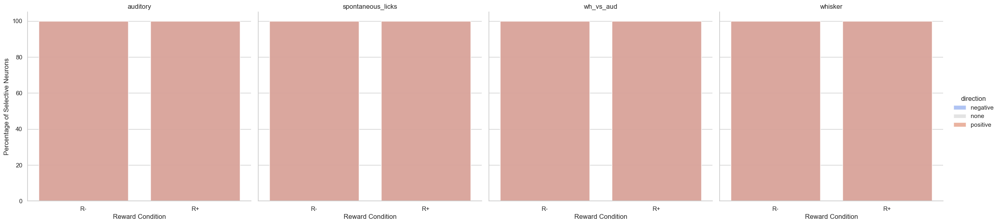

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Aggregate data by event type, reward condition, and direction
df_grouped = df.groupby(["event", "wh_reward", "direction"], as_index=False)["selective"].mean()

# Ensure percentage calculations are normalized by splitting data by positive/negative direction
df_grouped["direction_percentage"] = df_grouped["selective"] * 100  # Convert proportions to percentages

# Set up a FacetGrid for visualizing each "stimulus modality" separately
g = sns.FacetGrid(
    df_grouped,
    col="event",  # Separate each event type into its own facet
    hue="direction",  # Map direction (positive/negative) with color coding
    palette="coolwarm",
    sharey=True,
    height=6,
)

# Map bar plots to each facet
g.map(sns.barplot, "wh_reward", "direction_percentage", order=["R-", "R+"], alpha=0.8)

# Customize axes, legends, and titles
g.set_axis_labels("Reward Condition", "Percentage of Selective Neurons")
g.set_titles("{col_name}")
g.add_legend()
plt.subplots_adjust(top=0.9)  # Allow space for titles and other elements

# Display the plot
plt.show()


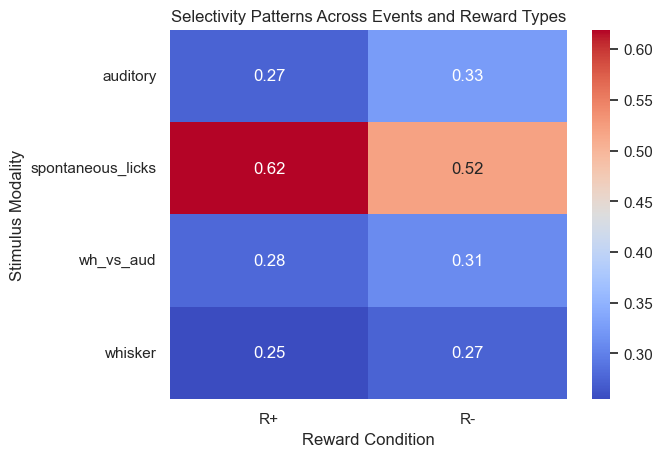

In [98]:
df_pivot = df.pivot_table(values="selective", index="event", columns=["wh_reward"], aggfunc="mean")

sns.heatmap(df_pivot, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Selectivity Patterns Across Events and Reward Types")
plt.ylabel("Stimulus Modality")
plt.xlabel("Reward Condition")
plt.show()


### H4: The interaction of reward type and event leads to differential selectivity.
Example: For whisker vs auditory comparisons, reward presence may lead to greater selectivity for one stimulus type over the other depending on reward probability or context.
Prediction: This would manifest as different bar heights between reward types (R+ vs R-) under whisker vs auditory conditions.

In [11]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Convert selective column to numeric safely
#df['selective'] = pd.to_numeric(df['selective'], errors='coerce')  # Convert invalid values to NaN


# Fit the two-way ANOVA model
model = smf.ols('selective ~ C(event) * C(wh_reward)', data=df).fit()

# Perform ANOVA
anova_table = sm.stats.anova_lm(model, typ=2)

# Display the ANOVA results
print(anova_table)


ValueError: endog has evaluated to an array with multiple columns that has shape (122404, 2). This occurs when the variable converted to endog is non-numeric (e.g., bool or str).

### H5: Spontaneous licks influence neuronal selectivity independently of auditory or whisker events.
Example: Lick behavior may show distinct selective patterns, especially in areas associated with reward or movement.
Prediction: The spontaneous licks will lead to increased selectivity in areas related to reward prediction or motor preparation.

In [12]:
import statsmodels.api as sm


# Create a binary variable to identify spontaneous licks
df['spontaneous_licks'] = df['event'] == 'spontaneous_licks'  # Map the event condition to a boolean
df['spontaneous_licks'] = df['spontaneous_licks'].astype(int)  # Convert boolean to integer (0 or 1)

# Ensure neuronal selectivity is valid numeric or boolean
df['selective'] = pd.to_numeric(df['selective'], errors='coerce')
df = df.dropna(subset=['selective'])  # Drop NaN rows


# Create the model
X = df[['spontaneous_licks']]  # Independent variable
y = df['selective']  # Dependent variable

# Add constant term for intercept
X = sm.add_constant(X)

# Fit the logistic regression model
model = sm.Logit(y, X).fit()

# Display results
print(model.summary())


/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_1096/1358949039.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spontaneous_licks'] = df['event'] == 'spontaneous_licks'  # Map the event condition to a boolean
/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykernel_1096/1358949039.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spontaneous_licks'] = df['spontaneous_licks'].astype(int)  # Convert boolean to integer (0 or 1)
/var/folders/p6/m1p5k4zj0yn9mk66d_dh7pn40000gn/T/ipykern

Optimization terminated successfully.
         Current function value: 0.608892
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:              selective   No. Observations:               122404
Model:                          Logit   Df Residuals:                   122402
Method:                           MLE   Df Model:                            1
Date:                Tue, 10 Dec 2024   Pseudo R-squ.:                 0.03155
Time:                        13:58:44   Log-Likelihood:                -74531.
converged:                       True   LL-Null:                       -76959.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -0.9165      0.007   -135.310      0.000      -0.930      -0.903
spontane

## Interaction wise hypothesis

### H6: Context × Event interaction hypothesis.
Example: Whisker stimuli in the active context may lead to higher selectivity compared to auditory stimuli in the same context, but this may reverse in the passive context.
Prediction: Comparing bar plots for whisker vs auditory events across active/passive contexts should reveal this differential response pattern.

### H7: Event × Reward interaction hypothesis.
Example: Selectivity for whisker stimuli will differ from auditory stimuli when comparing R+ vs R- across different event types.
Prediction: For auditory stimuli under R+ reward conditions, neuronal selectivity might be stronger, while whisker responses will exhibit a different trend.

### H8: Context × Reward × Event interaction hypothesis.
Example: The combination of context, reward type, and event type (whisker vs auditory, spontaneous lick) leads to complex neuronal selectivity patterns.
Prediction: Cross-comparisons of bar plots will show that reward effects depend on both event type and the context in which the events are processed.

In [65]:
ZI = df[df['area_acronym']=='ZI']
CA2 = df[df['area_acronym']=='CA2']
SSp_bfd = df[df['area_acronym']=='SSp-bfd']
SSs = df[df['area_acronym']=='SSs']
MOs = df[df['area_acronym']=='MOs']
AUD = df[df['area_acronym']=='AUDp']

In [54]:
df['area_acronym'].unique()

array(['CA3', 'AUDp', 'CA2', 'STR', 'GPe', 'CP', 'SSp-n', 'MOp', 'MOs',
       'SSp-bfd', 'ZI', 'LGv', 'AUDd', 'RT', 'CEAl', 'SSs', 'AUDv', 'AIv',
       'AId', 'SSp-m', 'LA', 'SF', 'MS', 'LSr', 'LSc', 'ACAv', 'ACAd',
       'OLF', 'ORBl', 'FRP', 'MRN', 'PAG', 'SCm', 'SCs', 'RSPv', 'RSPd',
       'ACB', 'ORBvl', 'ORBm', 'PL', 'EPd', 'PIR', 'SSp-un', 'SSp-ul',
       'CLA', 'PO', 'VPL', 'LD', 'TH', 'AON', 'VPM', 'LGd-co', 'CA1',
       'AV'], dtype=object)

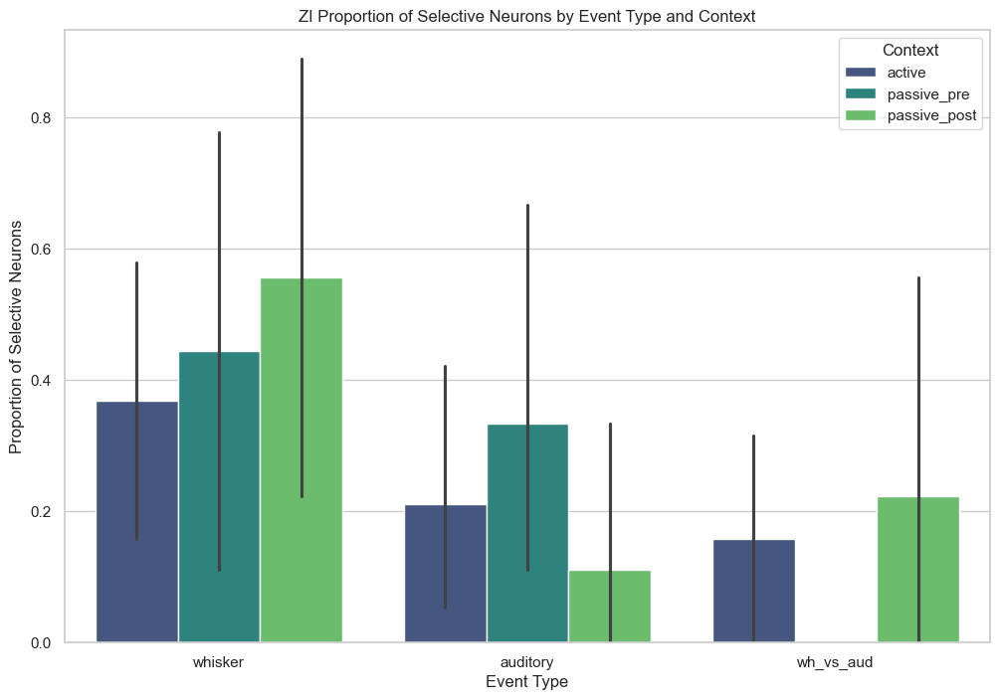

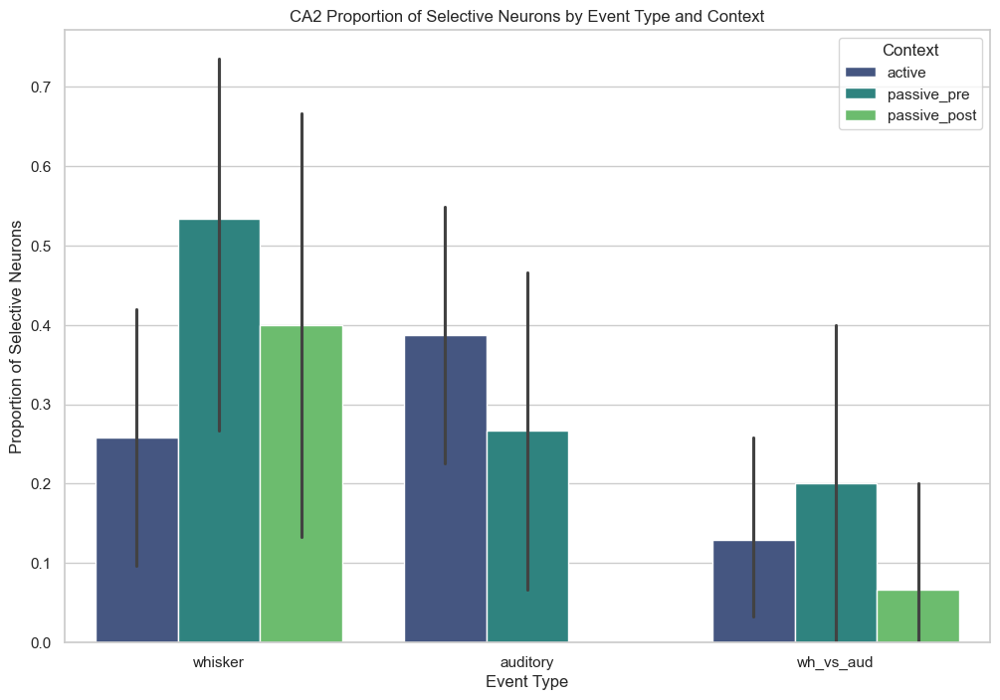

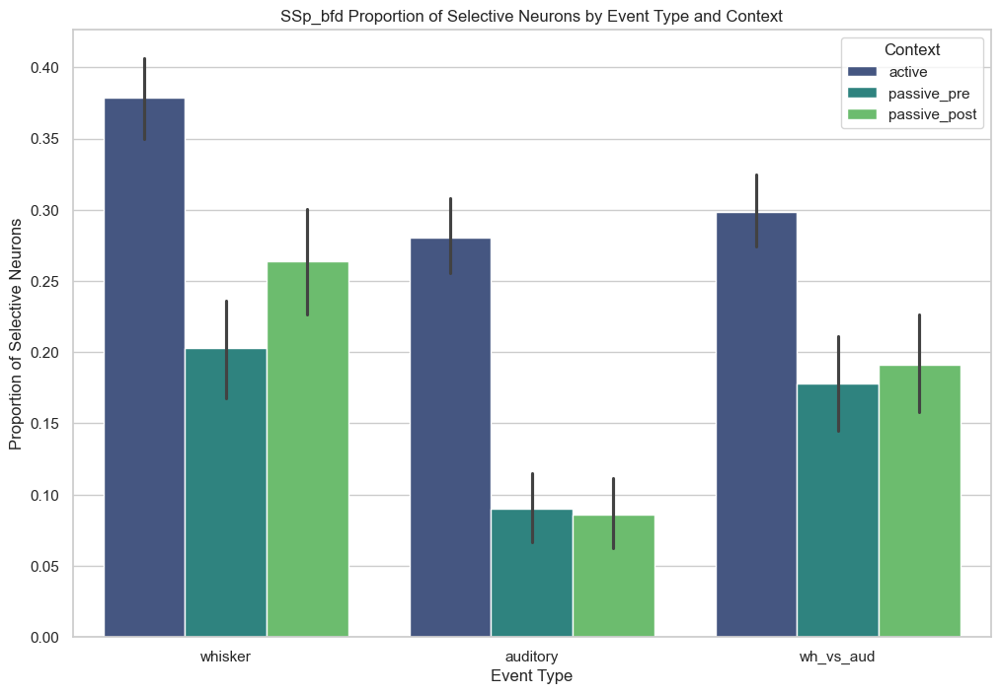

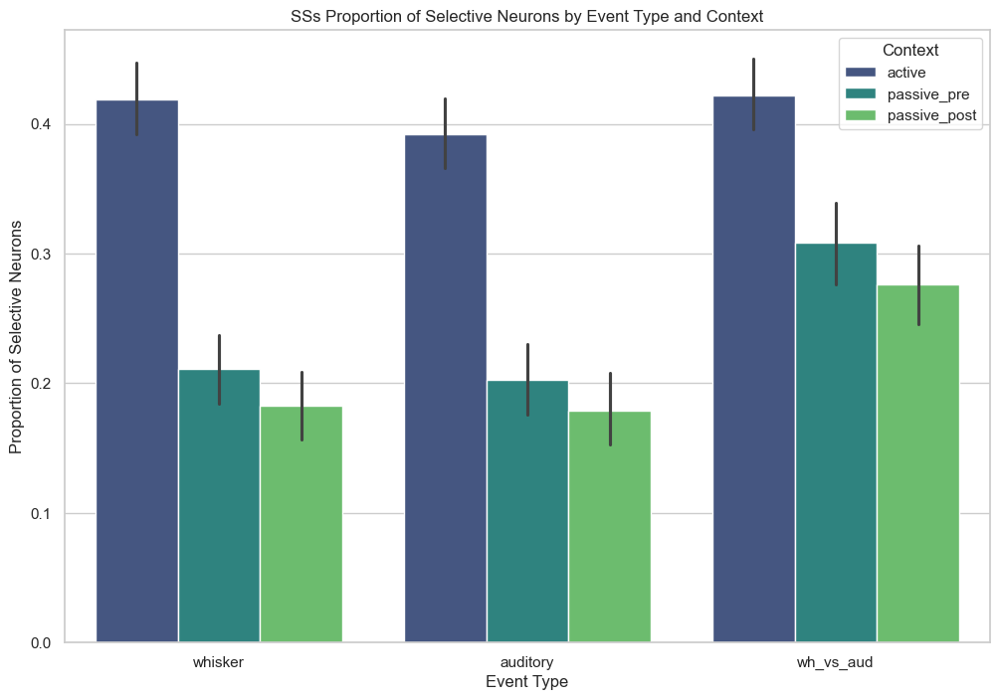

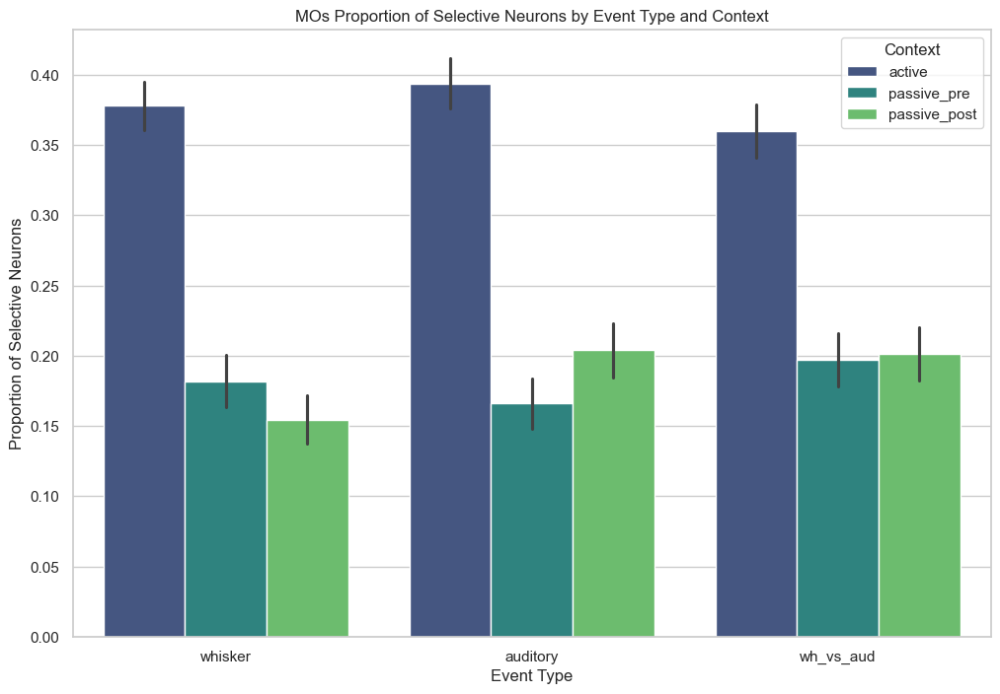

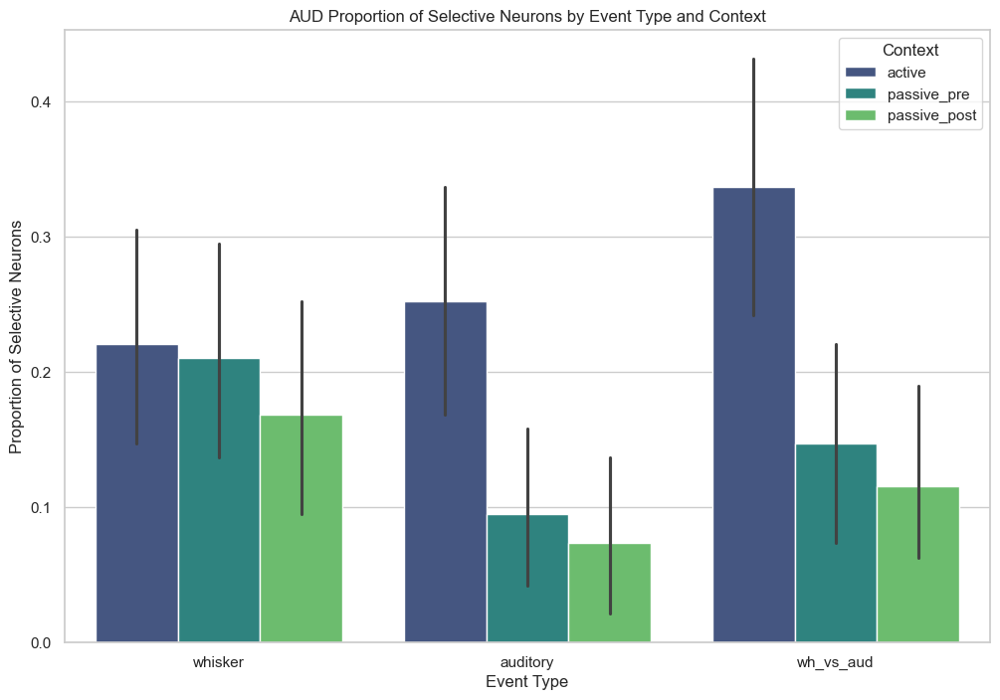

In [71]:
names = ["ZI", "CA2", "SSp_bfd", "SSs", "MOs", "AUD"]
for i, df_ in enumerate([ZI, CA2, SSp_bfd, SSs, MOs, AUD]):
    plt.figure(figsize=(12, 8))
    sns.barplot(
        x='event',
        y='selective',
        hue='context',
        hue_order=['active', 'passive_pre', 'passive_post'],
        data=df_[df_['event']!='spontaneous_licks'],
        palette='viridis'
    )

    # Add plot titles and labels
    plt.title(f'{names[i]} Proportion of Selective Neurons by Event Type and Context')
    plt.xlabel('Event Type')
    plt.ylabel('Proportion of Selective Neurons')
    plt.legend(title='Context')
    # Add percentage annotations
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height:.1f}%', 
                    xy=(p.get_x() + p.get_width() / 2., height),
                    xytext=(0, 5),  # Offset annotation slightly above the bar
                    textcoords='offset points',
                    ha='center', va='bottom', fontsize=8)
        
    plt.show()